In [1]:
"""import sys
sys.path.append('/home/mancusoa/Paper_Plots/')
from xenonnt_plot_style import XENONPlotStyle as xps
xps.use('xenonnt')"""

"import sys\nsys.path.append('/home/mancusoa/Paper_Plots/')\nfrom xenonnt_plot_style import XENONPlotStyle as xps\nxps.use('xenonnt')"

In [1]:
import strax
import straxen
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib
from scipy.optimize import curve_fit
import scipy.stats as stats
import datetime
from iminuit import Minuit
from iminuit.cost import LeastSquares
import iminuit
from immutabledict import immutabledict
from itertools import chain
import os

In [2]:
import veto_ref_mon_2

In [4]:
st = straxen.contexts.xenonnt_online()
st.storage.append(strax.DataDirectory("/project2/lgrandi/mancusoa/",readonly=True))
st.storage.append(strax.DataDirectory("../scratch-midway2/ref_mon/",readonly=True))
st.storage.append(strax.DataDirectory("../scratch-midway2/",readonly=True))

#st.storage.append(strax.DataDirectory("./strax_data",readonly=True))
st.register(veto_ref_mon_2.nVeto_reflectivity)

You specified _auto_append_rucio_local=True and you are not on dali compute nodes,so we will add the following rucio local path:  /project/lgrandi/rucio/


veto_ref_mon_2.nVeto_reflectivity

In [5]:
#st.storage.pop(5)

In [6]:
df=st.select_runs(run_mode="nVeto_LASER_calibration",available="ref_mon_nv")
df=df.iloc[::-1]
df

Checking data availability:   0%|          | 0/3 [00:00<?, ?it/s]

/opt/XENONnT/anaconda/envs/XENONnT_development/lib/python3.9/site-packages/straxen/url_config.py:756: UserWarning: From straxen version 2.1.0 onward, URLConfig parameterswill be sorted alphabetically before being passed to the plugins, this will change the lineage hash for non-sorted URLs. To load data processed with non-sorted URLs, you will need to use an older version.
  warnings.warn(


,name,number,mode,end,source,start,tags,livetime,raw_records_available,ref_mon_nv_available,peak_basics_available
14233,042605,42605,nVeto_LASER_calibration,2022-05-03 14:53:10.581,,2022-05-03 14:48:07.739,nv_ref_mon,0 days 00:05:02.842000,False,True,False
14149,042689,42689,nVeto_LASER_calibration,2022-05-06 08:17:21.418,,2022-05-06 08:12:15.135,nv_ref_mon,0 days 00:05:06.283000,False,True,False
14148,042690,42690,nVeto_LASER_calibration,2022-05-06 08:24:38.900,,2022-05-06 08:19:35.845,nv_ref_mon,0 days 00:05:03.055000,False,True,False
14147,042691,42691,nVeto_LASER_calibration,2022-05-06 08:32:02.944,,2022-05-06 08:27:00.046,nv_ref_mon,0 days 00:05:02.898000,False,True,False
14146,042692,42692,nVeto_LASER_calibration,2022-05-06 08:38:54.911,,2022-05-06 08:33:52.101,nv_ref_mon,0 days 00:05:02.810000,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...
403,056435,56435,nVeto_LASER_calibration,2023-11-24 18:19:09.345,,2023-11-24 18:14:06.174,,0 days 00:05:03.171000,False,True,False
370,056468,56468,nVeto_LASER_calibration,2023-11-25 11:44:37.847,,2023-11-25 11:39:33.871,,0 days 00:05:03.976000,False,True,False
354,056484,56484,nVeto_LASER_calibration,2023-11-26 10:08:11.333,,2023-11-26 10:03:08.293,,0 days 00:05:03.040000,False,True,False
339,056499,56499,nVeto_LASER_calibration,2023-11-27 15:39:31.142,,2023-11-27 15:34:27.922,,0 days 00:05:03.220000,False,True,False


In [5]:
df_raw=st.select_runs(run_mode="nVeto_LASER_calibration",available="raw_records_nv")
df_raw=df_raw.iloc[::-1]
df_raw

Checking data availability:   0%|          | 0/3 [00:00<?, ?it/s]

/opt/XENONnT/anaconda/envs/XENONnT_development/lib/python3.9/site-packages/straxen/url_config.py:756: UserWarning: From straxen version 2.1.0 onward, URLConfig parameterswill be sorted alphabetically before being passed to the plugins, this will change the lineage hash for non-sorted URLs. To load data processed with non-sorted URLs, you will need to use an older version.
  warnings.warn(


,name,number,mode,end,source,start,tags,livetime,raw_records_nv_available,raw_records_available,peak_basics_available
154,056435,56435,nVeto_LASER_calibration,2023-11-24 18:19:09.345,,2023-11-24 18:14:06.174,,0 days 00:05:03.171000,True,False,False
121,056468,56468,nVeto_LASER_calibration,2023-11-25 11:44:37.847,,2023-11-25 11:39:33.871,,0 days 00:05:03.976000,True,False,False
105,056484,56484,nVeto_LASER_calibration,2023-11-26 10:08:11.333,,2023-11-26 10:03:08.293,,0 days 00:05:03.040000,True,False,False
90,056499,56499,nVeto_LASER_calibration,2023-11-27 15:39:31.142,,2023-11-27 15:34:27.922,,0 days 00:05:03.220000,True,False,False
75,056514,56514,nVeto_LASER_calibration,2023-11-28 10:24:32.460,,2023-11-28 10:19:31.711,,0 days 00:05:00.749000,True,False,False
74,056515,56515,nVeto_LASER_calibration,2023-11-28 10:36:22.822,,2023-11-28 10:31:21.263,laser_diffuser_ball_att83_and_n_veto_ch1,0 days 00:05:01.559000,True,False,False
12,056577,56577,nVeto_LASER_calibration,2023-12-01 13:01:41.476,,2023-12-01 12:56:39.955,"laser_diffuser_ball_att83,n_veto_ch4",0 days 00:05:01.521000,True,False,False


In [11]:
channel1 = ["055453","055702"]
channel2 = ["055454","055706","055891"]
channel3 = ["055455","055709","055892"]
channel4 = ["055457","055711","055894"]
channel_other = channel1+channel2+channel3
channel_other

['055453',
 '055702',
 '055454',
 '055706',
 '055891',
 '055455',
 '055709',
 '055892']

In [8]:
for i in df_raw["name"].values:
    if not st.is_stored(i,"ref_mon_nv"):
        st.make(i,'ref_mon_nv',progress_bar=True)

Loading ref_mon_nv: |          | 0.00 % [00:00<?]

Loading ref_mon_nv: |          | 0.00 % [00:00<?]

Loading ref_mon_nv: |          | 0.00 % [00:00<?]

In [12]:
start = np.datetime64('2023-09-30T09:44:45.865000000')
#end = np.datetime64('2023-10-26T10:44:45.865000000')
timedelta_ns = np.timedelta64(1800, 's')
#mask_livetime = df_lone["livetime"]>timedelta_ns
mask_data = df["start"]>=start
#mask_data &= df_lone["start"]<=end
mask_run = df["name"]!="054576"
mask_run_other_channels= df["name"]!= channel_other[0]
for i in range(1,len(channel_other)):
    mask_run_other_channels &= df["name"]!= channel_other[i]
df_cut=df[mask_data&mask_run&mask_run_other_channels]#&mask_livetime]
run_list = df_cut["name"].values
date = df_cut["start"].values
livetime = df_cut["livetime"].values

In [13]:
date = []
livetime = []
for name in run_list:
    # Assuming 'name' is unique in your DataFrame
    entry = df[df['name'] == name].iloc[0]
    
    # Extract 'start' and 'livetime'
    start_value = entry['start']
    livetime_value = entry['livetime']

    # Append to the lists
    date.append(start_value)
    livetime.append(livetime_value)

# Print the results
print("Start Dates:", date)
print("Livetimes:", livetime)



Start Dates: [Timestamp('2023-10-04 13:52:17.552000'), Timestamp('2023-10-05 10:47:01.409000'), Timestamp('2023-10-05 10:53:18.221000'), Timestamp('2023-10-05 12:48:19.361000'), Timestamp('2023-10-05 12:55:48.682000'), Timestamp('2023-10-05 14:44:10.118000'), Timestamp('2023-10-05 14:50:18.147000'), Timestamp('2023-10-06 08:53:43.461000'), Timestamp('2023-10-06 13:51:33.850000'), Timestamp('2023-10-07 06:55:12.647000'), Timestamp('2023-10-07 15:31:44.898000'), Timestamp('2023-10-08 08:12:15.103000'), Timestamp('2023-10-08 15:29:06.087000'), Timestamp('2023-10-09 11:57:40.281000'), Timestamp('2023-10-09 15:59:51.556000'), Timestamp('2023-10-10 15:28:05.959000'), Timestamp('2023-10-11 07:41:32.933000'), Timestamp('2023-10-11 15:23:33.223000'), Timestamp('2023-10-12 08:29:32.491000'), Timestamp('2023-10-13 09:31:51.872000'), Timestamp('2023-10-13 17:30:35.631000'), Timestamp('2023-10-14 08:18:49.615000'), Timestamp('2023-10-14 16:53:39.678000'), Timestamp('2023-10-15 07:17:13.146000'), Ti

In [14]:
dataframe = pd.DataFrame({"Date":date,"Run":run_list})
dataframe

,Date,Run
0,2023-10-04 13:52:17.552,054318
1,2023-10-05 10:47:01.409,054370
2,2023-10-05 10:53:18.221,054371
3,2023-10-05 12:48:19.361,054374
4,2023-10-05 12:55:48.682,054375
...,...,...
76,2023-11-24 18:14:06.174,056435
77,2023-11-25 11:39:33.871,056468
78,2023-11-26 10:03:08.293,056484
79,2023-11-27 15:34:27.922,056499


In [15]:
def cut_area_and_pmts(dt,min_area=0.3,min_n_pmts=3):
    
    # cut in area
    
    area_mask = dt['area'] >= min_area
    channel_mask= dt["channel"]!= 2106
    dt_cut = dt[area_mask& channel_mask]
    
    
    # cut in n_pmts
    
    # split in events
    a = np.split(dt_cut,np.where(np.diff(dt_cut['number'],prepend=dt_cut['number'][0])!=0)[0])
    
    # cut
    a_ = np.array([i for i in a if len(i)>=min_n_pmts ],dtype=object)
    
    # reshape
    a_ = np.array(list(chain.from_iterable(a_)))
    
    return a_


In [16]:
st.data_info("ref_mon_nv")

,Field name,Data type,Comment
0,time,int64,Start time since unix epoch [ns]
1,endtime,int64,Exclusive end time since unix epoch [ns]
2,time_since_trigger,int32,Time with respect to the precedent trigger [ns]
3,channel,int16,Channel of the hit
4,area,float32,Area of the hit [PE]
5,number,int32,Number of event


In [17]:
ref_mon = []

    

for run in run_list:
    
    dt = st.get_array(run,'ref_mon_nv',progress_bar=False,keep_columns=('time_since_trigger','area','number',"channel"))
    ref_mon.append(dt)
    

In [18]:
for j in range(len(run_list)):
    ref_mon[j] = cut_area_and_pmts(ref_mon[j],min_area=0.8,min_n_pmts=10)
            

In [19]:

# function that executes the fit using iMinuit

def exp_fit(delta_times,tmax,nbins,t1,t2,p0=[1e5,58,10],title='',run_id=""):
    
    
    # fitting function (exponential with constant background)

    def f(x,A,tau,c):        
        return A*np.exp(-x/tau) + c
    
    fig, ax = plt.subplots(nrows=2,ncols=1,figsize=(8,5),dpi=200,sharex=True,gridspec_kw={'height_ratios': [4, 1]})
    plt.subplots_adjust(left=0.1,bottom=0, right=0.9, top=0.9, wspace=0, hspace=0)    
    
    # x and y
        
    y_,bin_borders,_ = ax[0].hist(delta_times['time_since_trigger'],bins=nbins,range=(0,tmax),histtype='stepfilled',color='blue',label='data',alpha=0.5)
    x_ = bin_borders[:-1] + np.diff(bin_borders) / 2 # bin centers
    
    bin_width= bin_borders[1]-bin_borders[0]
    #ax[0].errorbar(x_, y_ , yerr=np.sqrt(y_), xerr=bin_width/2, fmt='o', label='Data',capsize=2)
    # fit range
    x = x_[t1<x_]
    y = y_[t1<x_]
    s = x<t2
    y = y[s]
    x = x[s]

    
    # cost function
    
    least_squares = LeastSquares(x,y,np.sqrt(y),f)
    
    
    # fit
    
    m = Minuit(least_squares,A=p0[0],tau=p0[1],c=p0[2])
    m.limits['c'] = (0,None)
    # Perform the fit
    m.migrad(ncall=100000000)
    
    
    m.minos(ncall=100000000)
        
    # compute the p-value

    p_value = 1 - stats.chi2.cdf(m.fval,df=len(x)-m.nfit)
    
    
    # translate the constant in Hz
    
    n_of_events = len(np.split(delta_times['number'],np.where(np.diff(delta_times['number'])>0.5)[0]))
    noise_rate = m.values[2] * 1e9 / ( (tmax/nbins) * n_of_events )
    delta_noise_rate = m.errors[2] * 1e9 / ( (tmax/nbins) * n_of_events )
    
    
    # print the fit results
    
    print('Fit results:')
    print(f'A = '+str(m.values[0])+' +/- '+str(m.errors[0]))
    print(f'tau = '+str(m.values[1])+' +/- '+str(m.errors[1])+' ns')
    print(f'c = '+str(m.values[2])+' +/- '+str(m.errors[2]))
    print(f'  = '+str(noise_rate)+' +/- '+str(delta_noise_rate)+' Hz')
    print(f'chi2 / dof = '+str(m.fval)+' / '+str(len(x)-m.nfit))
    print(f'p-value = '+str(p_value))
    
    
    
    # plot and display the results
    
    xx = np.linspace(t1,t2,1000)
    yy = f(xx,m.values[0],m.values[1],m.values[2])
    ax[0].plot(xx,yy,color='red',label='fit',lw=2)
    ax[0].set_title(title)
    ax[0].grid(alpha=0.3)
    plt.xlabel('time [ns]')
    ax[0].set_ylabel('counts')
    ax[0].set_yscale('log')
    
    fit_results = []
    fit_results.append(r'A = ( '+str(round(m.values[0]/1e5,2))+' $\pm$ '+str(round(m.errors[0]/1e5,2))+' ) $\cdot 10^5$')
    fit_results.append(r'$\tau$ = '+str(round(m.values[1],2))+' $\pm$ '+str(round(m.errors[1],2))+' ns')
    fit_results.append(r'c = '+str(round(m.values[2],2))+' $\pm$ '+str(round(m.errors[2],2)))
    #fit_results.append(r'  = '+str(round(noise_rate/1e3,0))+' $\pm$ '+str(round(delta_noise_rate/1e3,0))+' kHz')
    fit_results.append(r'$\chi^2$ / dof = '+str(round(m.fval,1))+' / '+str(len(x)-m.nfit))
    #fit_results.append(f'p-value = {p_value:.2f}')
    ax[0].legend(title='\n'.join(fit_results),loc='upper right')
                           
    
    # plot the residuals
    
    y_fit = f(x,m.values[0],m.values[1],m.values[2])
    res = (y - y_fit) / np.sqrt(y)
    # plt.figure(figsize=(6.1,1.5))
    ax[1].scatter(x,res,s=3,c="black")
    ax[1].set_ylabel("pull")
    ax[1].axhline(0,linestyle="--",color="red",alpha=0.7)
    ax[1].axhline(-1,linestyle="--",color="green",alpha=0.5)
    ax[1].axhline(1,linestyle="--",color="green",alpha=0.5)
    ax[1].axhline(-2,linestyle="--",color="orange",alpha=0.5)
    ax[1].axhline(2,linestyle="--",color="orange",alpha=0.5)
    ax[1].axhline(-3,linestyle="--",color="blue",alpha=0.5)
    ax[1].axhline(3,linestyle="--",color="blue",alpha=0.5)
    plt.savefig(f"./figures/ref_mon_fit_{title}.png")
    plt.show()
                
    
    # reduced chi2
                           
    rcs = m.fval / (len(x)-m.nfit)
           
                           
    # return tau, tau error, reduced chi2, noise rate, noise rate error
    
    return m.values[1],m.errors[1],rcs,p_value,noise_rate,delta_noise_rate
                           

Fit results:
A = 870207.0984486704 +/- 9090.785039138987
tau = 57.34588514802596 +/- 0.1109558045043424 ns
c = 10.32106556504795 +/- 0.27043126979440935
  = 60585.277683486056 +/- 1587.4478726573136 Hz
chi2 / dof = 363.72270071812426 / 347
p-value = 0.25782190460309407


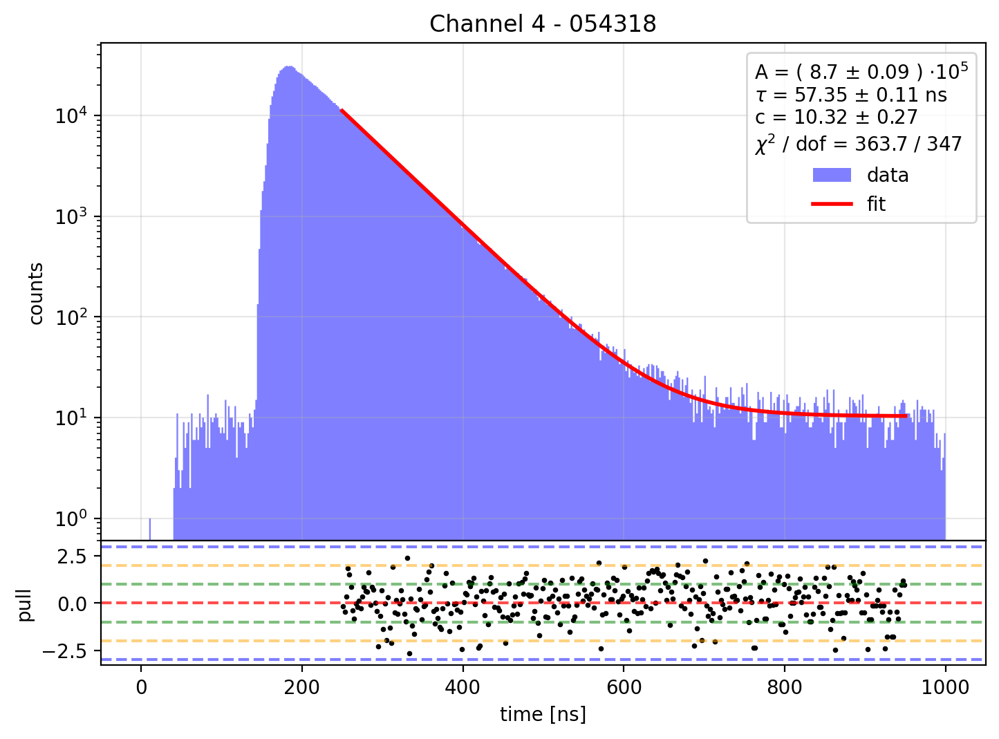

Fit results:
A = 847049.6998704859 +/- 9303.646876178651
tau = 57.06379144005371 +/- 0.11594144100886461 ns
c = 16.3217134015562 +/- 0.3267113994128765
  = 97410.4979920516 +/- 1949.8639225863385 Hz
chi2 / dof = 380.8033756912318 / 347
p-value = 0.10225250738977221


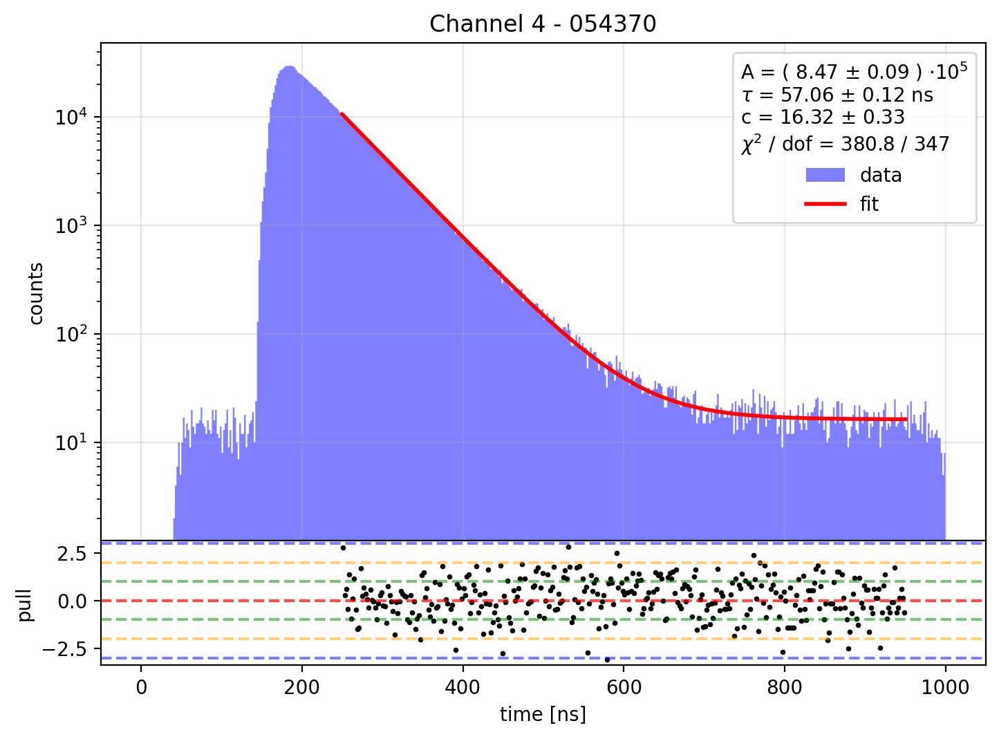

Fit results:
A = 871830.5775715506 +/- 9344.08701627526
tau = 57.120104026827285 +/- 0.11328437306740718 ns
c = 15.708517812542029 +/- 0.3227429336550971
  = 92173.15526300303 +/- 1893.7645733881209 Hz
chi2 / dof = 324.801491056519 / 347
p-value = 0.79838515979889


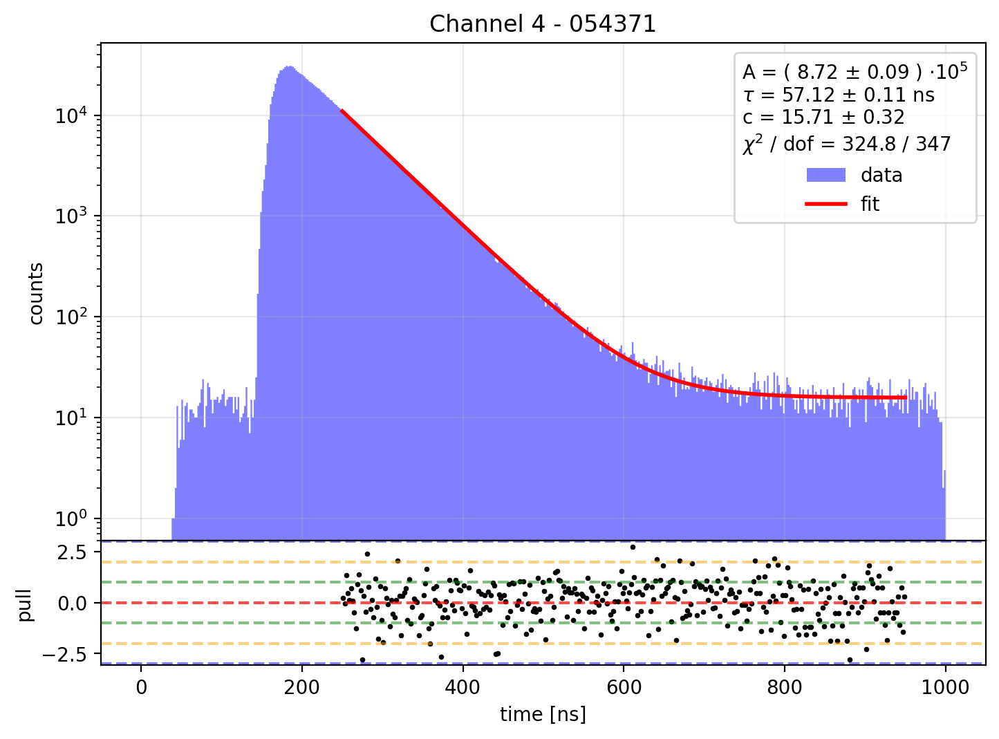

Fit results:
A = 930106.7697685186 +/- 9762.663991636846
tau = 57.004609961529816 +/- 0.11049974140340556 ns
c = 15.523118071398143 +/- 0.32053370784957647
  = 86484.58449717613 +/- 1785.8025954068553 Hz
chi2 / dof = 433.9368750066799 / 347
p-value = 0.0010223076336778325


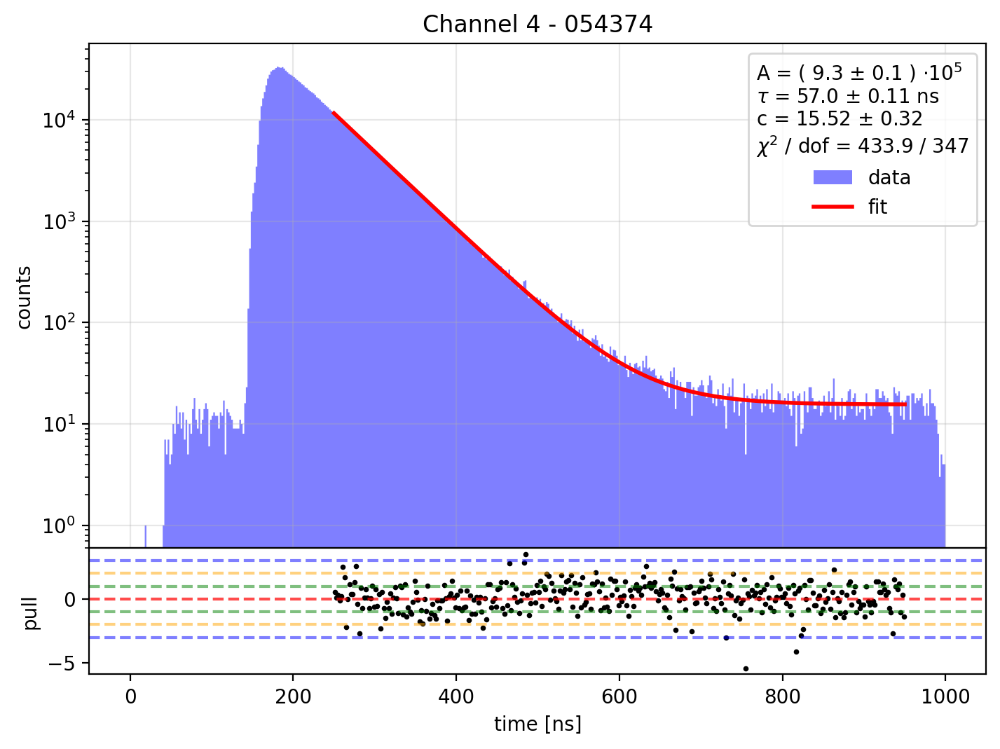

Fit results:
A = 873161.1176299696 +/- 9269.191024029806
tau = 57.28676740332675 +/- 0.11272447112160185 ns
c = 14.08499531870842 +/- 0.3078558507073499
  = 82492.85658308103 +/- 1803.0469990239653 Hz
chi2 / dof = 413.9570714281136 / 347
p-value = 0.007774171304677058


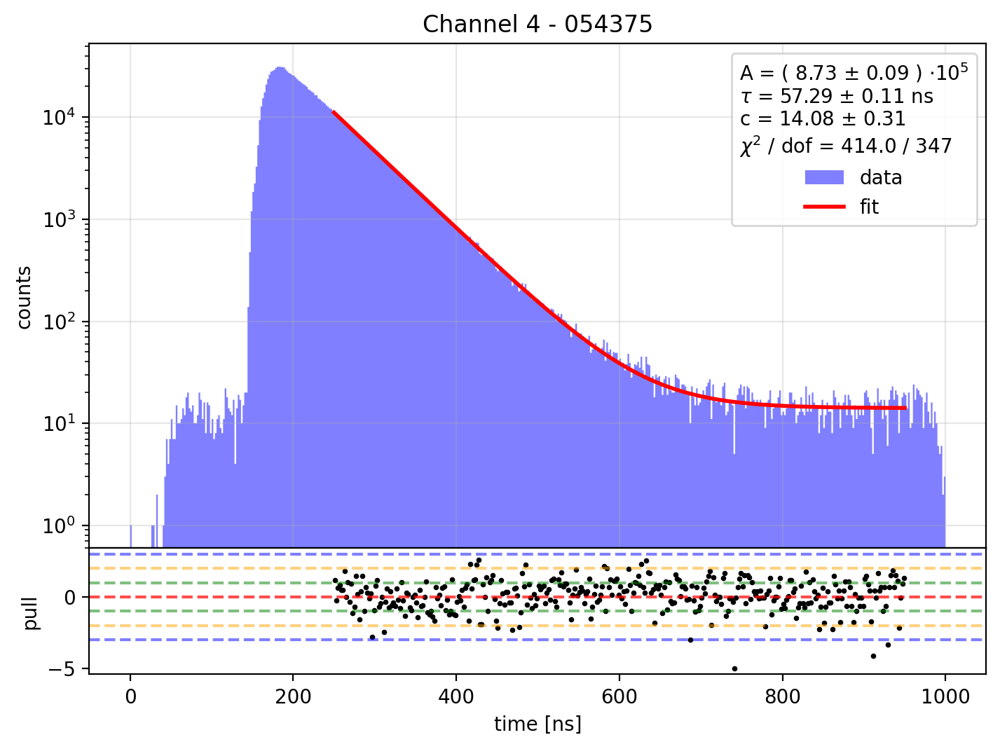

Fit results:
A = 996501.4360252642 +/- 9878.44041026917
tau = 57.149204429915656 +/- 0.10470353202874126 ns
c = 13.507951968446381 +/- 0.3045844183607427
  = 80644.48936385899 +/- 1818.4144379745833 Hz
chi2 / dof = 368.57351591585655 / 347
p-value = 0.2039146441908123


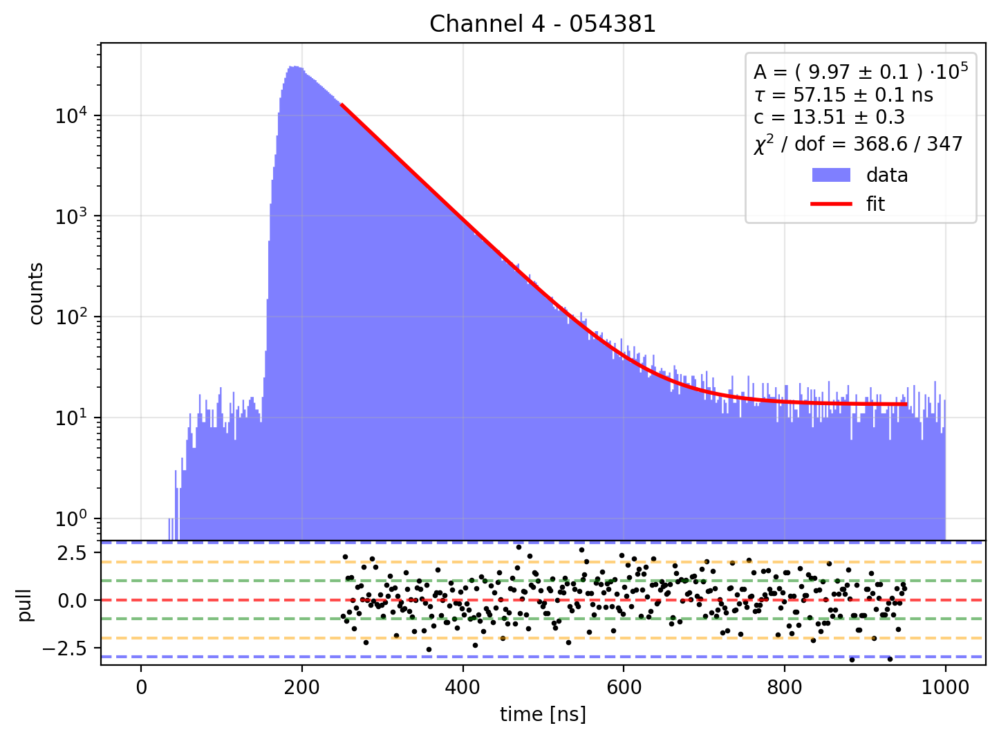

Fit results:
A = 883429.2981241655 +/- 9222.147832846636
tau = 57.36537632554193 +/- 0.11106928420187333 ns
c = 13.075588682271572 +/- 0.2995414031411405
  = 77097.5405504285 +/- 1766.184761265702 Hz
chi2 / dof = 387.61888439069173 / 347
p-value = 0.06544750110607456


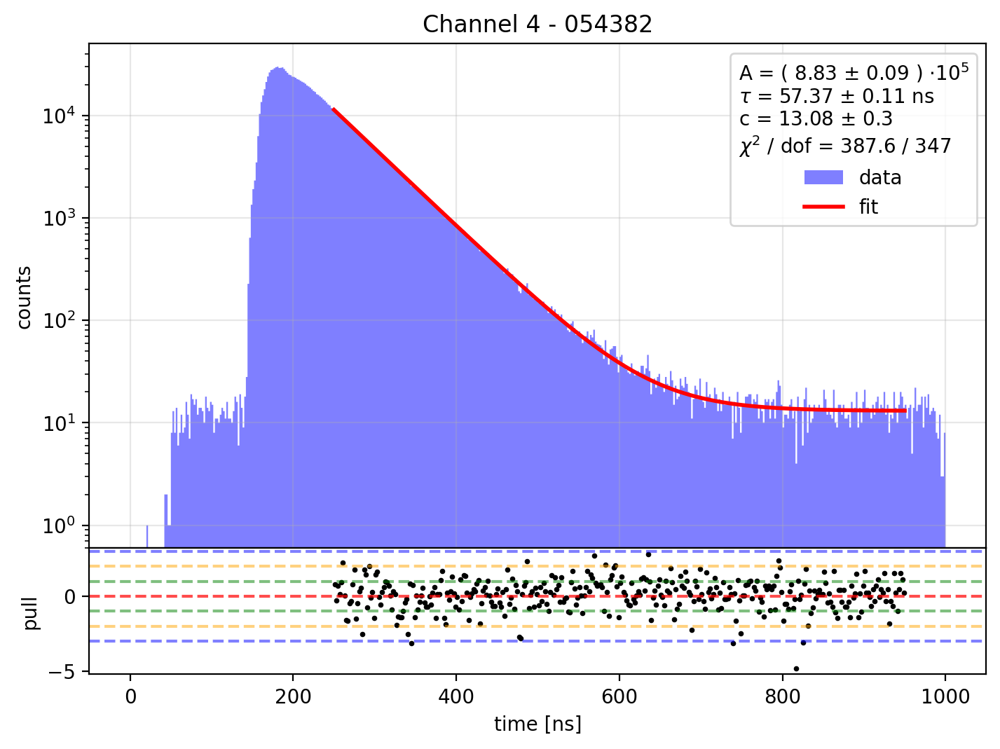

Fit results:
A = 902257.3629456431 +/- 9723.595610954724
tau = 56.76711126149252 +/- 0.112630713266572 ns
c = 15.148189901414247 +/- 0.3171976727439807
  = 88875.92202282447 +/- 1861.029985238267 Hz
chi2 / dof = 371.05622930110917 / 347
p-value = 0.17929870298654904


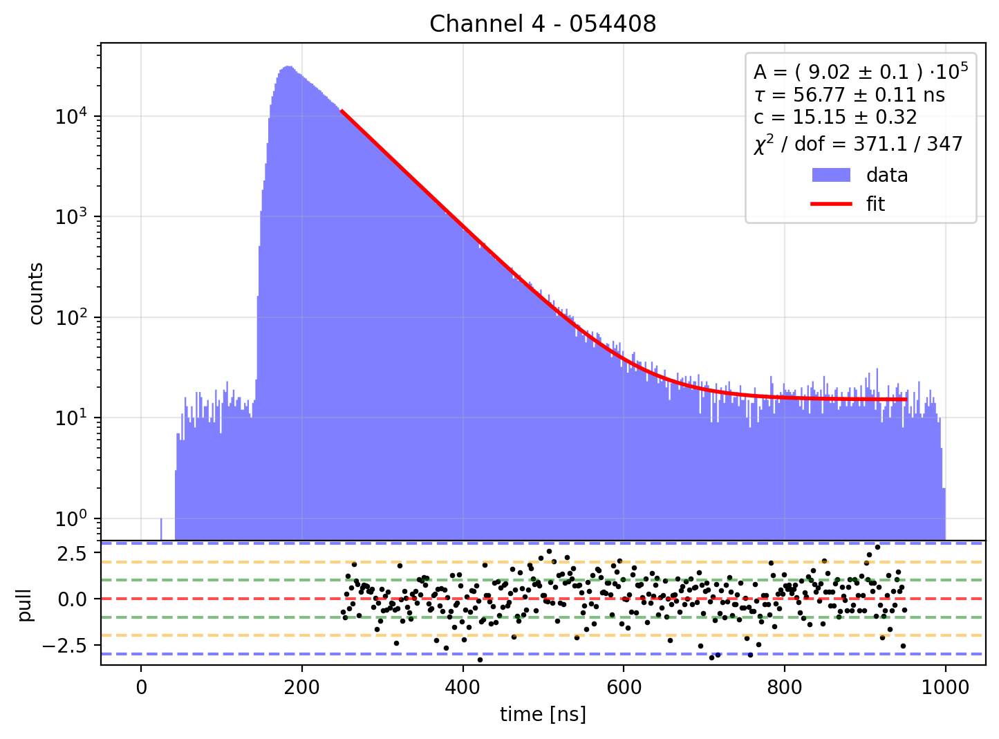

Fit results:
A = 900463.7491541979 +/- 9659.12117033337
tau = 56.86190094158169 +/- 0.11239293857056344 ns
c = 14.276968781314899 +/- 0.30826936750472544
  = 85019.40605573228 +/- 1835.74531344 Hz
chi2 / dof = 363.46877626454926 / 347
p-value = 0.26084820889832994


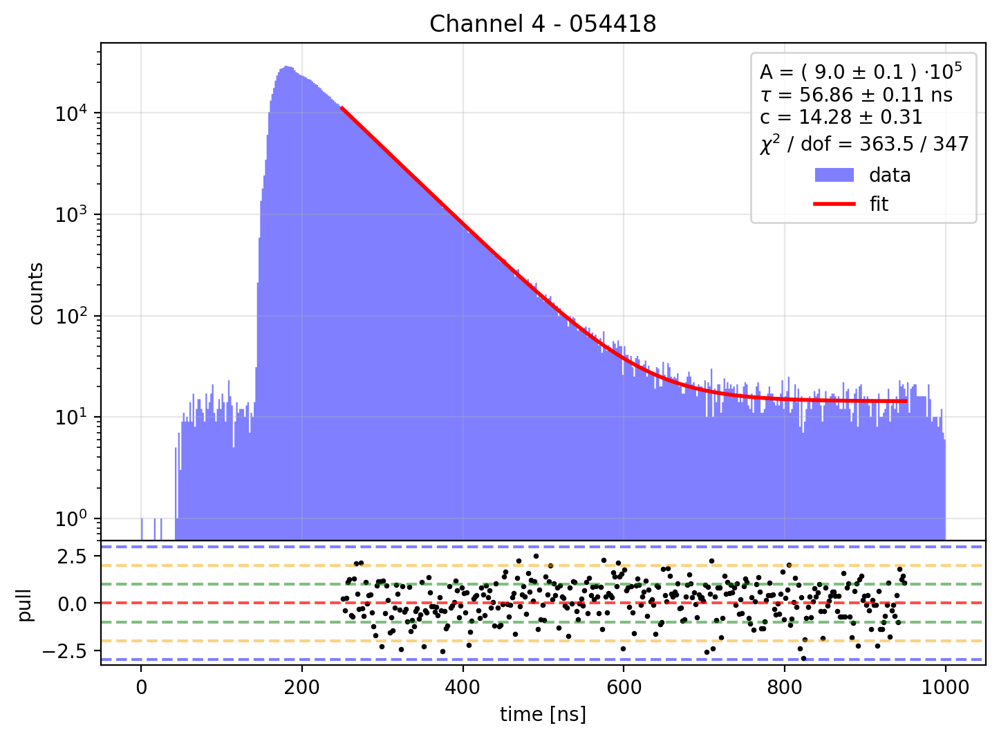

Fit results:
A = 856576.3881978848 +/- 9223.591927989233
tau = 57.23308479391686 +/- 0.11421718190503734 ns
c = 14.969138883559364 +/- 0.31681239263788186
  = 87981.3029479215 +/- 1862.0688411771594 Hz
chi2 / dof = 373.6128157050769 / 347
p-value = 0.15609627205431353


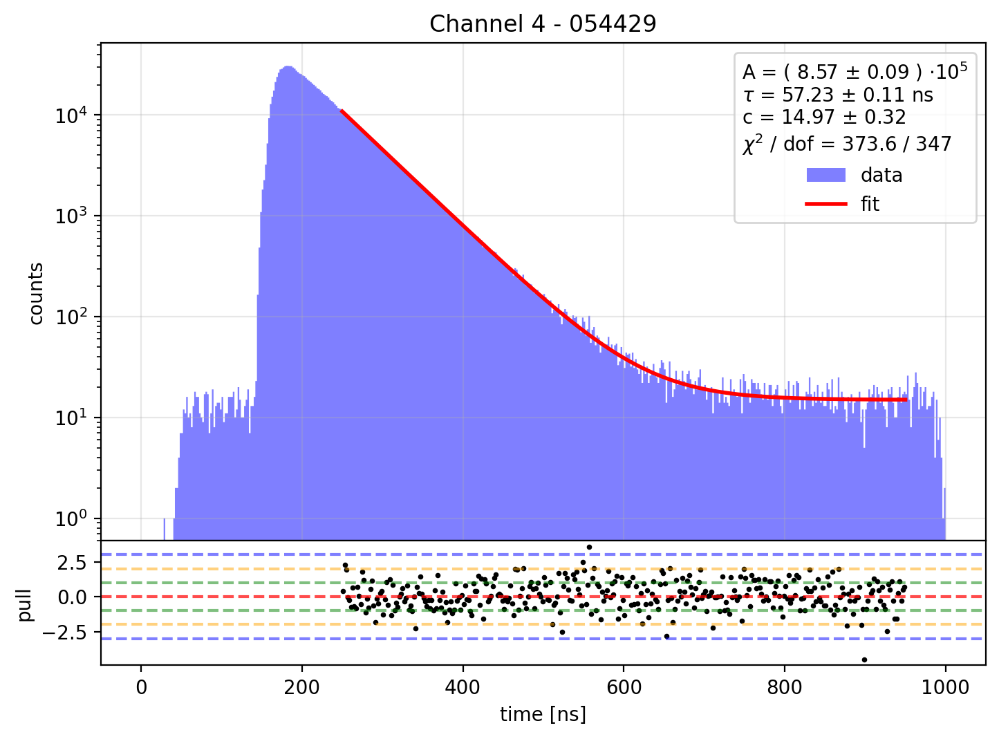

Fit results:
A = 886587.7347597195 +/- 9523.814449641459
tau = 56.95434141832163 +/- 0.11296247452621987 ns
c = 15.735762559549228 +/- 0.32349097204212995
  = 92575.28950540203 +/- 1903.1343588119046 Hz
chi2 / dof = 341.21261062946496 / 347
p-value = 0.5775283886679083


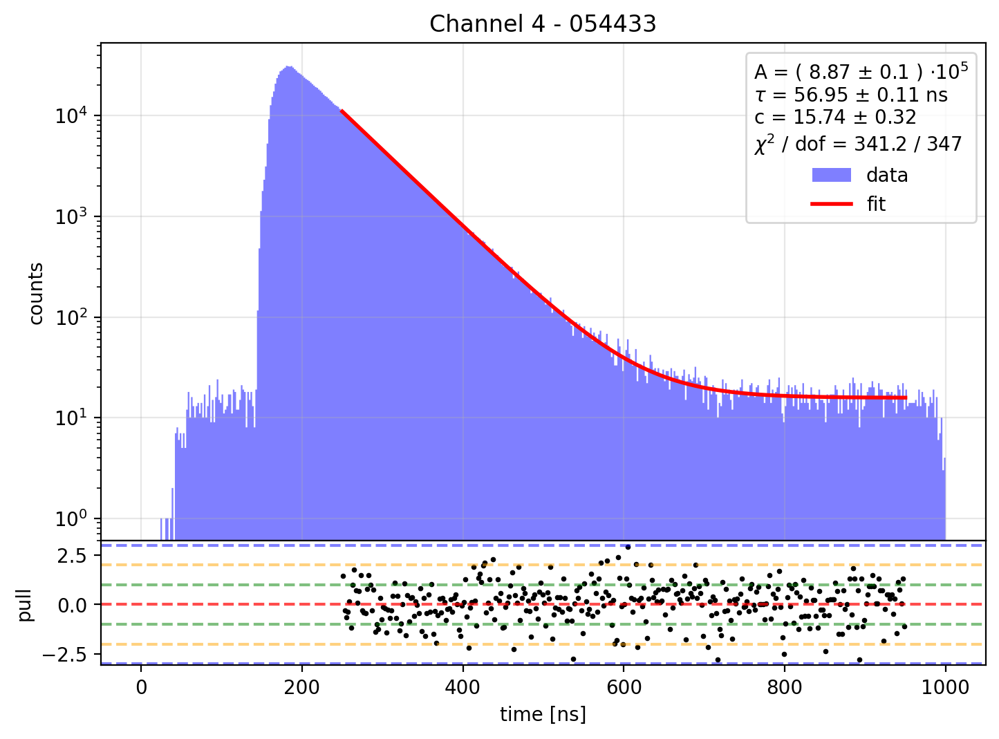

Fit results:
A = 874840.3375608303 +/- 9402.520883217861
tau = 57.09510672240228 +/- 0.11349359676425086 ns
c = 15.216321078931312 +/- 0.31767616956769906
  = 89229.5847002364 +/- 1862.875561881775 Hz
chi2 / dof = 419.8641592144521 / 347
p-value = 0.00442353679017482


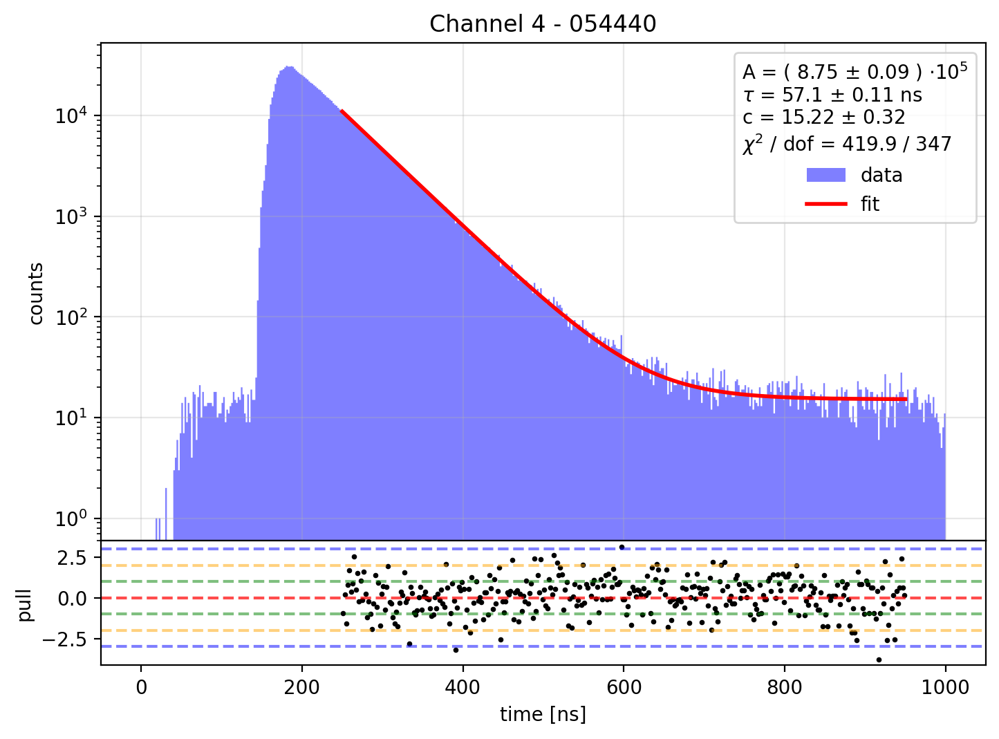

Fit results:
A = 983102.4663778755 +/- 9967.835923267638
tau = 56.901257288809965 +/- 0.10634502183455259 ns
c = 15.043956713238993 +/- 0.3195982977613063
  = 88311.00728631887 +/- 1876.1053451753214 Hz
chi2 / dof = 373.55741995892583 / 347
p-value = 0.15657598245795978


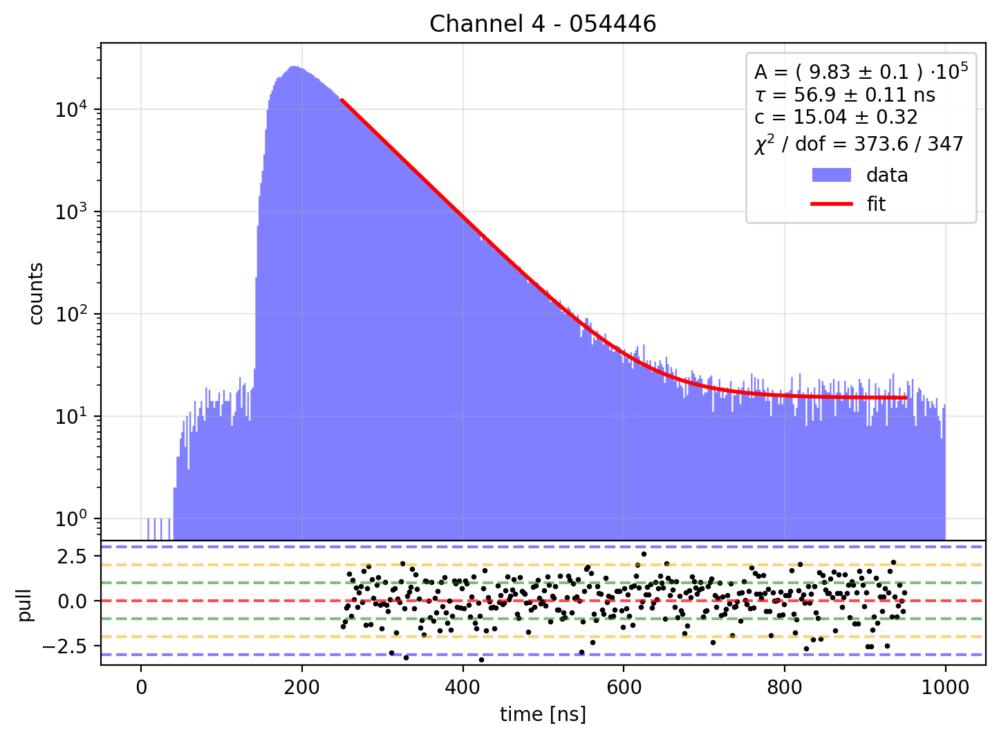

Fit results:
A = 886471.3276404573 +/- 9701.530845557954
tau = 56.77922777836645 +/- 0.11448701138972779 ns
c = 17.16778132988 +/- 0.3323938990153472
  = 101397.30987691363 +/- 1963.2034292628239 Hz
chi2 / dof = 387.27319788652017 / 347
p-value = 0.06701628925649072


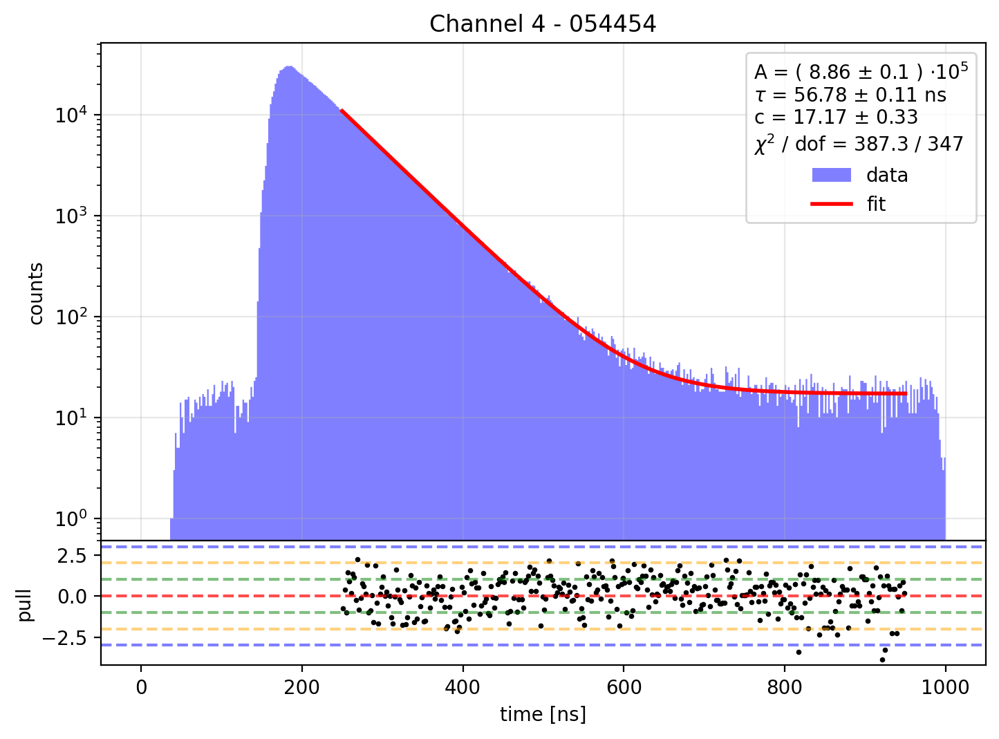

Fit results:
A = 862505.2012289898 +/- 9504.977432503125
tau = 56.873592136903135 +/- 0.11567110228153887 ns
c = 17.565038522361455 +/- 0.33678849430260804
  = 104958.64120154796 +/- 2012.455747780774 Hz
chi2 / dof = 357.10617035890294 / 347
p-value = 0.3426609502533965


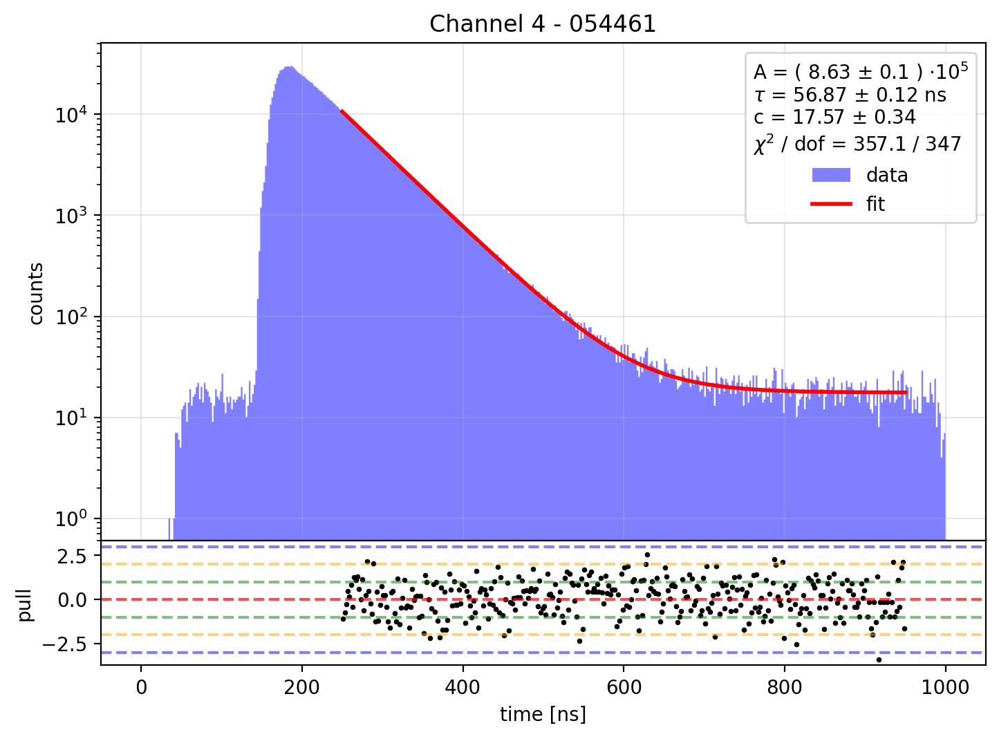

Fit results:
A = 866442.2121319195 +/- 9559.569989584876
tau = 56.98676017867758 +/- 0.116372268644116 ns
c = 21.641240311947403 +/- 0.3692851791980445
  = 127791.53170954132 +/- 2180.6291140021995 Hz
chi2 / dof = 412.70519436506413 / 347
p-value = 0.008726346905737814


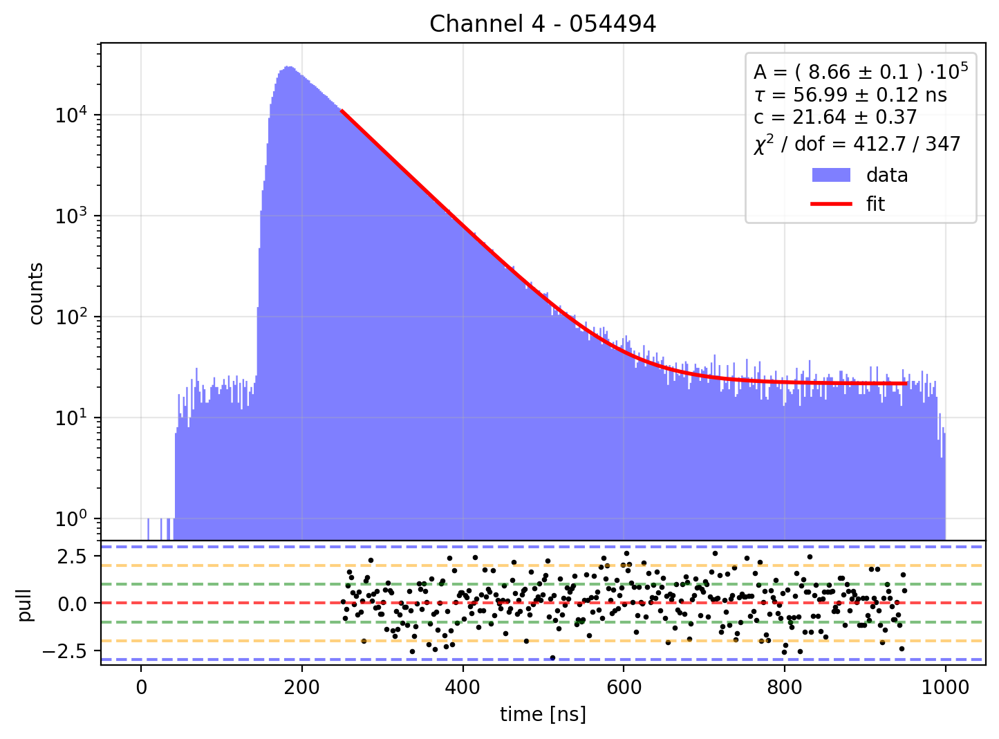

Fit results:
A = 869925.9392707174 +/- 9753.817941357363
tau = 56.70472460278921 +/- 0.11727136748742538 ns
c = 23.011570985398897 +/- 0.3786286067473288
  = 137624.07440761037 +/- 2264.443900023497 Hz
chi2 / dof = 347.991948408671 / 347
p-value = 0.4749143757681734


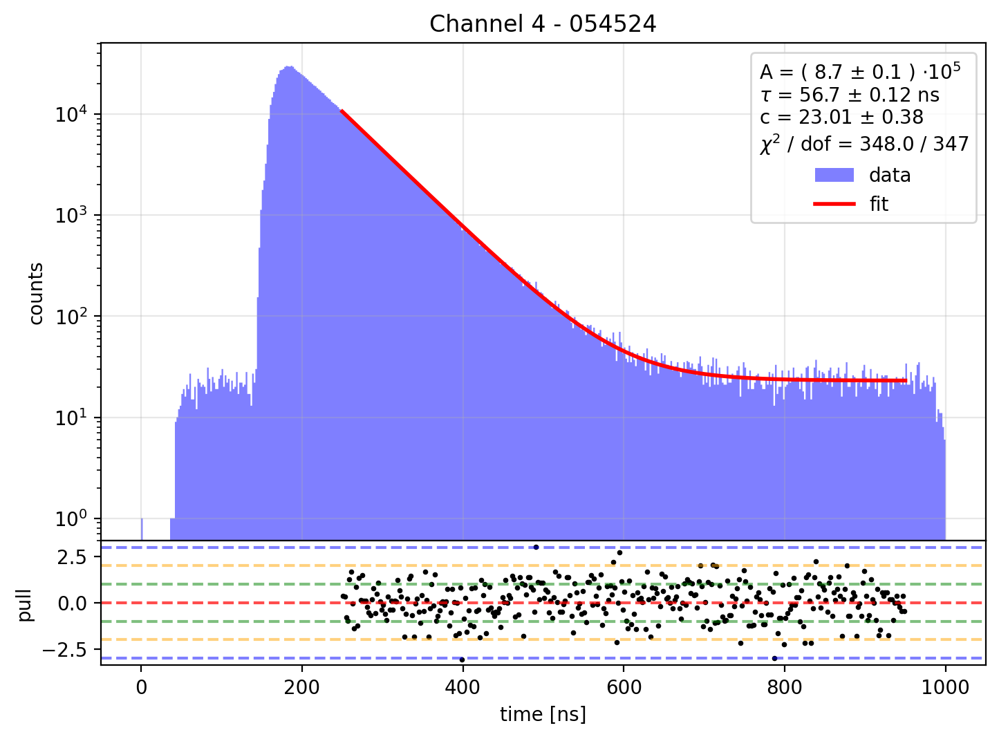

Fit results:
A = 910294.9705860979 +/- 9886.238187379966
tau = 56.79596405167771 +/- 0.11389225372209719 ns
c = 23.32431643898316 +/- 0.3827440554637569
  = 139539.55943681896 +/- 2289.796445533149 Hz
chi2 / dof = 393.9680305715004 / 347
p-value = 0.04152236782610974


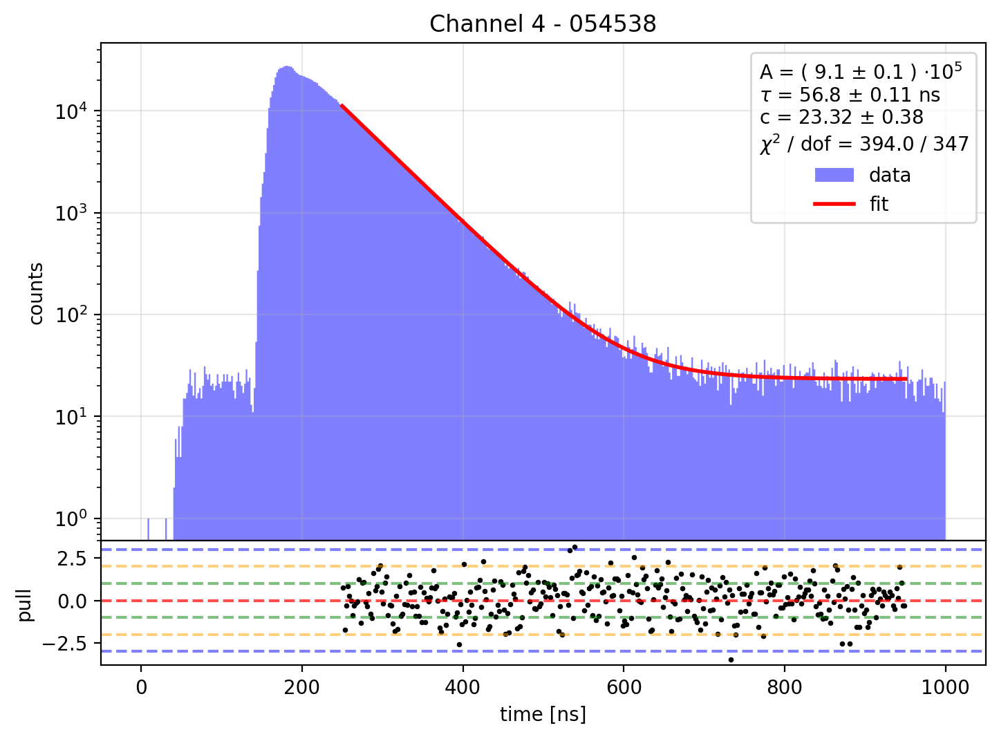

Fit results:
A = 846445.8916471505 +/- 9627.627662601913
tau = 56.88754454603922 +/- 0.11980970996718371 ns
c = 27.5568740176888 +/- 0.408688718860887
  = 165423.29405998654 +/- 2453.3491743558025 Hz
chi2 / dof = 379.70055211354617 / 347
p-value = 0.10945478785963036


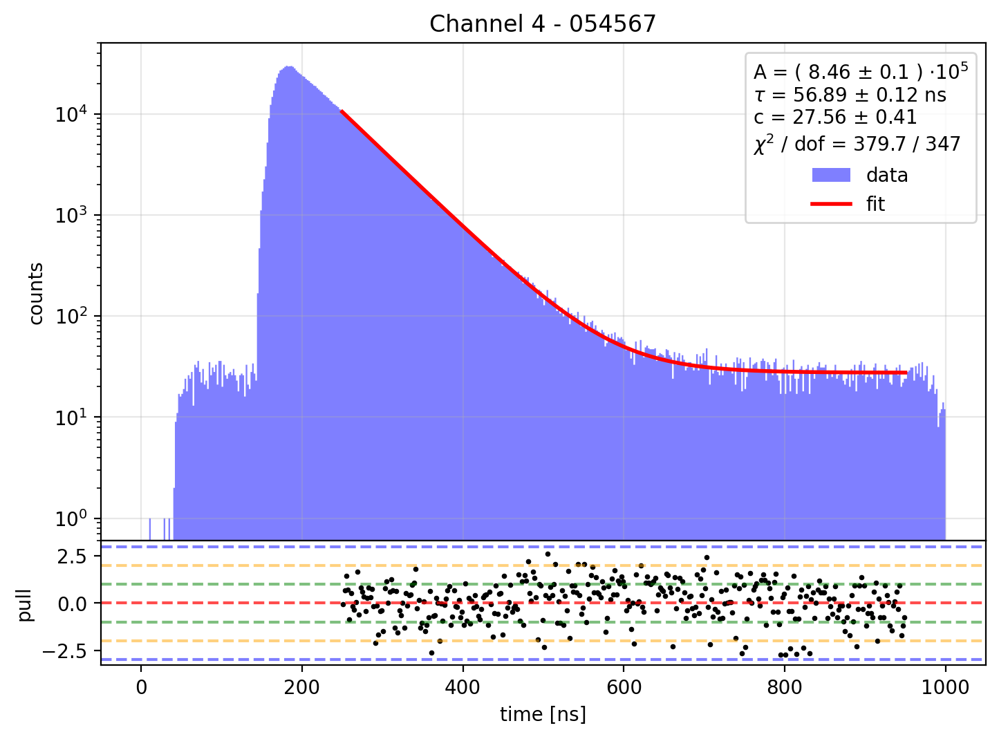

Fit results:
A = 938482.6376627414 +/- 9966.476489166158
tau = 56.82377862506136 +/- 0.11137960635558568 ns
c = 21.422824201660116 +/- 0.3698571977454268
  = 126006.23596680343 +/- 2175.451420150263 Hz
chi2 / dof = 332.20147482217226 / 347
p-value = 0.7069628831641694


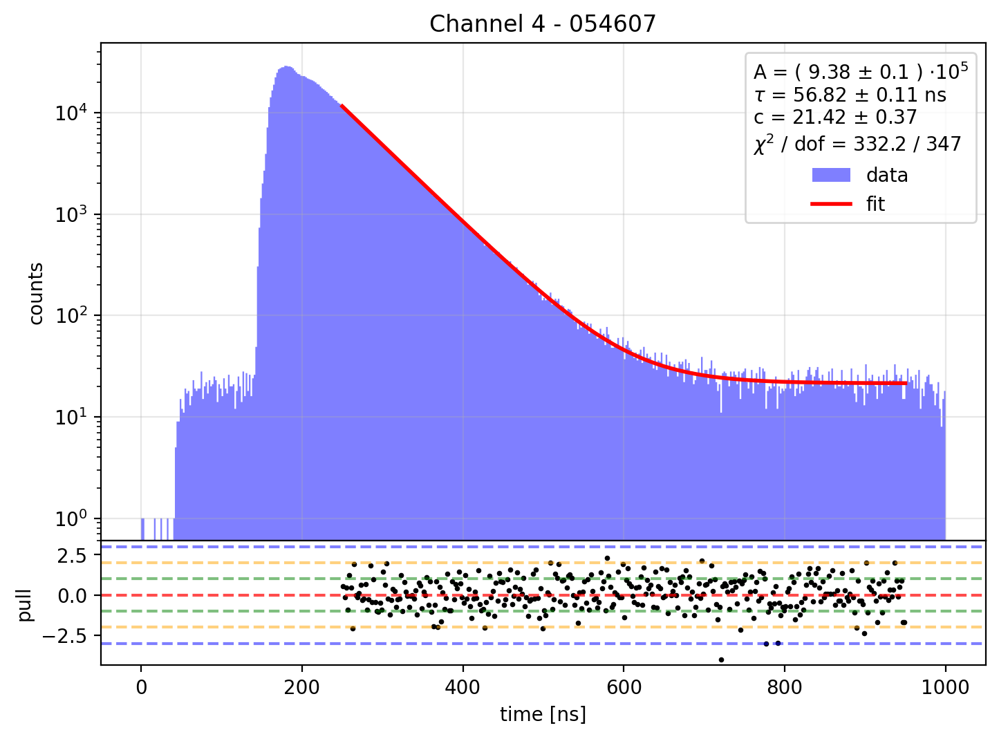

Fit results:
A = 970762.0907817318 +/- 10319.50744030161
tau = 56.49509556265142 +/- 0.11031137916924368 ns
c = 21.384597423578775 +/- 0.36850382809870297
  = 127260.48526868192 +/- 2192.979136259078 Hz
chi2 / dof = 354.9307697301907 / 347
p-value = 0.3729514197259588


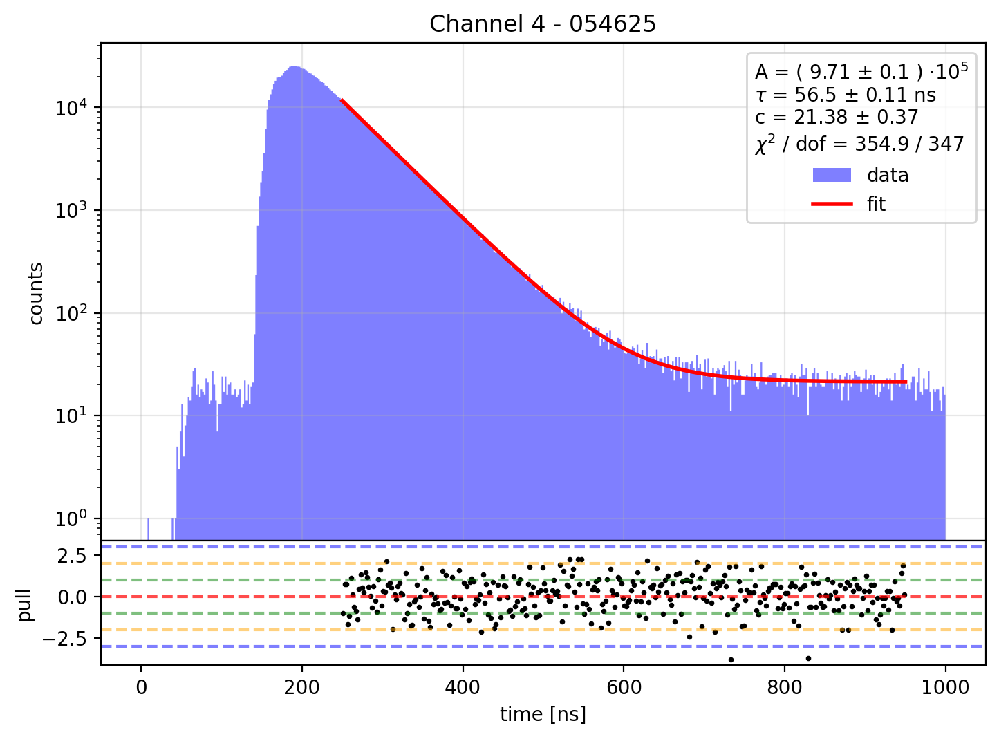

Fit results:
A = 883590.618134981 +/- 9916.095546098793
tau = 56.47200541596717 +/- 0.11639755209165659 ns
c = 20.337087317022558 +/- 0.3569392103864768
  = 121015.1934320073 +/- 2123.9554570940104 Hz
chi2 / dof = 366.53028158055804 / 347
p-value = 0.22569990254497674


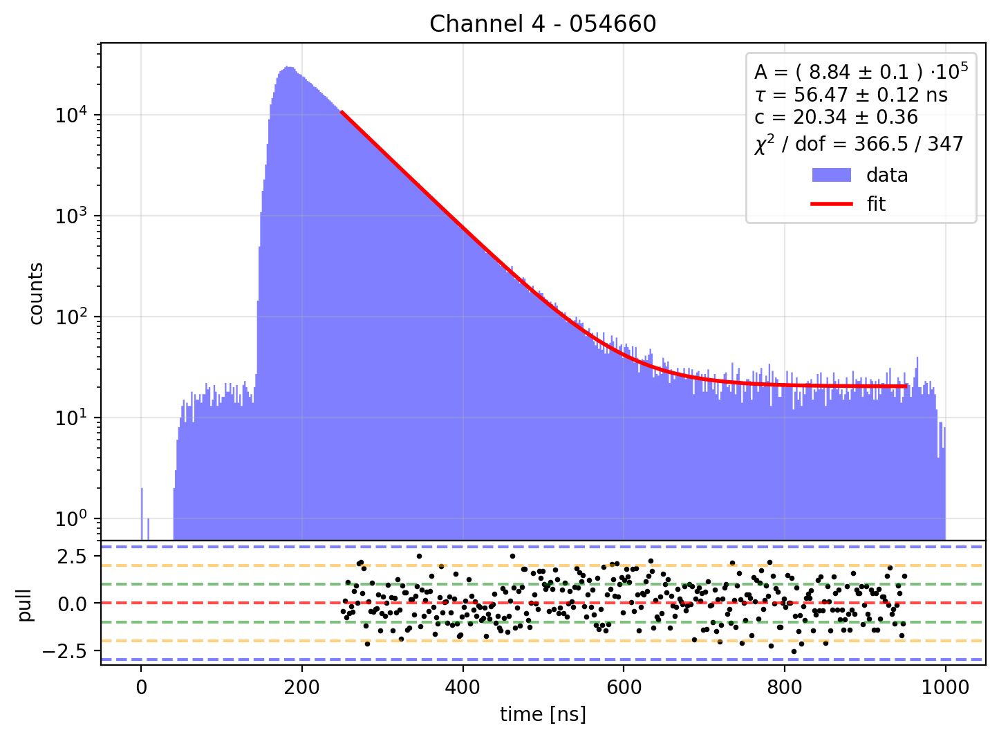

Fit results:
A = 873205.8855243309 +/- 9886.094879960481
tau = 56.40112357570824 +/- 0.1171725330317193 ns
c = 19.844515201750557 +/- 0.35398969649882517
  = 119517.91277750007 +/- 2131.9800075815488 Hz
chi2 / dof = 343.7993667960052 / 347
p-value = 0.5384543943164026


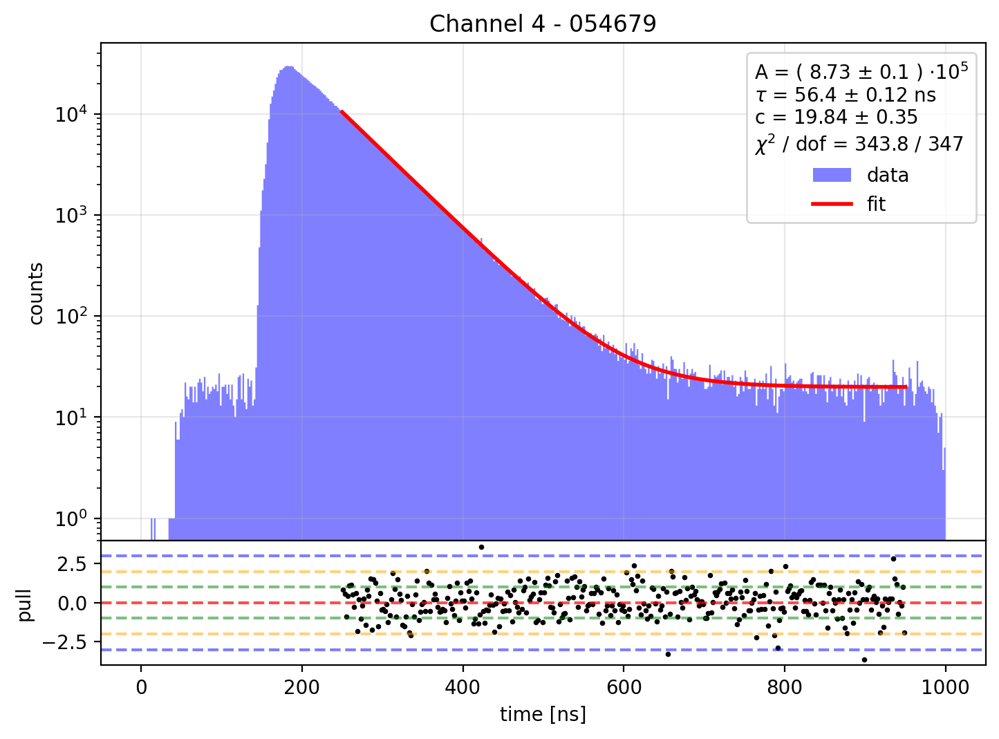

Fit results:
A = 907445.601568565 +/- 10070.867725812472
tau = 56.41523406667249 +/- 0.11490490506621306 ns
c = 20.723149858990645 +/- 0.3611630912222523
  = 123695.18938836682 +/- 2155.759972436952 Hz
chi2 / dof = 296.5292083289655 / 347
p-value = 0.9768077415163328


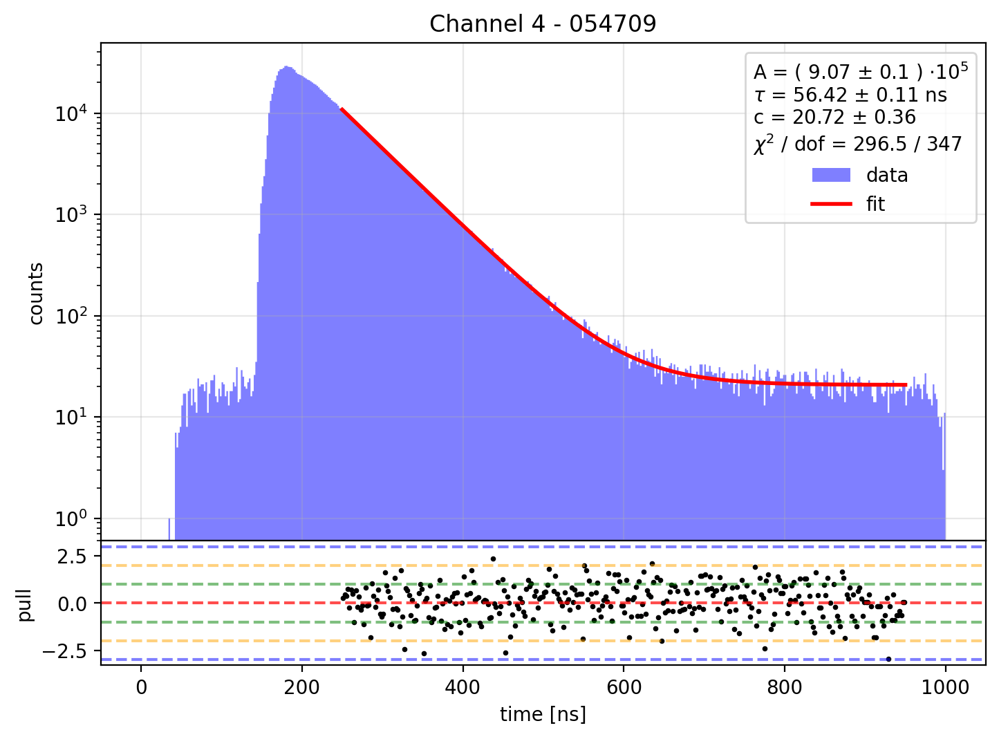

Fit results:
A = 877033.3034857733 +/- 9955.097488083773
tau = 56.33555119468644 +/- 0.11722067945810281 ns
c = 20.314594526364633 +/- 0.35583751369237326
  = 122131.34131545344 +/- 2139.2951152041874 Hz
chi2 / dof = 299.89722047304485 / 347
p-value = 0.9678699968465803


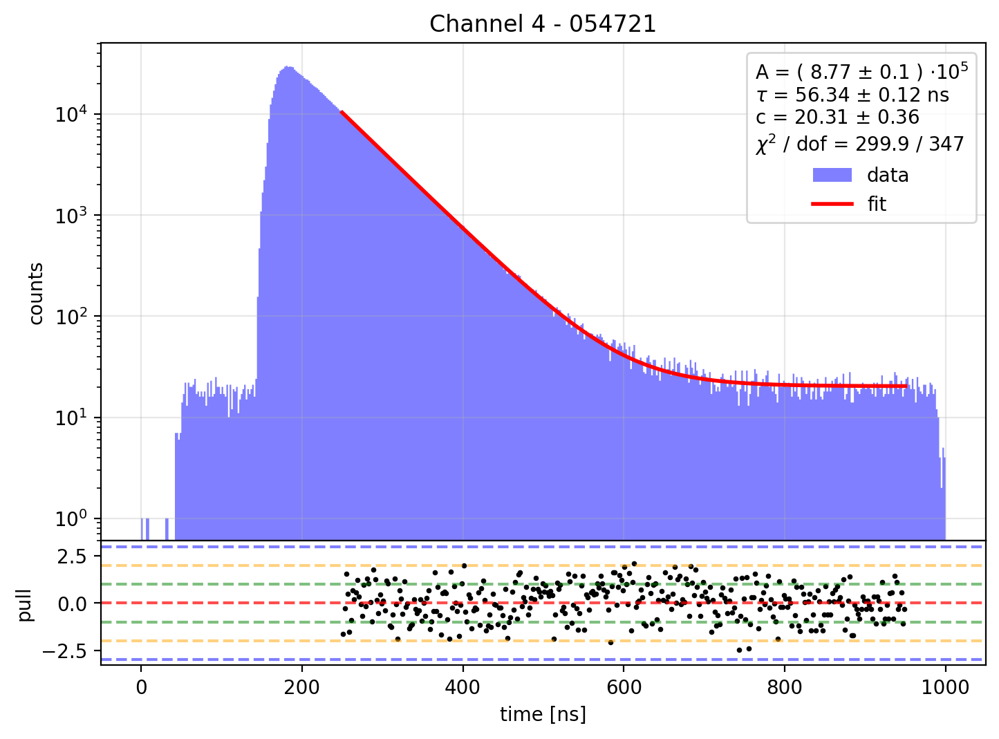

Fit results:
A = 885558.4008724241 +/- 10118.092936535937
tau = 56.19818369824276 +/- 0.11748219738483935 ns
c = 19.953418881405533 +/- 0.35323876985003366
  = 120108.70462177075 +/- 2126.3048363312246 Hz
chi2 / dof = 405.40997433506925 / 347
p-value = 0.016638498762751586


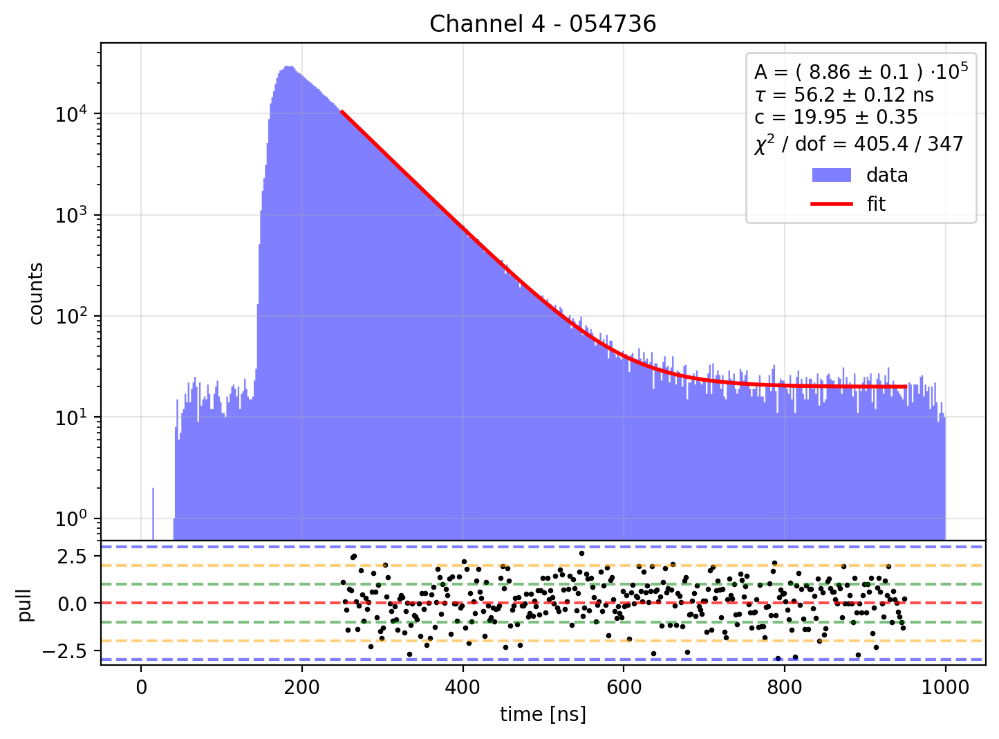

Fit results:
A = 876077.3401350917 +/- 10145.555353958402
tau = 56.040125220355705 +/- 0.11842200092997919 ns
c = 18.524404544294416 +/- 0.3403399890665817
  = 113048.81268564044 +/- 2076.9915481721305 Hz
chi2 / dof = 385.48987894122297 / 347
p-value = 0.07559151994281543


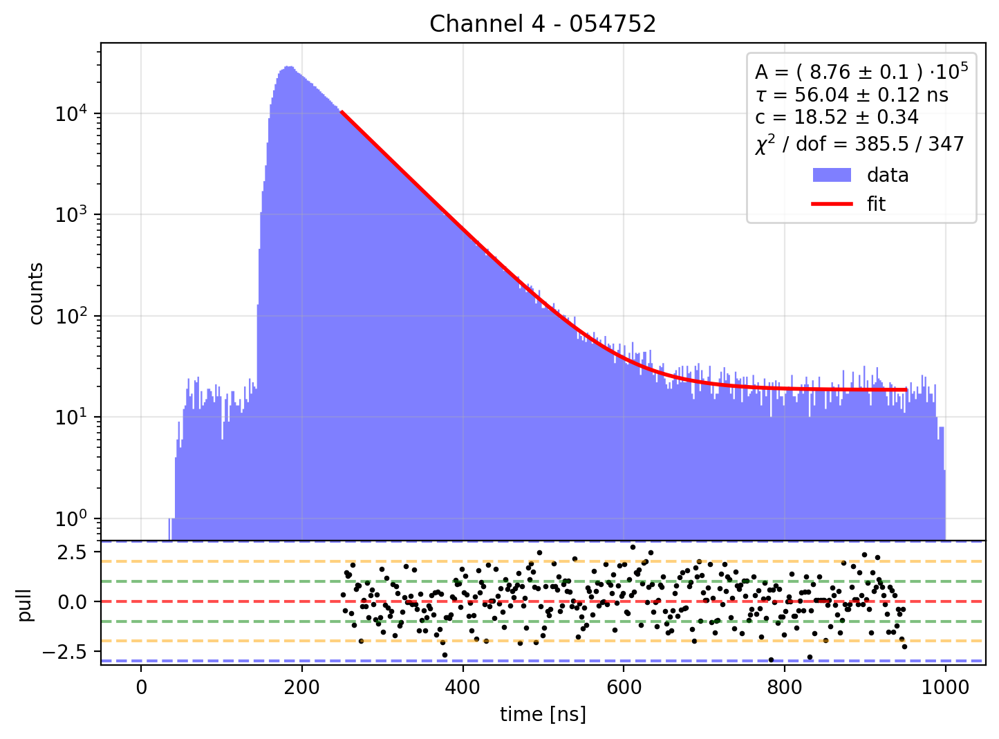

Fit results:
A = 870124.2356050796 +/- 9874.35066106513
tau = 56.37596174823319 +/- 0.11729653418518773 ns
c = 18.857420605851743 +/- 0.3444310458472106
  = 113044.59221559187 +/- 2064.761026335983 Hz
chi2 / dof = 319.8461586640537 / 347
p-value = 0.849303669908686


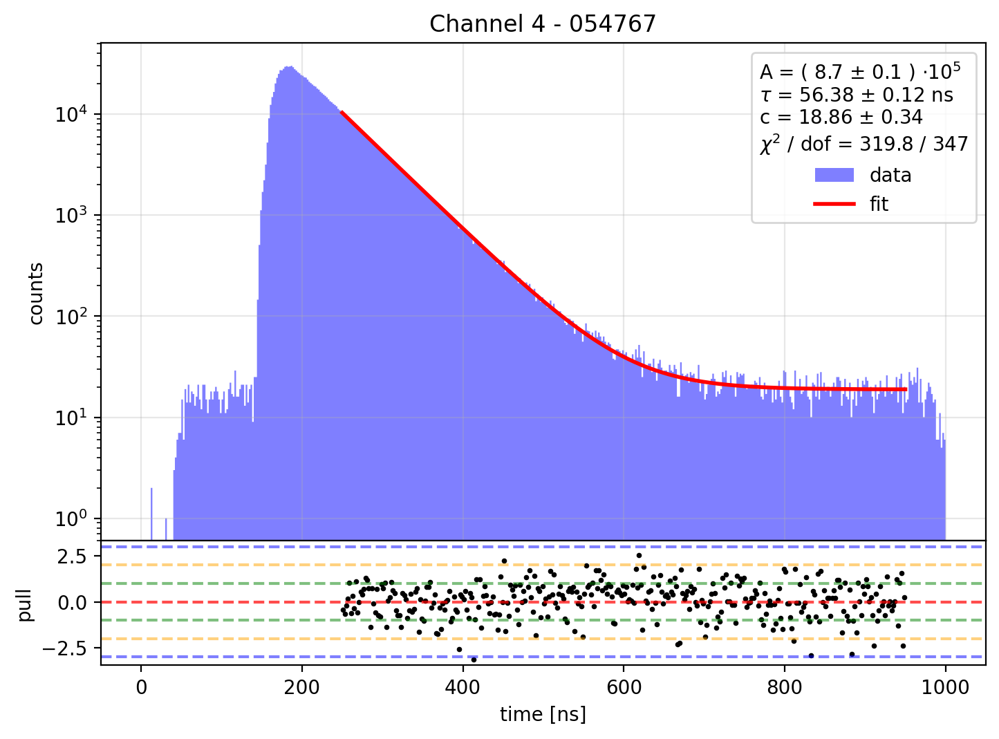

Fit results:
A = 856952.7125957301 +/- 9822.735377460005
tau = 56.38670889719888 +/- 0.11848594638280453 ns
c = 17.758686104903767 +/- 0.3344187617047467
  = 107159.49665647149 +/- 2017.9503126002987 Hz
chi2 / dof = 364.3026553238571 / 347
p-value = 0.25098405725369655


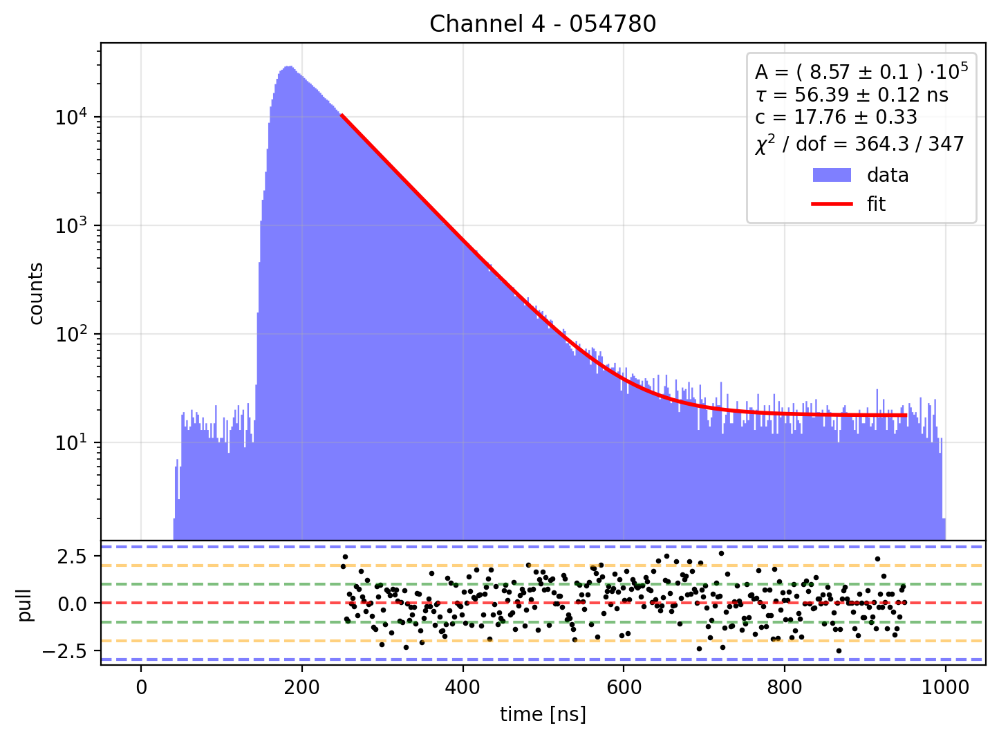

Fit results:
A = 873528.7908537046 +/- 9851.685041040466
tau = 56.428862043155505 +/- 0.11673627387162483 ns
c = 18.35776982616442 +/- 0.3402670363725466
  = 109903.07374556635 +/- 2037.088031158233 Hz
chi2 / dof = 378.47182832689373 / 347
p-value = 0.11791799732308383


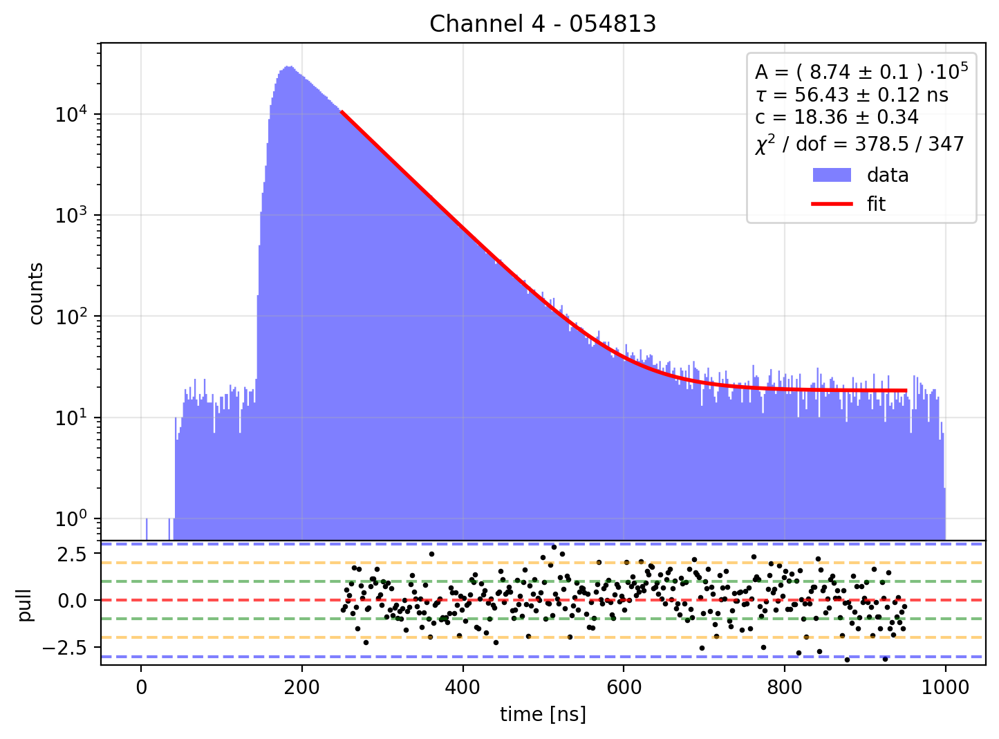

Fit results:
A = 875889.4998455904 +/- 10015.808936825626
tau = 56.22556099365921 +/- 0.1176027818598098 ns
c = 18.345780392218924 +/- 0.339060359808407
  = 110298.8095342872 +/- 2038.504399790817 Hz
chi2 / dof = 378.7908526504511 / 347
p-value = 0.11567560982774627


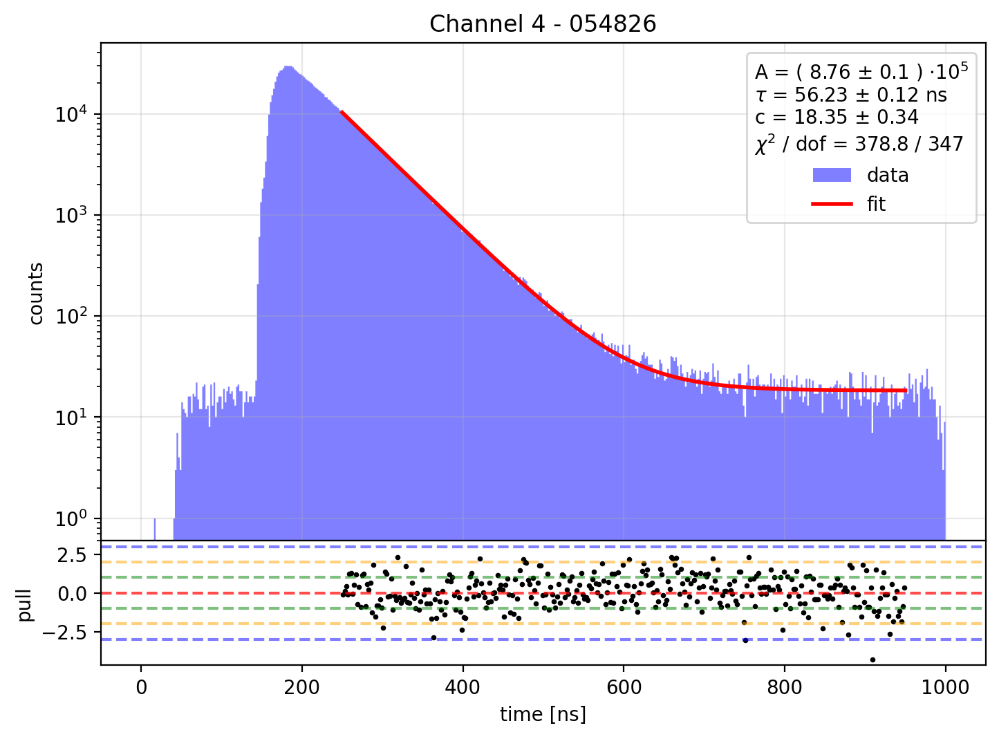

Fit results:
A = 1010442.3387683417 +/- 10566.153200856363
tau = 56.39461413622482 +/- 0.1080550019800867 ns
c = 18.760252089444016 +/- 0.3476019965543884
  = 110289.54785093483 +/- 2043.5155588147466 Hz
chi2 / dof = 393.74806541983355 / 347
p-value = 0.04220872502093065


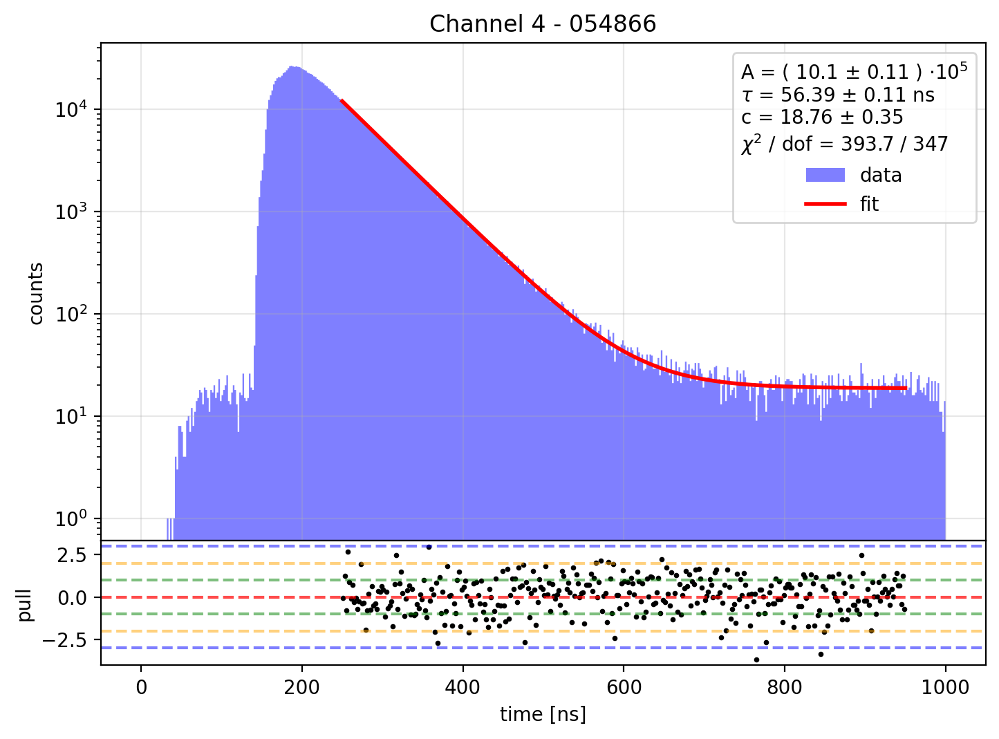

Fit results:
A = 994391.9820999772 +/- 10677.374964376724
tau = 56.10752794724512 +/- 0.10996750697520162 ns
c = 19.074299375413023 +/- 0.3483180629554461
  = 114084.83184452208 +/- 2083.316763492985 Hz
chi2 / dof = 368.09368448462953 / 347
p-value = 0.20890777892178025


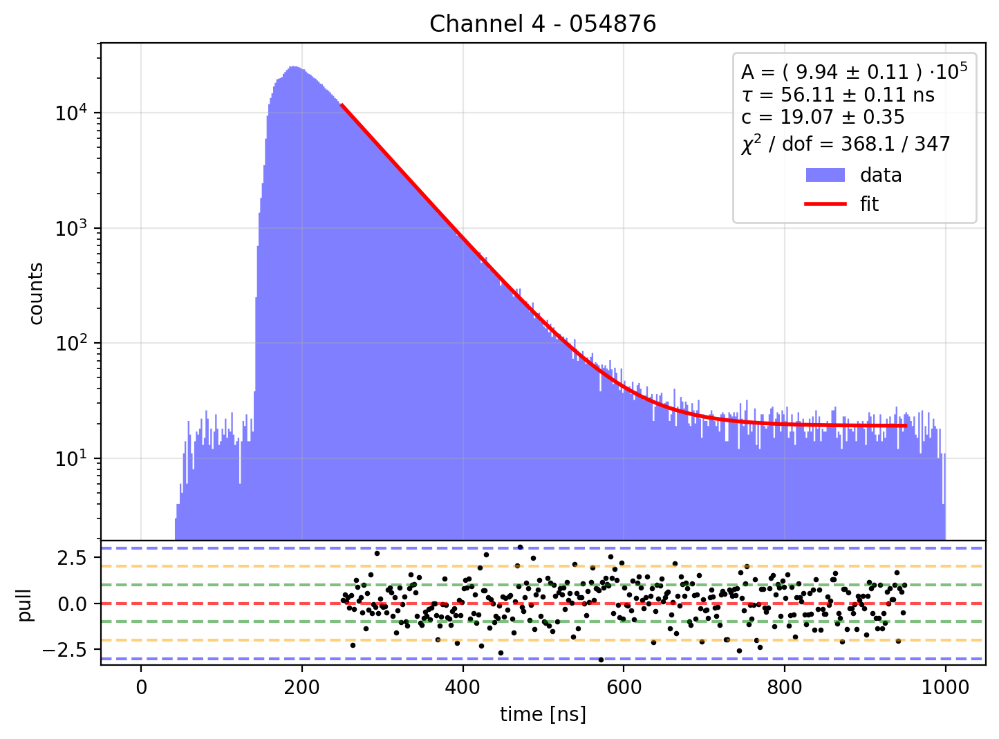

Fit results:
A = 1046271.8142398241 +/- 11032.083558348822
tau = 56.03663820375855 +/- 0.10774108077983359 ns
c = 19.355809784091623 +/- 0.3519684341284748
  = 116775.72387718773 +/- 2123.4641761696676 Hz
chi2 / dof = 396.32596159355506 / 347
p-value = 0.03473192692048854


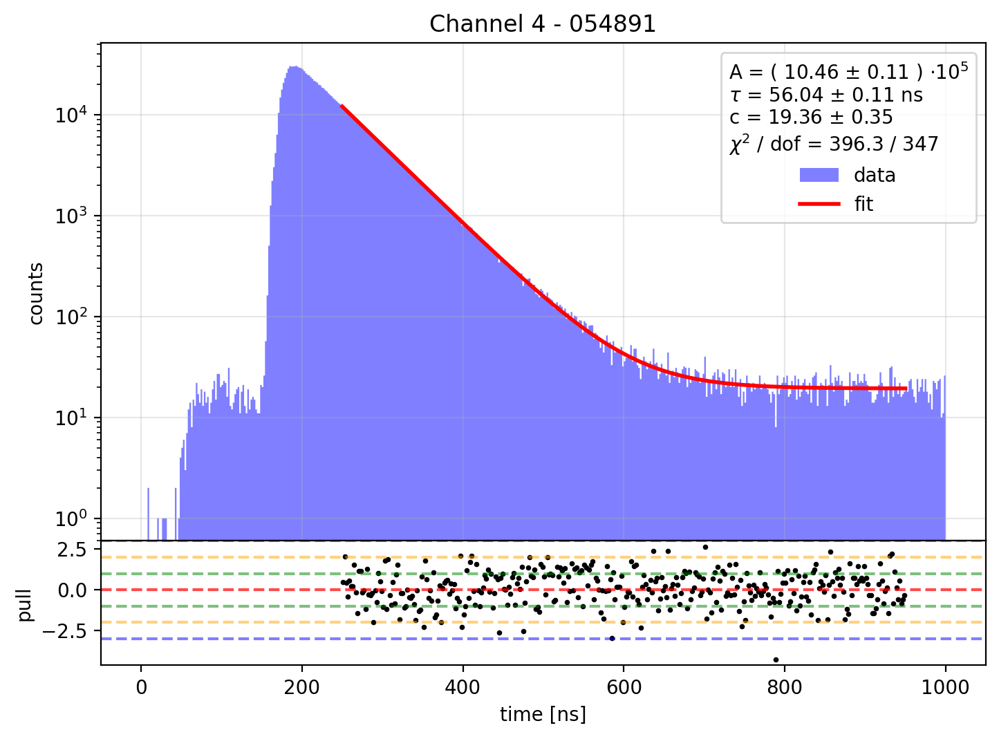

Fit results:
A = 905804.3874336609 +/- 10239.121841428394
tau = 56.20444827475721 +/- 0.11620725258226994 ns
c = 19.31313395106742 +/- 0.3476369628056304
  = 114680.62058255797 +/- 2064.2544463780246 Hz
chi2 / dof = 357.05482159492254 / 347
p-value = 0.3433638974414427


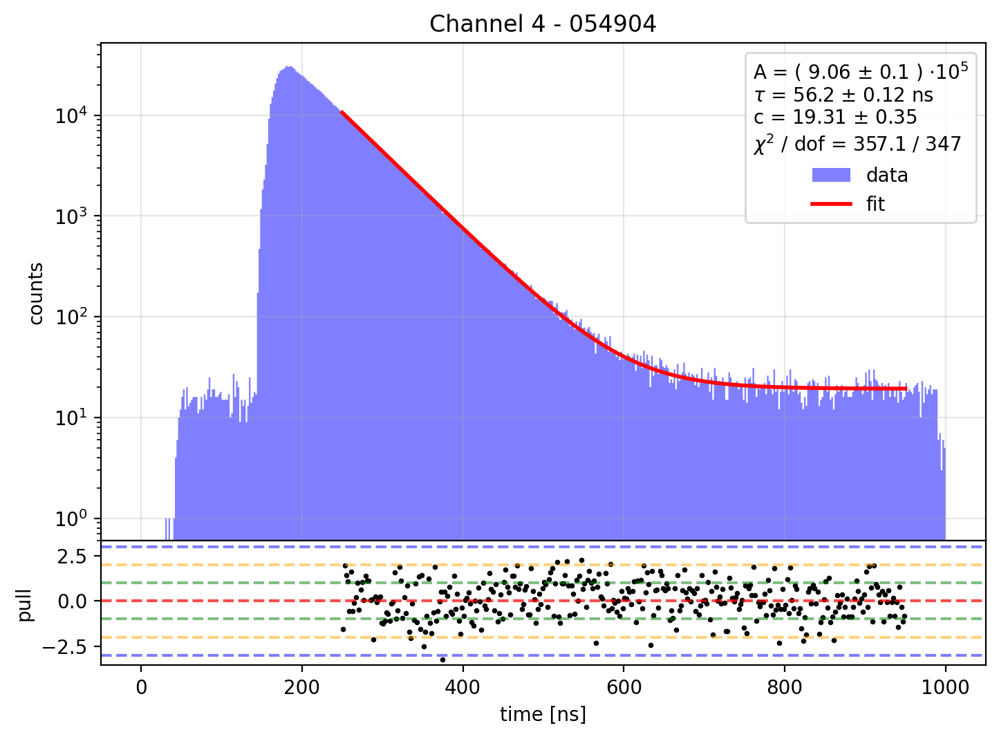

Fit results:
A = 878151.3784013506 +/- 9987.936779751959
tau = 56.31129851775187 +/- 0.11733334641860221 ns
c = 18.888215143108866 +/- 0.3451099859961886
  = 113104.43923345709 +/- 2066.5516113737203 Hz
chi2 / dof = 458.9779672932306 / 347
p-value = 5.040950909784847e-05


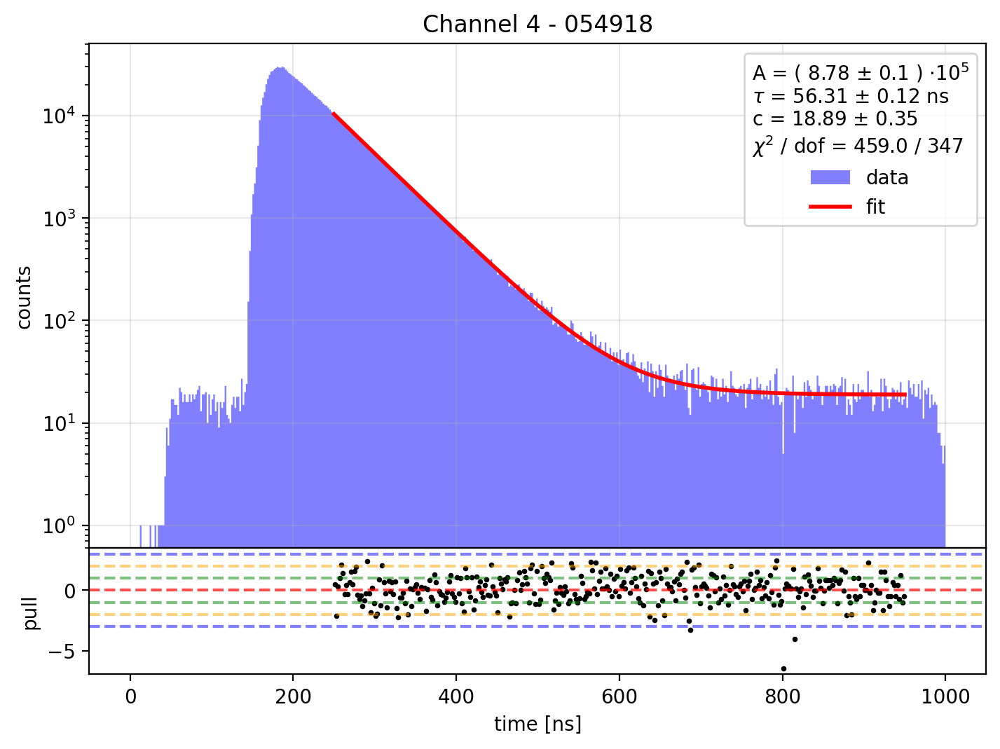

Fit results:
A = 888156.9014815664 +/- 10108.93475421107
tau = 56.197243139231894 +/- 0.11696541456350035 ns
c = 18.538445241139314 +/- 0.34154679662031207
  = 110824.16839715511 +/- 2041.791488541901 Hz
chi2 / dof = 367.0214303458933 / 347
p-value = 0.2203388062242433


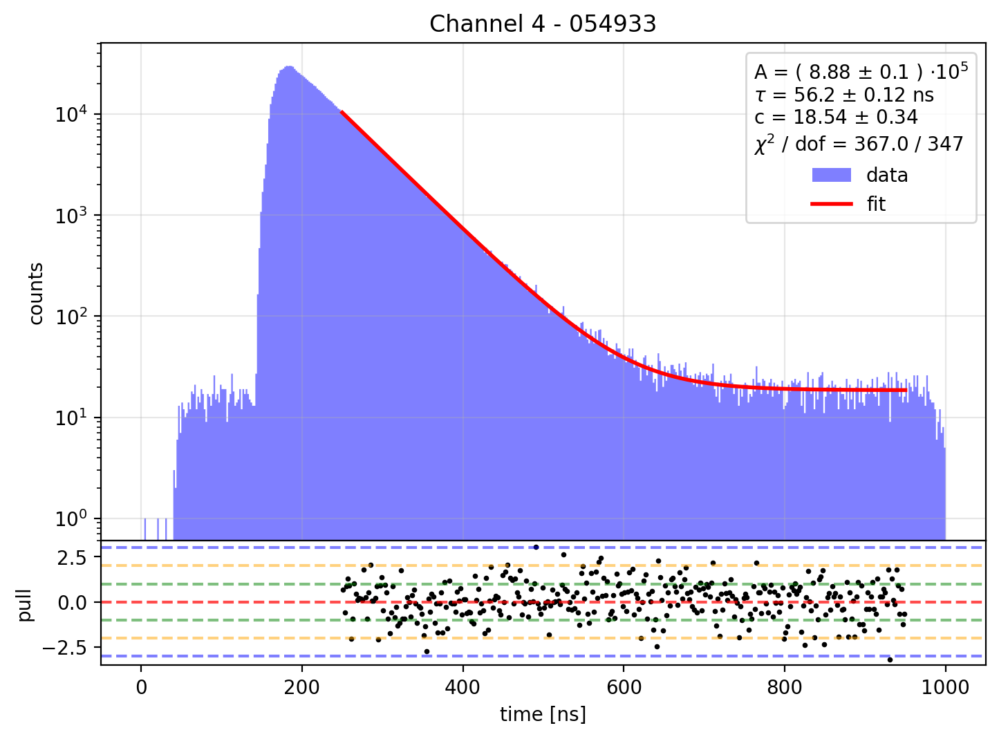

Fit results:
A = 884741.0670833531 +/- 10098.50730755186
tau = 56.10406140546317 +/- 0.1168843945661409 ns
c = 17.02452021661258 +/- 0.3285219628921343
  = 102858.490620809 +/- 1984.8590626299547 Hz
chi2 / dof = 396.3034472819723 / 347
p-value = 0.034792047914594115


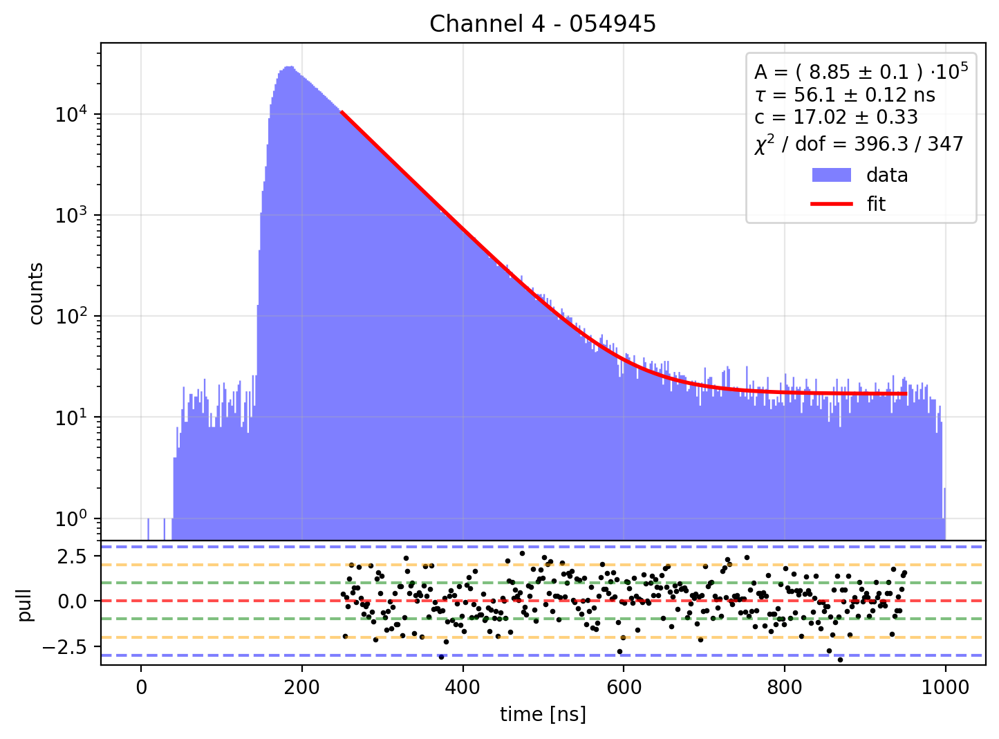

Fit results:
A = 908396.6611121377 +/- 10368.665775115796
tau = 55.941944866646494 +/- 0.11631737304436 ns
c = 18.243701317442493 +/- 0.33838644606607104
  = 109318.34496268407 +/- 2027.6502886166068 Hz
chi2 / dof = 384.5921197688565 / 347
p-value = 0.08022412127122924


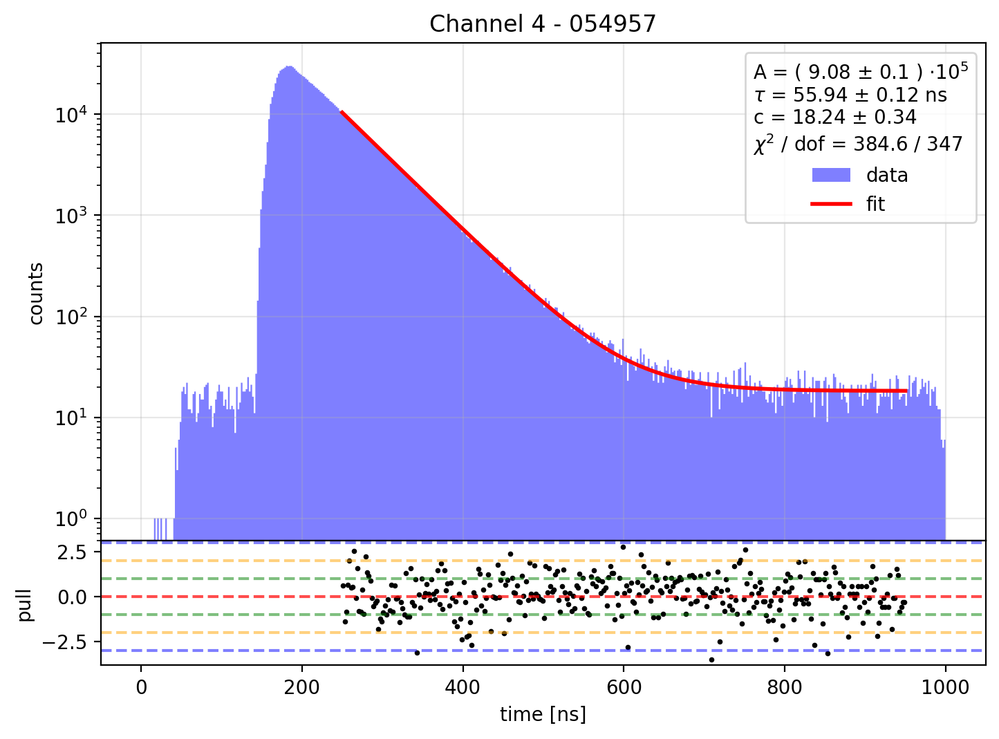

Fit results:
A = 990096.2360652961 +/- 10656.744217501286
tau = 56.1406911580969 +/- 0.11031378380427226 ns
c = 17.67389711681246 +/- 0.33679166314843023
  = 105493.13053201973 +/- 2010.2644395737645 Hz
chi2 / dof = 365.3959840884401 / 347
p-value = 0.23837793990176237


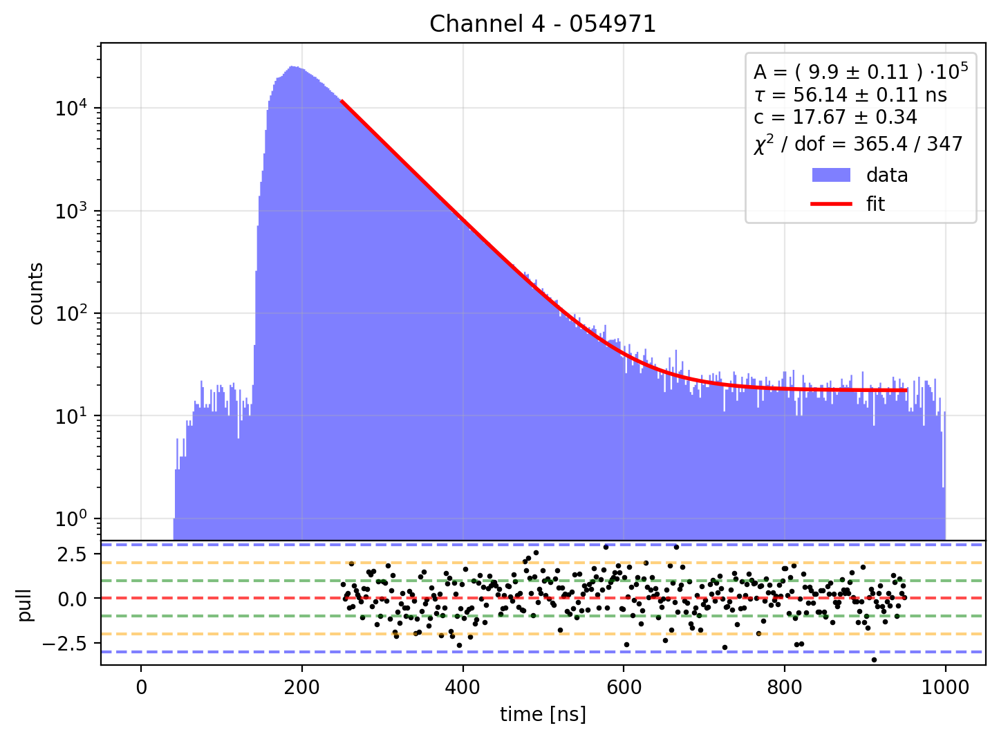

Fit results:
A = 895746.5920343839 +/- 10207.932622232473
tau = 56.029234743880814 +/- 0.11641757904253175 ns
c = 16.791922481364736 +/- 0.3271674116098886
  = 101062.40283932218 +/- 1969.0613022249756 Hz
chi2 / dof = 373.58423286348255 / 347
p-value = 0.15634366386275633


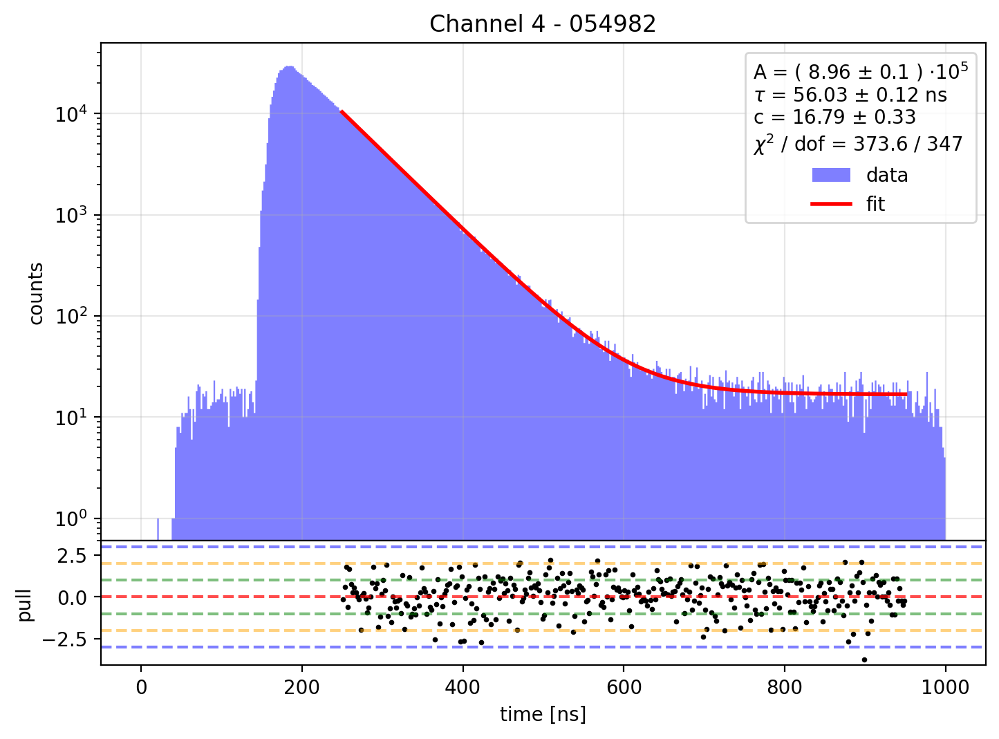

Fit results:
A = 904042.6767692954 +/- 10218.295329879587
tau = 56.03854301482317 +/- 0.11544784338240108 ns
c = 16.410741756033794 +/- 0.32253764133034757
  = 98029.59126933201 +/- 1926.6790994967182 Hz
chi2 / dof = 395.5355356491484 / 347
p-value = 0.03689575696524672


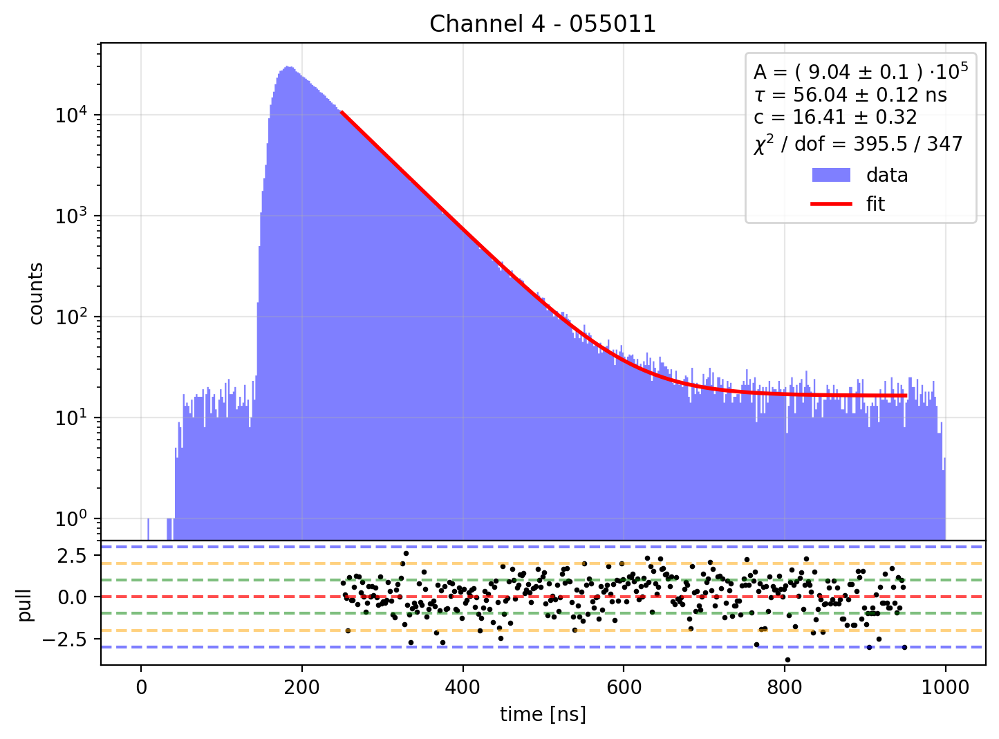

Fit results:
A = 900403.967901565 +/- 10133.86392551597
tau = 56.14459465780871 +/- 0.11531166784381801 ns
c = 15.286584744784788 +/- 0.31323997326486896
  = 91196.7685911443 +/- 1868.7282890364568 Hz
chi2 / dof = 428.5184950307525 / 347
p-value = 0.0018331598818371875


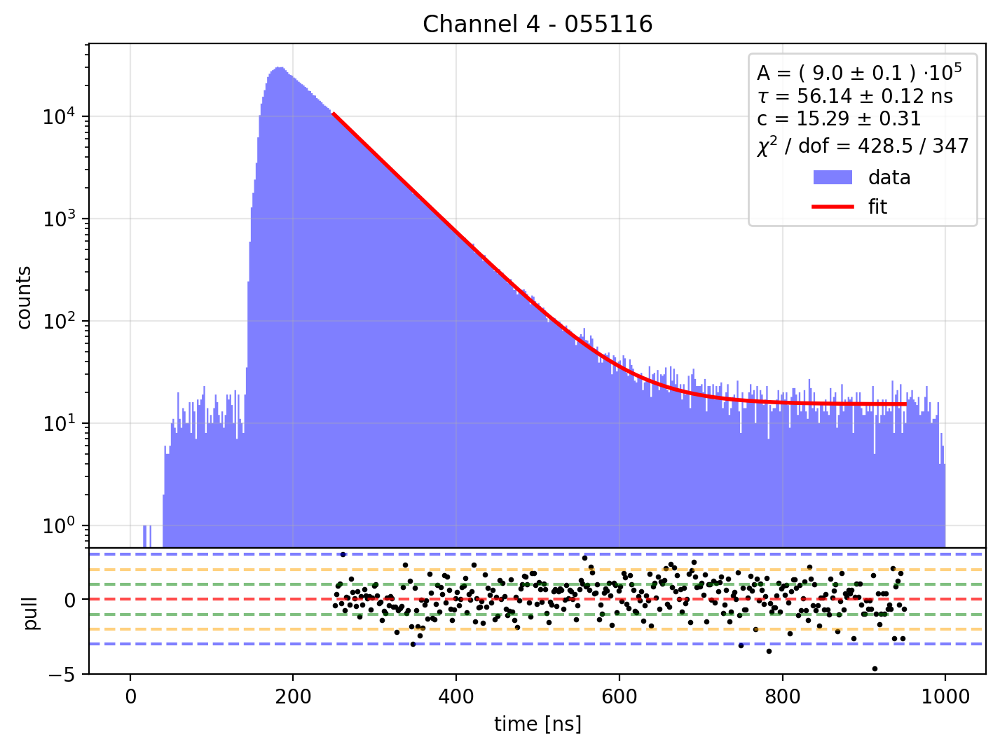

Fit results:
A = 1068418.3799464449 +/- 11036.684563893583
tau = 56.074853469648545 +/- 0.10549099134761845 ns
c = 14.944722936951326 +/- 0.31264039673957456
  = 89937.43041350516 +/- 1881.4717438951816 Hz
chi2 / dof = 434.6811329471892 / 347
p-value = 0.0009416961356736309


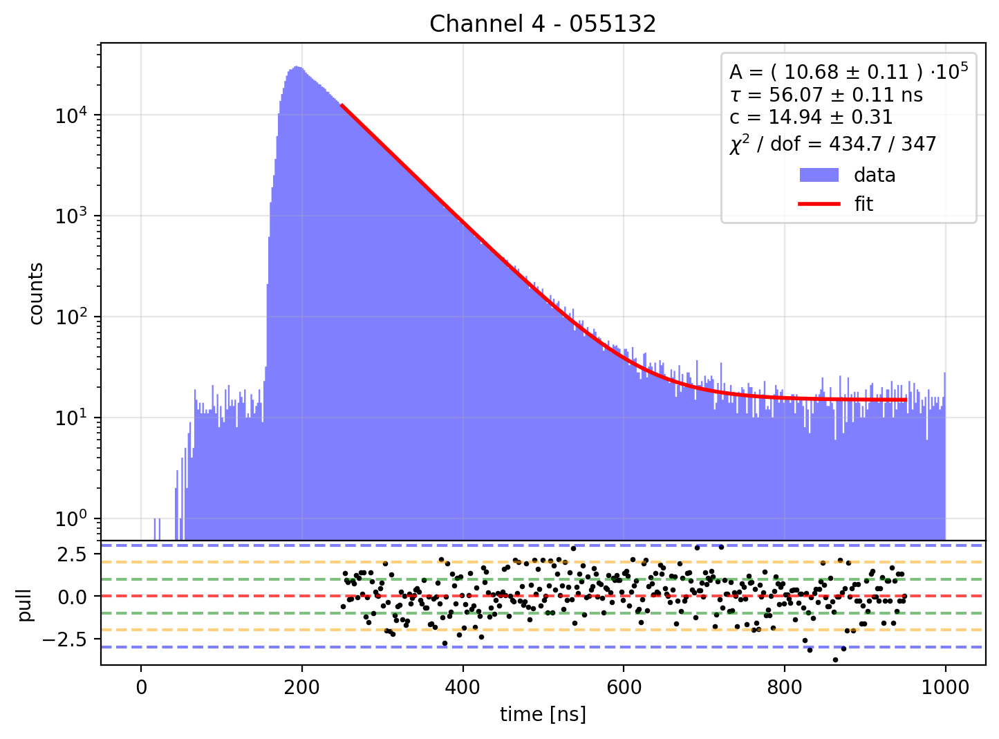

Fit results:
A = 867706.8056502382 +/- 9847.55278696406
tau = 56.306696215954325 +/- 0.116915842376283 ns
c = 15.341400586466138 +/- 0.3148495850270887
  = 92708.48795302236 +/- 1902.64433784801 Hz
chi2 / dof = 415.578887838409 / 347
p-value = 0.006679588176267681


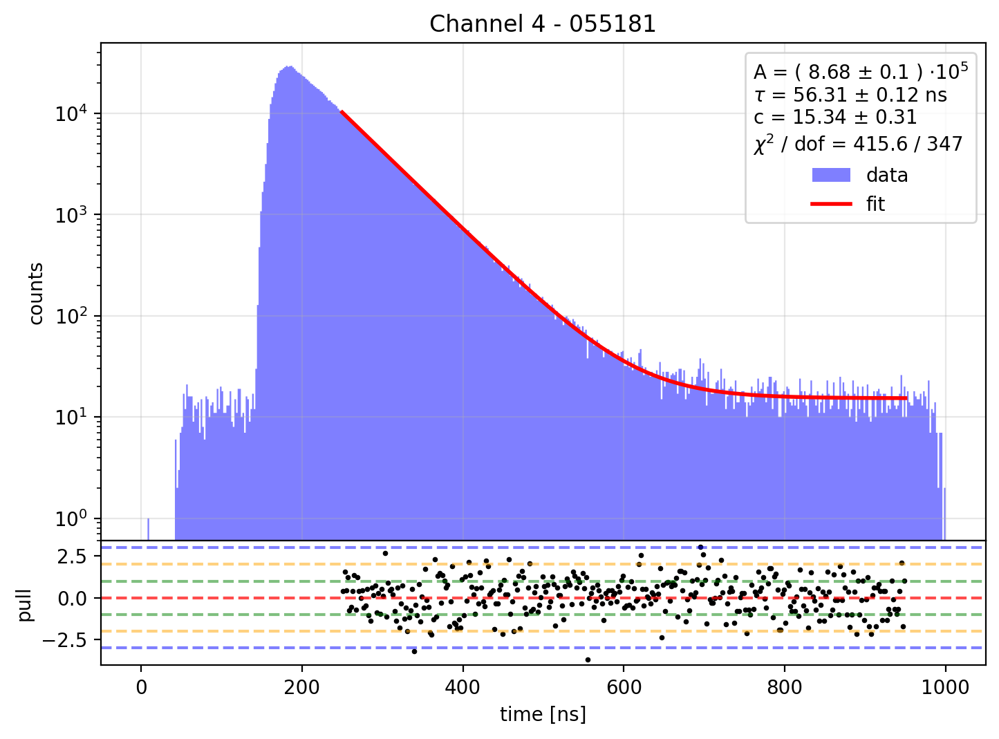

Fit results:
A = 864742.7723080987 +/- 10054.94589542371
tau = 56.06165173453292 +/- 0.11898935592158034 ns
c = 18.13394879847971 +/- 0.33767587452004655
  = 110687.5956691675 +/- 2061.13577806291 Hz
chi2 / dof = 380.8346229538948 / 347
p-value = 0.10205378045653957


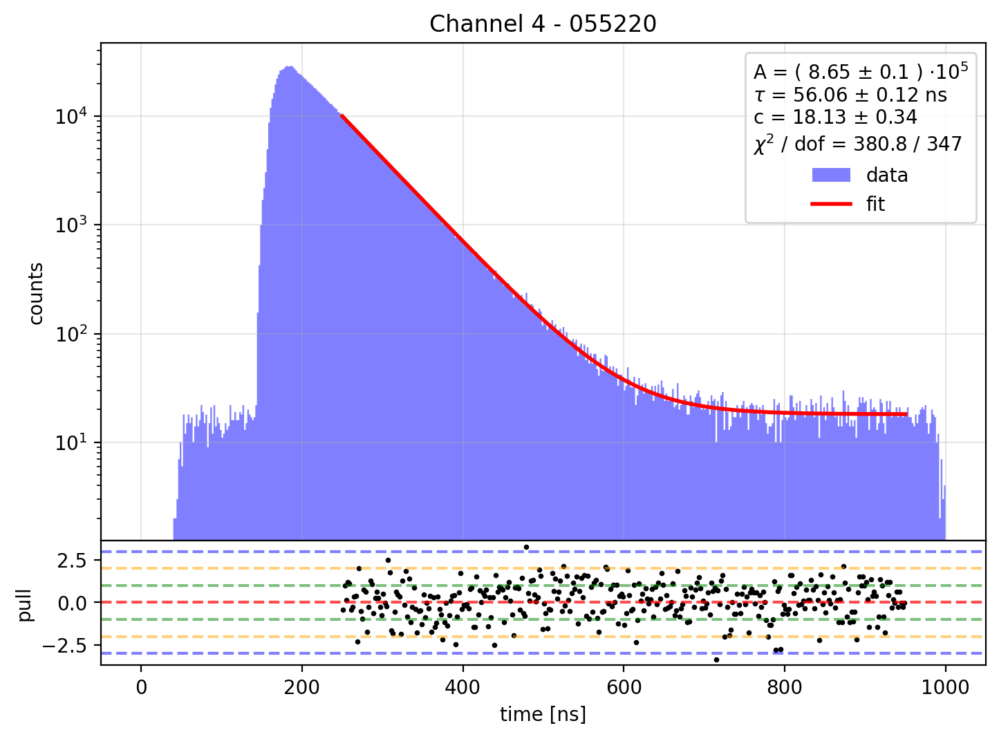

Fit results:
A = 1003596.0058866417 +/- 10848.831147866851
tau = 55.90275319870789 +/- 0.10999958218860785 ns
c = 19.24001405648784 +/- 0.3500106239520875
  = 116990.4416719639 +/- 2128.267545221804 Hz
chi2 / dof = 365.4748343736148 / 347
p-value = 0.23748334718358743


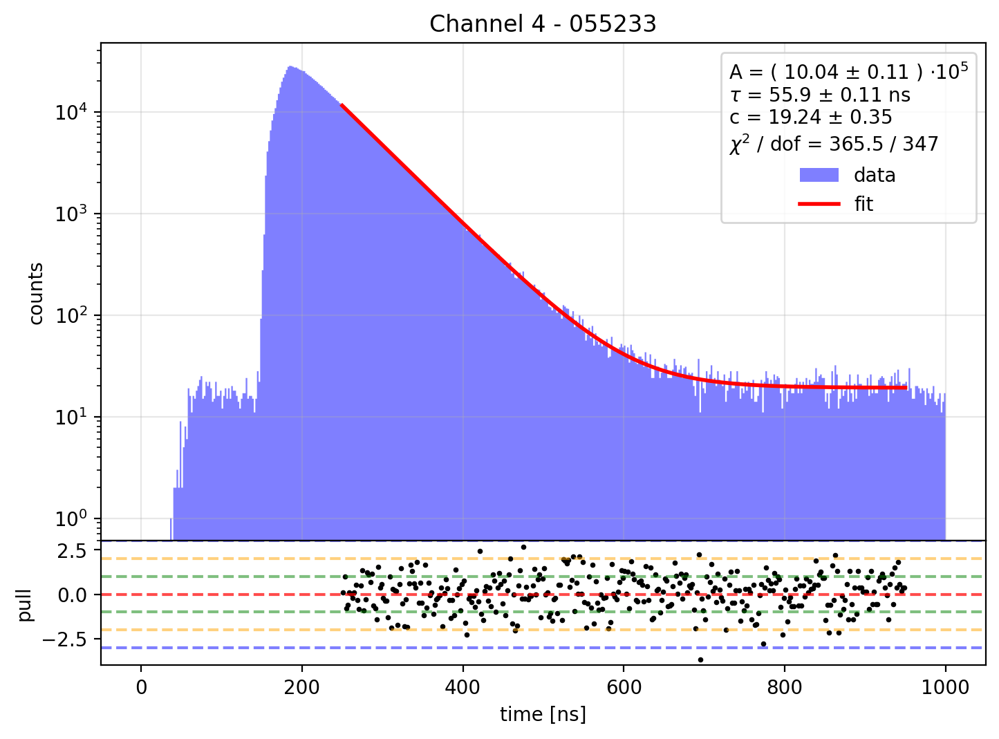

Fit results:
A = 864780.0415648769 +/- 10075.830354228558
tau = 56.12502898457836 +/- 0.11948885647445864 ns
c = 18.990399801589792 +/- 0.342975452869819
  = 115468.42957479929 +/- 2085.4135425978875 Hz
chi2 / dof = 374.0768257717778 / 347
p-value = 0.15211796774761943


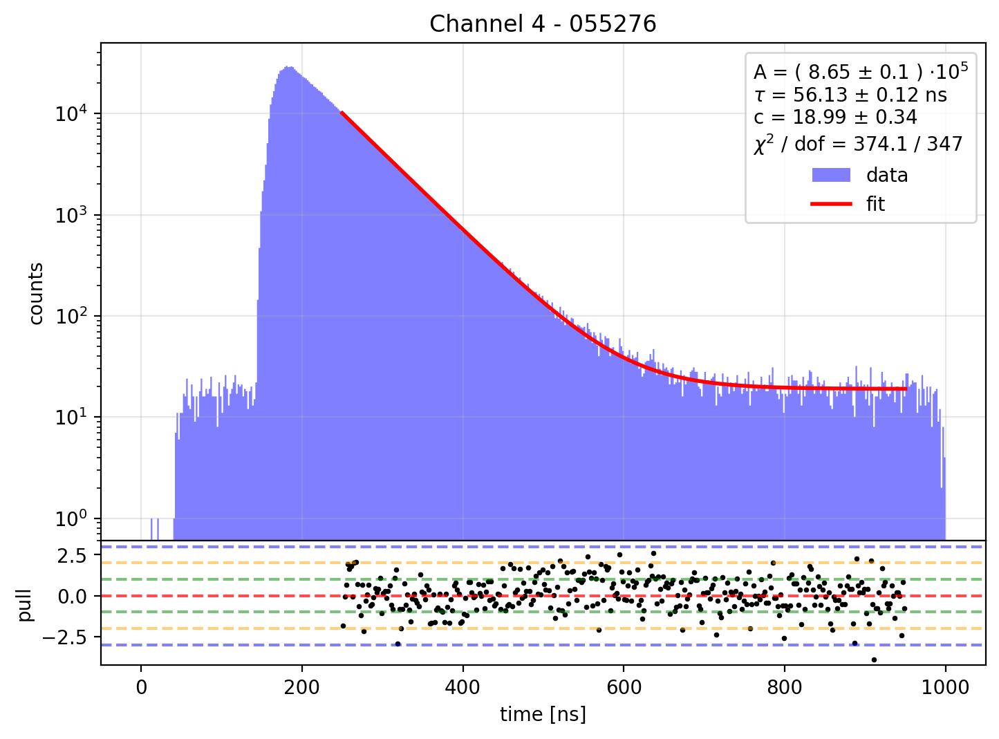

Fit results:
A = 942863.7760329765 +/- 10355.609394498042
tau = 56.195347074201145 +/- 0.11281626899348737 ns
c = 18.30653826818092 +/- 0.34196913760667336
  = 111913.20512648963 +/- 2090.557028492055 Hz
chi2 / dof = 344.94967763486693 / 347
p-value = 0.5209988718588578


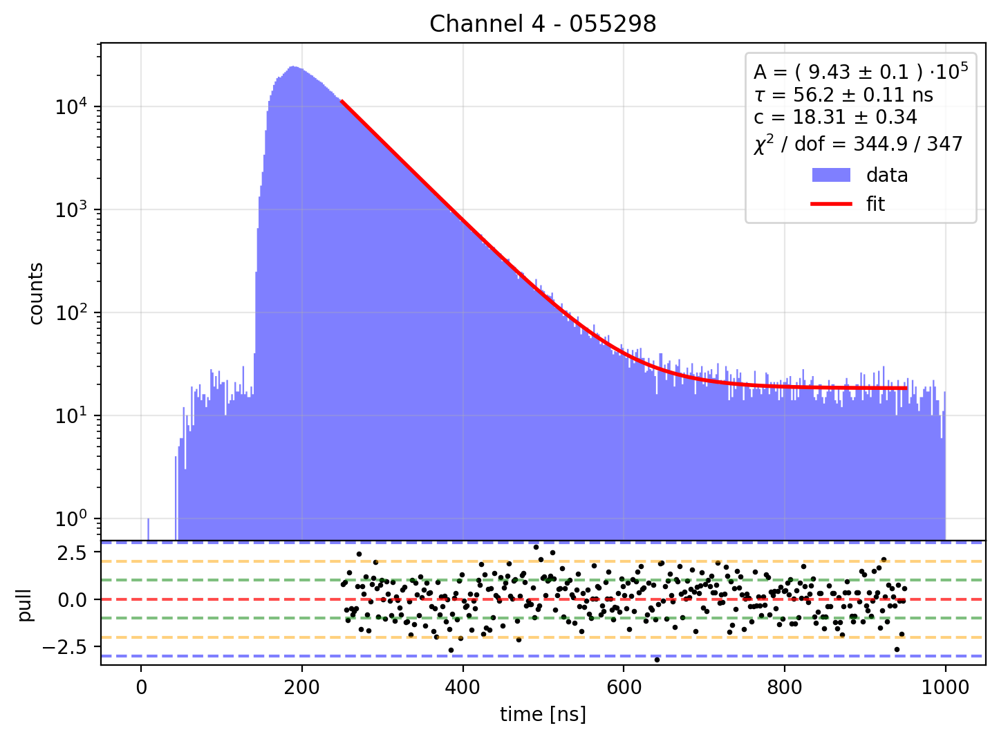

Fit results:
A = 882491.2296406551 +/- 10073.420898207052
tau = 56.19559973081535 +/- 0.11727084863069938 ns
c = 17.93000518145403 +/- 0.3358481514739555
  = 107935.35427499749 +/- 2021.7444917104438 Hz
chi2 / dof = 379.9177685801338 / 347
p-value = 0.10800701731729923


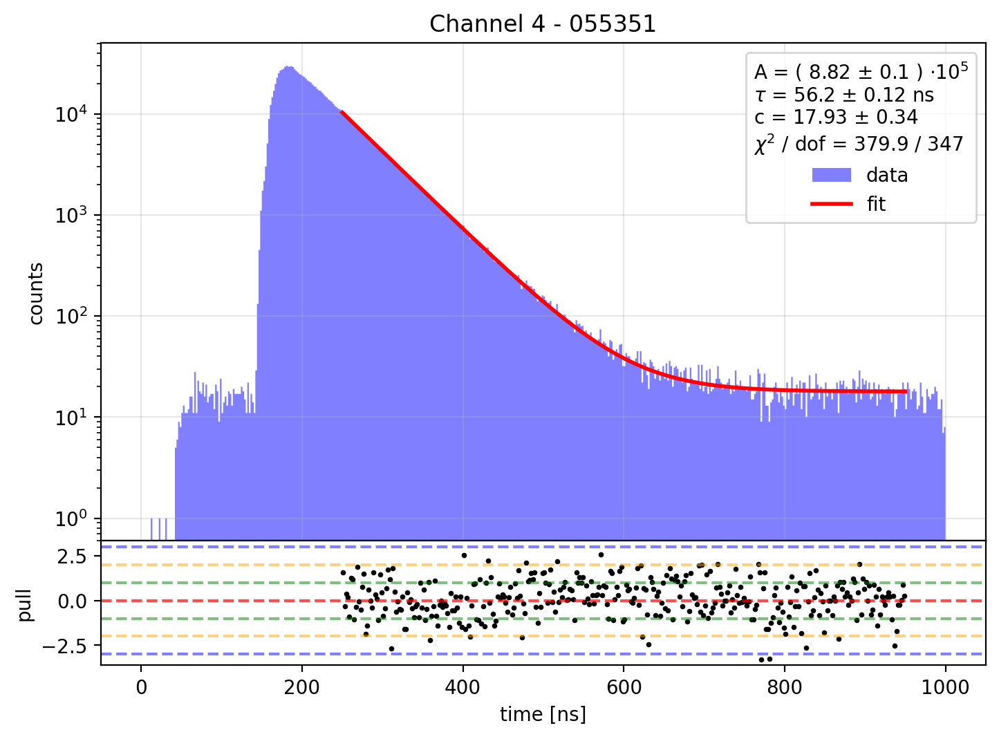

Fit results:
A = 958606.4662364544 +/- 10438.632998886224
tau = 56.16251114249782 +/- 0.11166850041177037 ns
c = 17.30726591619692 +/- 0.3324364571160672
  = 105362.5013161552 +/- 2023.7937534460818 Hz
chi2 / dof = 398.24158979844174 / 347
p-value = 0.02992770138484324


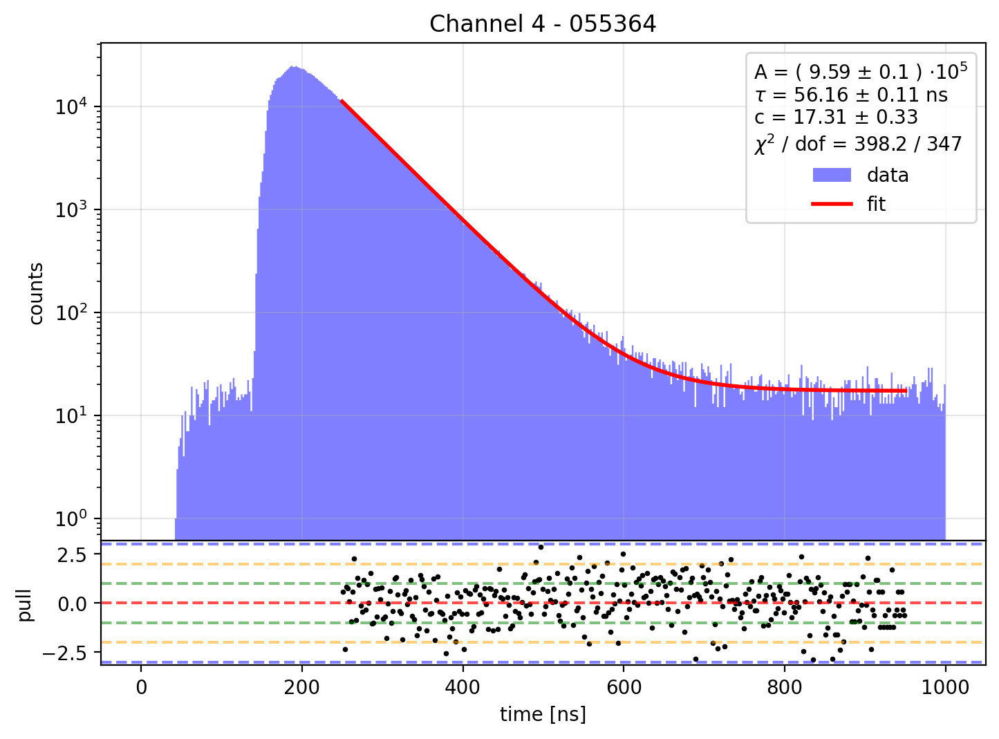

Fit results:
A = 868932.6063083414 +/- 9985.673506307152
tau = 56.186289765043135 +/- 0.11804585202738858 ns
c = 17.745270467727043 +/- 0.3352362086371681
  = 108246.43129385632 +/- 2044.946189546818 Hz
chi2 / dof = 339.61002649679483 / 347
p-value = 0.6014804936801251


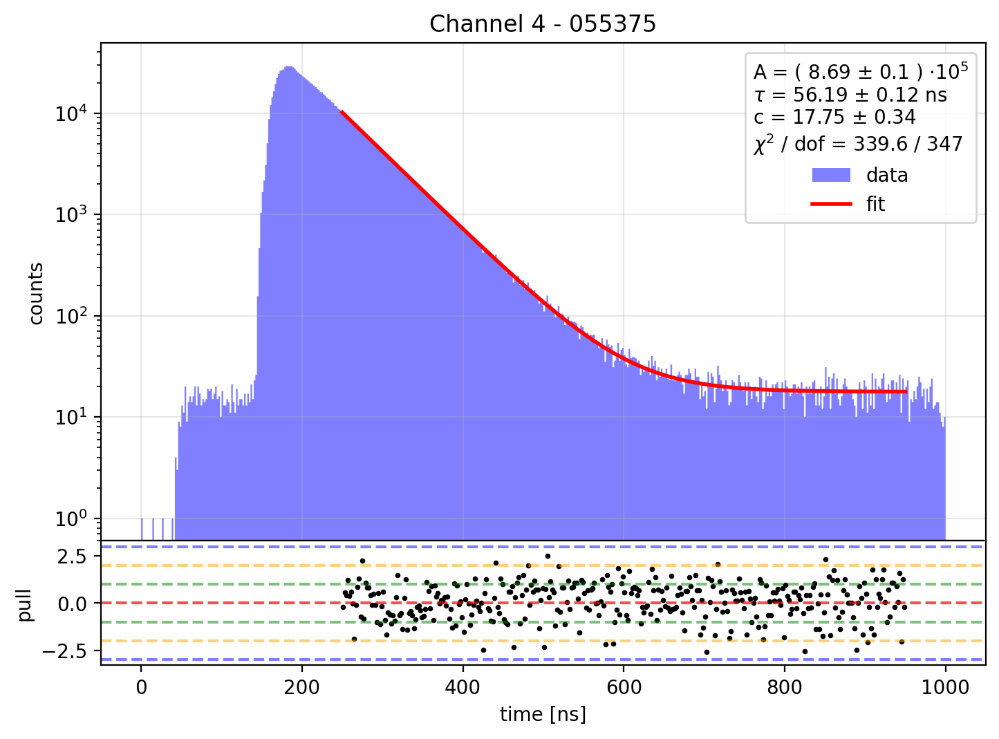

Fit results:
A = 842251.759409943 +/- 9640.157874685472
tau = 56.39977447881635 +/- 0.11836263386899873 ns
c = 16.653414570241043 +/- 0.3284678913571266
  = 101689.06361585317 +/- 2005.6903140853317 Hz
chi2 / dof = 362.8734072030679 / 347
p-value = 0.26802046212699493


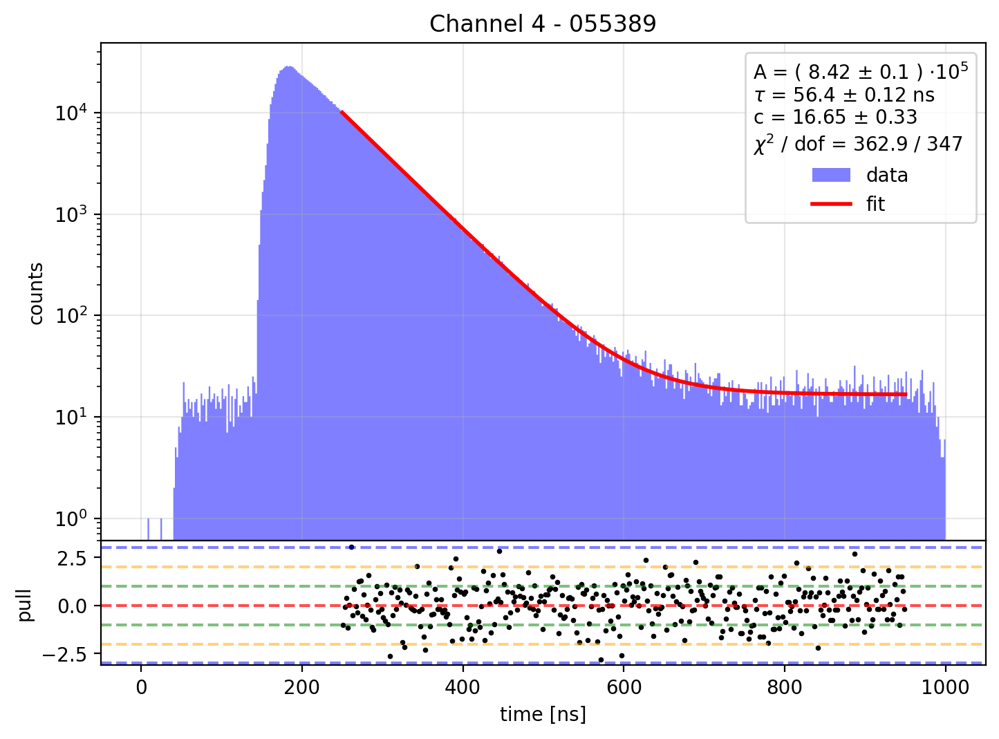

Fit results:
A = 841856.0613803094 +/- 9634.836513950697
tau = 56.549795473350365 +/- 0.11886701027559789 ns
c = 16.11268491094333 +/- 0.3207049346226869
  = 97863.78435256267 +/- 1947.8689452557453 Hz
chi2 / dof = 405.10767912788873 / 347
p-value = 0.017071745988653353


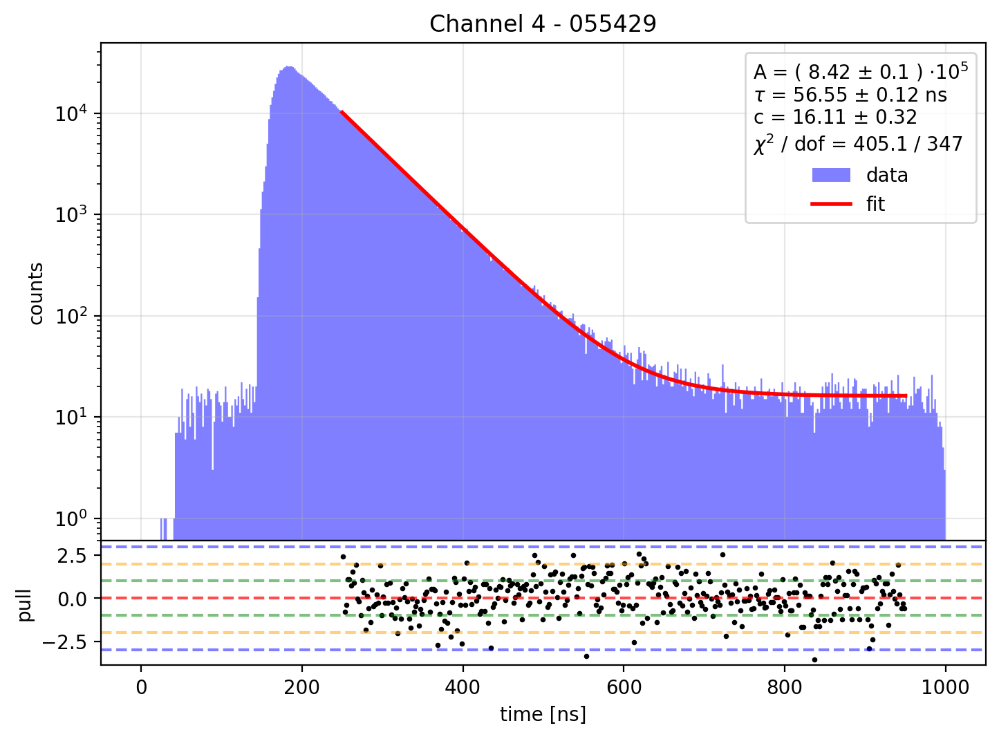

Fit results:
A = 892954.1797320725 +/- 9874.115457425565
tau = 56.53667988540635 +/- 0.1147678723302899 ns
c = 16.21996489057586 +/- 0.32382520502790424
  = 95825.29799591092 +/- 1913.1142995516182 Hz
chi2 / dof = 360.3083855980189 / 347
p-value = 0.30010735858227877


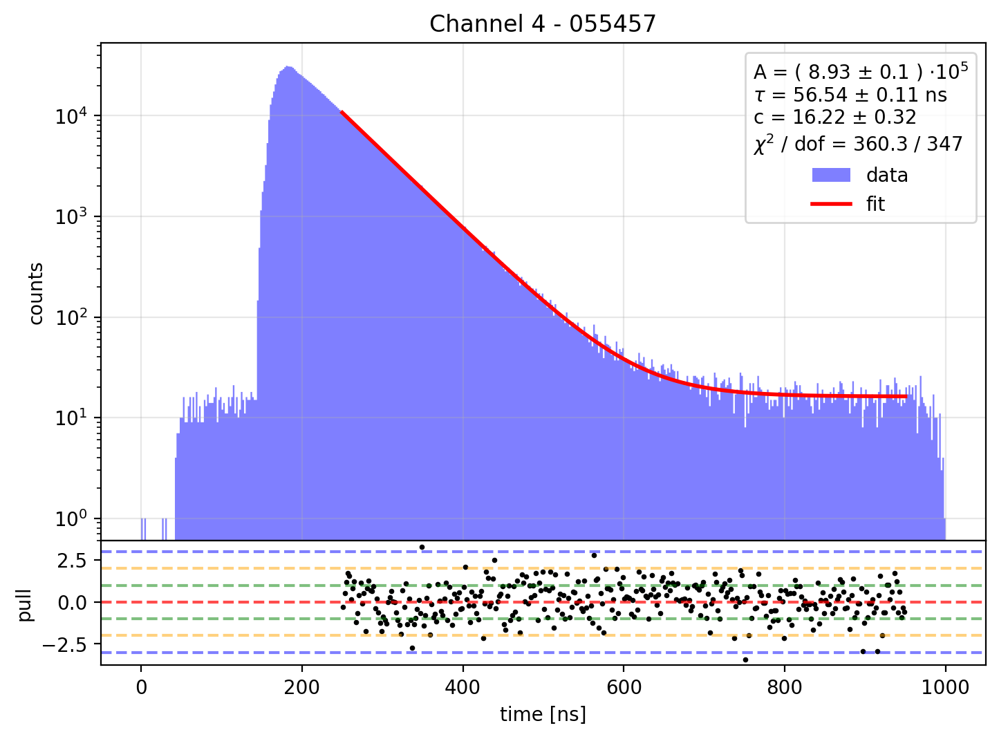

Fit results:
A = 944438.9731410067 +/- 10099.49673506593
tau = 56.512265788492755 +/- 0.11082162350591553 ns
c = 14.905896750946068 +/- 0.3141266025251479
  = 90123.56404069113 +/- 1899.2623827052246 Hz
chi2 / dof = 398.04987742569176 / 347
p-value = 0.0303815815658548


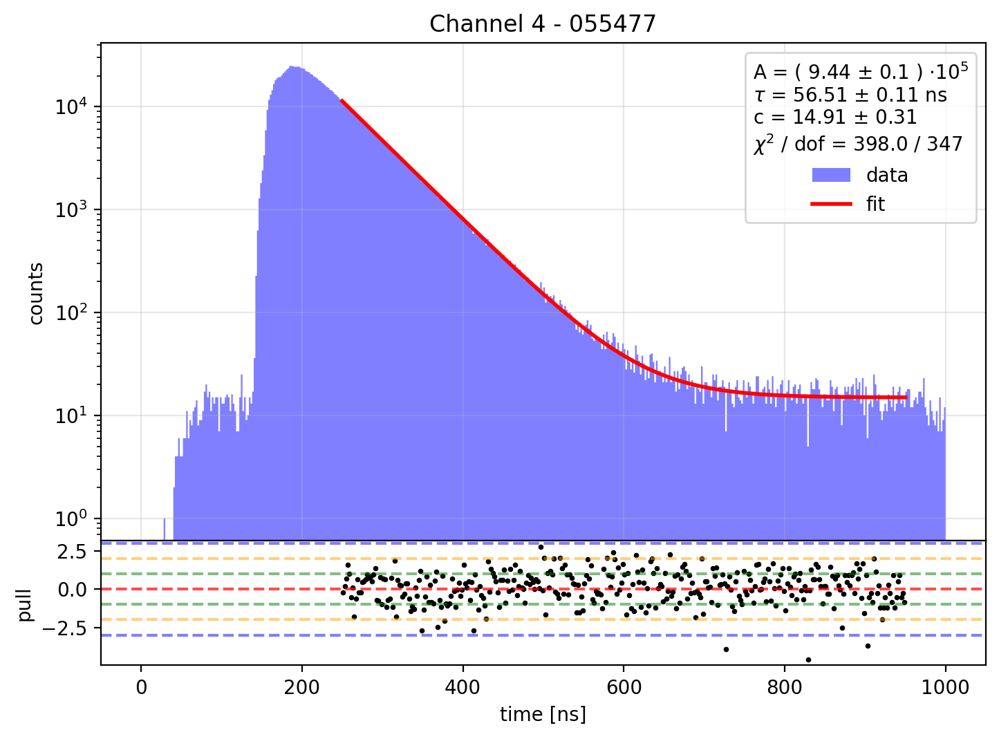

Fit results:
A = 869463.098581605 +/- 9810.248851132823
tau = 56.421179823833256 +/- 0.11663206455111201 ns
c = 14.95679933905466 +/- 0.31048390201595666
  = 90104.4576253037 +/- 1870.4525586223397 Hz
chi2 / dof = 406.5719618487978 / 347
p-value = 0.015061434859731437


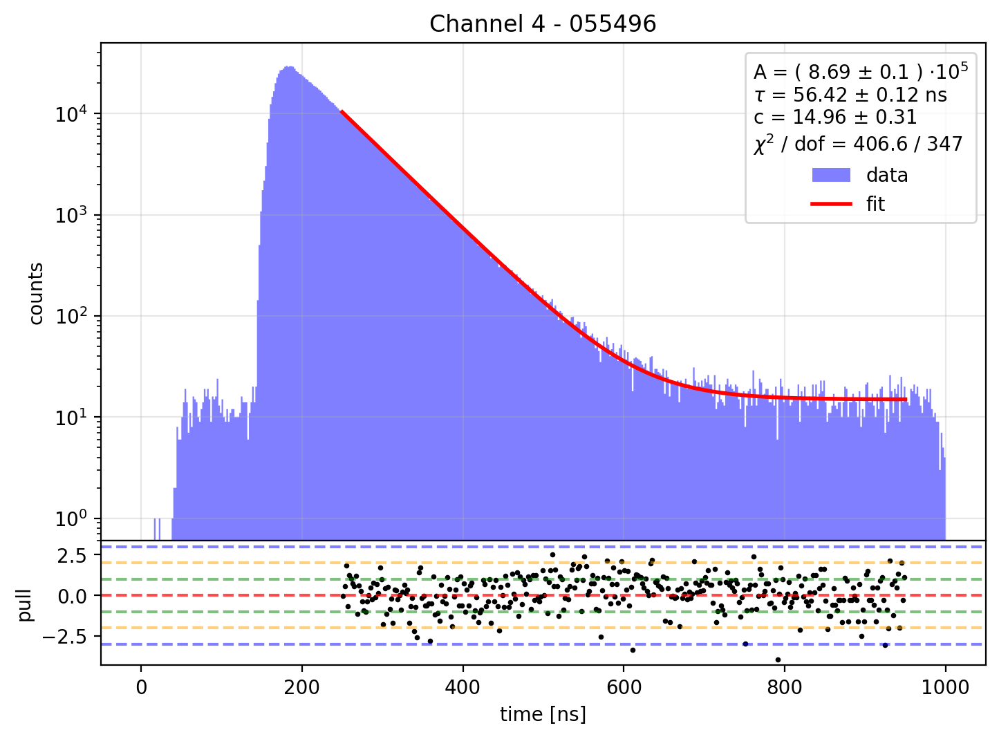

Fit results:
A = 870164.5855484379 +/- 9880.625363022995
tau = 56.301872536173995 +/- 0.1169616612350064 ns
c = 15.698587909256972 +/- 0.31699508486690675
  = 94815.41287224117 +/- 1914.5683690699207 Hz
chi2 / dof = 359.8584326862505 / 347
p-value = 0.30592653741969844


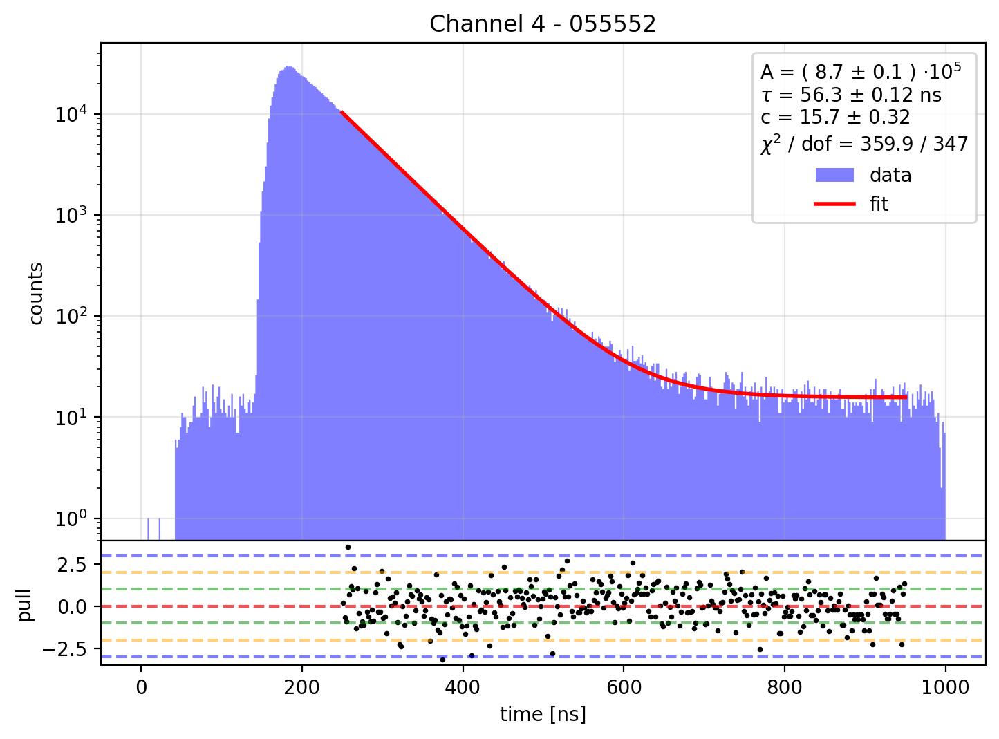

Fit results:
A = 853507.8826774727 +/- 9768.594022270168
tau = 56.35910448289075 +/- 0.11809020002614656 ns
c = 15.067956035857117 +/- 0.31072461388313144
  = 91578.47544523458 +/- 1888.4901412647168 Hz
chi2 / dof = 429.66526936295304 / 347
p-value = 0.0016233759546109283


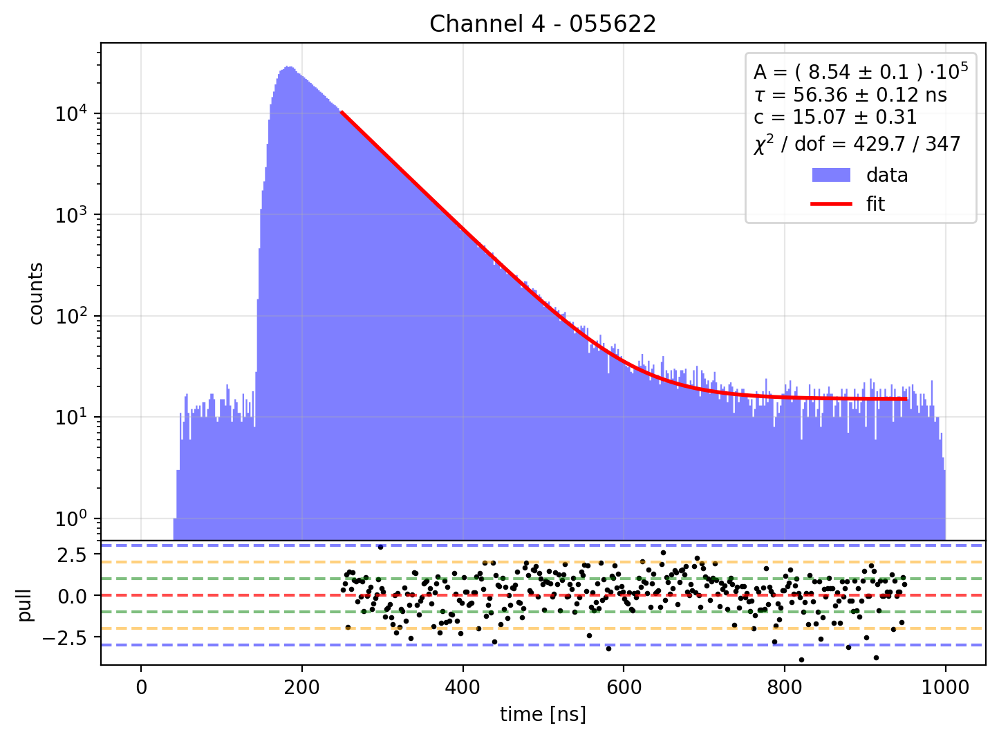

Fit results:
A = 838186.9246487656 +/- 9740.5147271577
tau = 56.232984948842784 +/- 0.11939311406315743 ns
c = 14.11589366733212 +/- 0.30105205998477036
  = 87391.92731316783 +/- 1863.8224659169557 Hz
chi2 / dof = 389.6700702824077 / 347
p-value = 0.05673448733803099


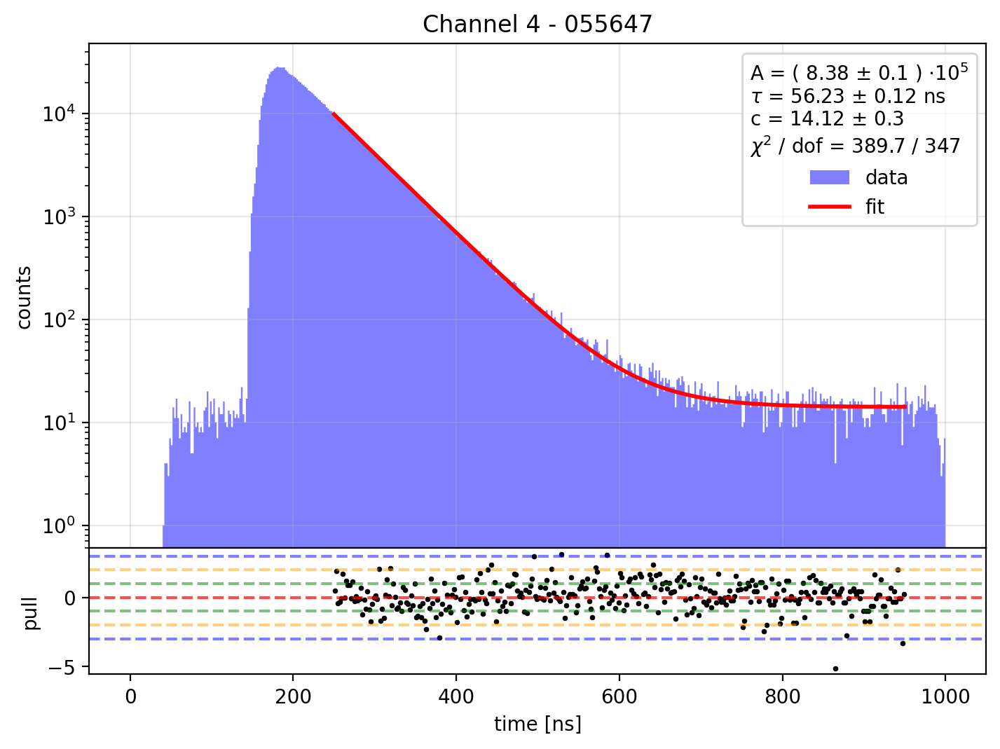

Fit results:
A = 946156.0939929673 +/- 10140.162931215846
tau = 56.34124482105426 +/- 0.11042173720961829 ns
c = 14.326558463169693 +/- 0.30800885917148246
  = 85130.18279856018 +/- 1830.226746517811 Hz
chi2 / dof = 383.1054755863413 / 347
p-value = 0.08837993027597013


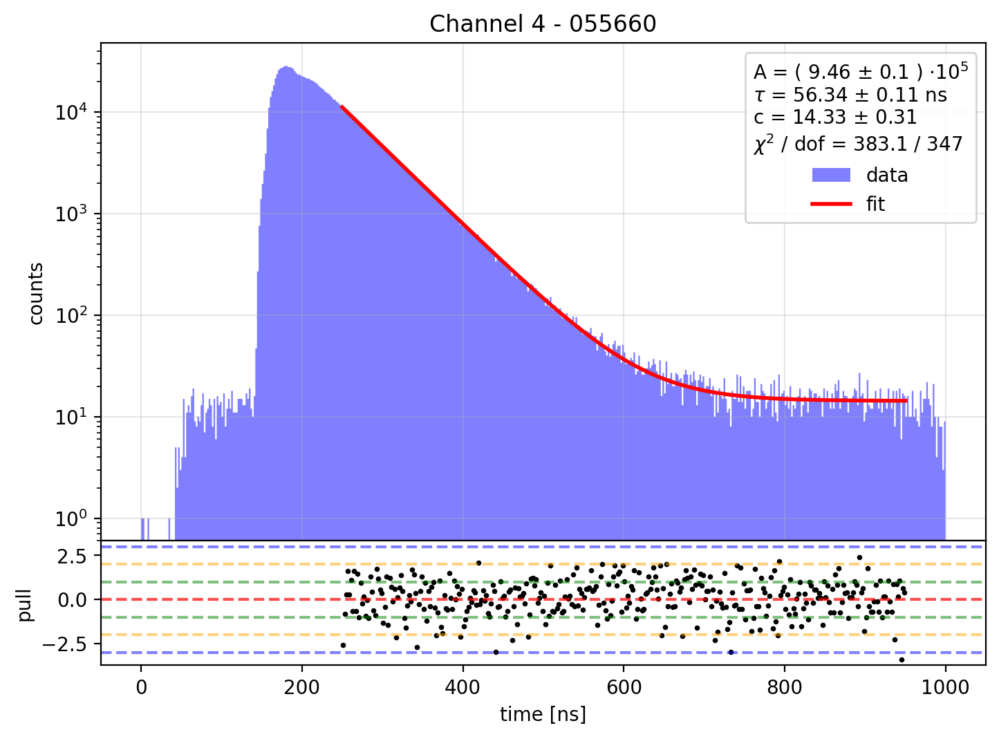

Fit results:
A = 939664.4236527738 +/- 10398.641096972282
tau = 55.995364137854125 +/- 0.11277501243680138 ns
c = 14.321358363771163 +/- 0.304622494917437
  = 84152.20210931206 +/- 1789.9596608226211 Hz
chi2 / dof = 356.76850034054024 / 347
p-value = 0.34729465895536604


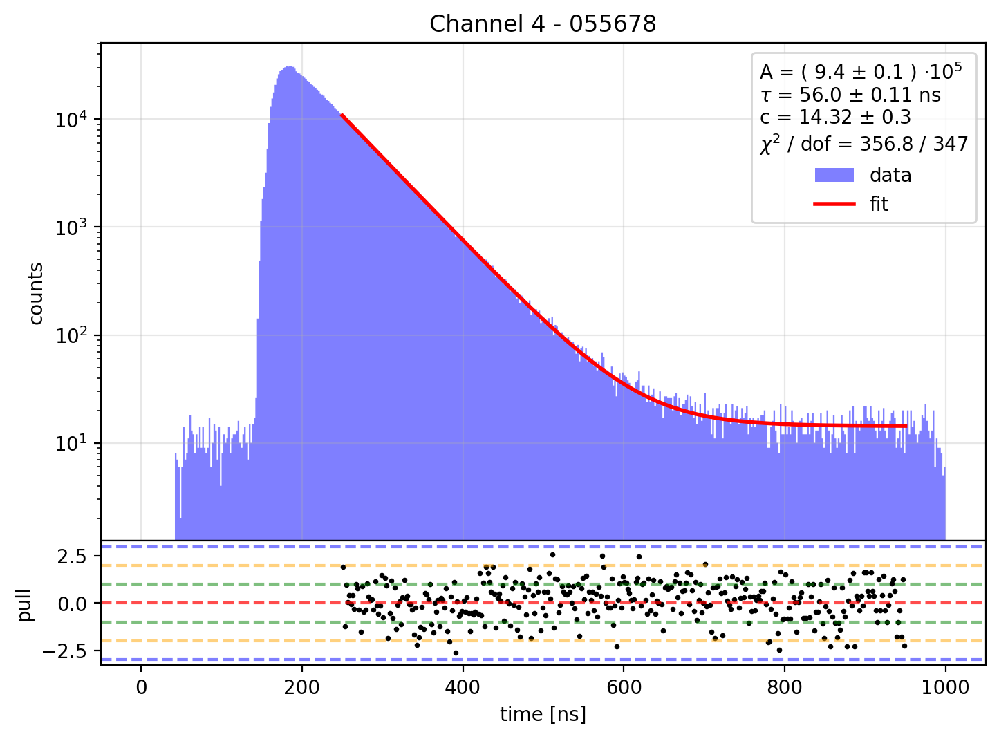

Fit results:
A = 936498.8071510433 +/- 10503.87368770577
tau = 55.83693833170435 +/- 0.1137870742635418 ns
c = 15.455687804197536 +/- 0.3153174650095494
  = 91485.17126704748 +/- 1866.4243646313491 Hz
chi2 / dof = 377.9175501031216 / 347
p-value = 0.12188981624777706


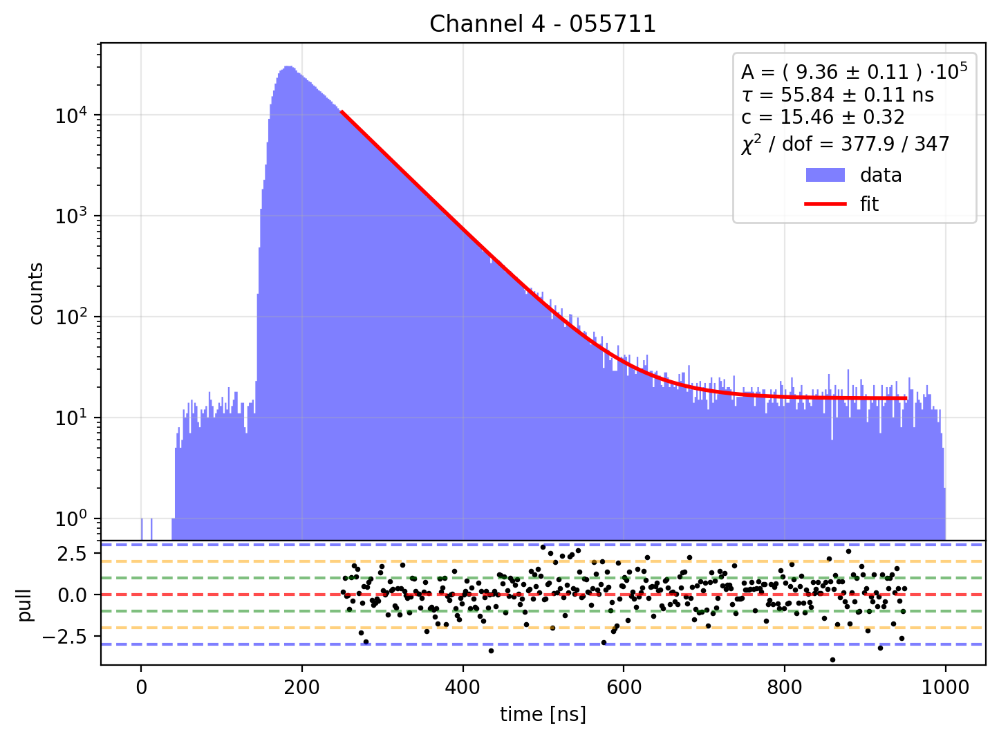

Fit results:
A = 954376.8649518917 +/- 10649.641562115892
tau = 55.84489275350005 +/- 0.11333325992437092 ns
c = 18.49021017607273 +/- 0.34130759447544357
  = 111329.13175145845 +/- 2055.0052049868355 Hz
chi2 / dof = 354.9851620578857 / 347
p-value = 0.3721819447852571


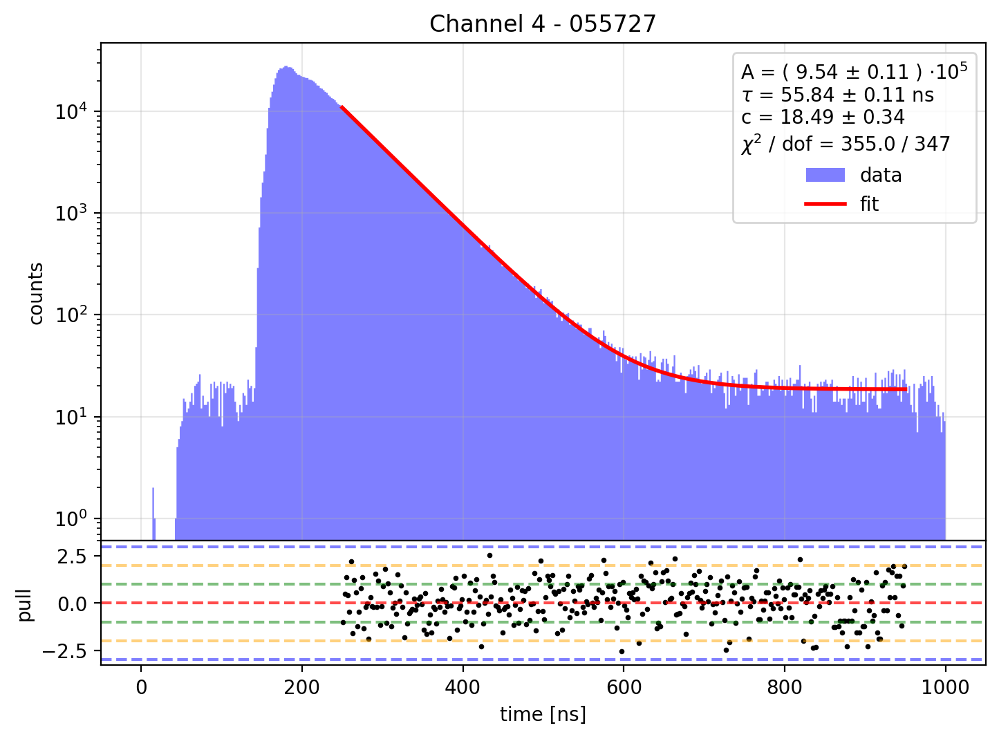

Fit results:
A = 869636.2008020527 +/- 10213.916817637108
tau = 55.919666760660455 +/- 0.11965688872557745 ns
c = 18.78793403169602 +/- 0.34118066270745473
  = 114610.89034024708 +/- 2081.2836288337244 Hz
chi2 / dof = 359.58133465172426 / 347
p-value = 0.309537296448949


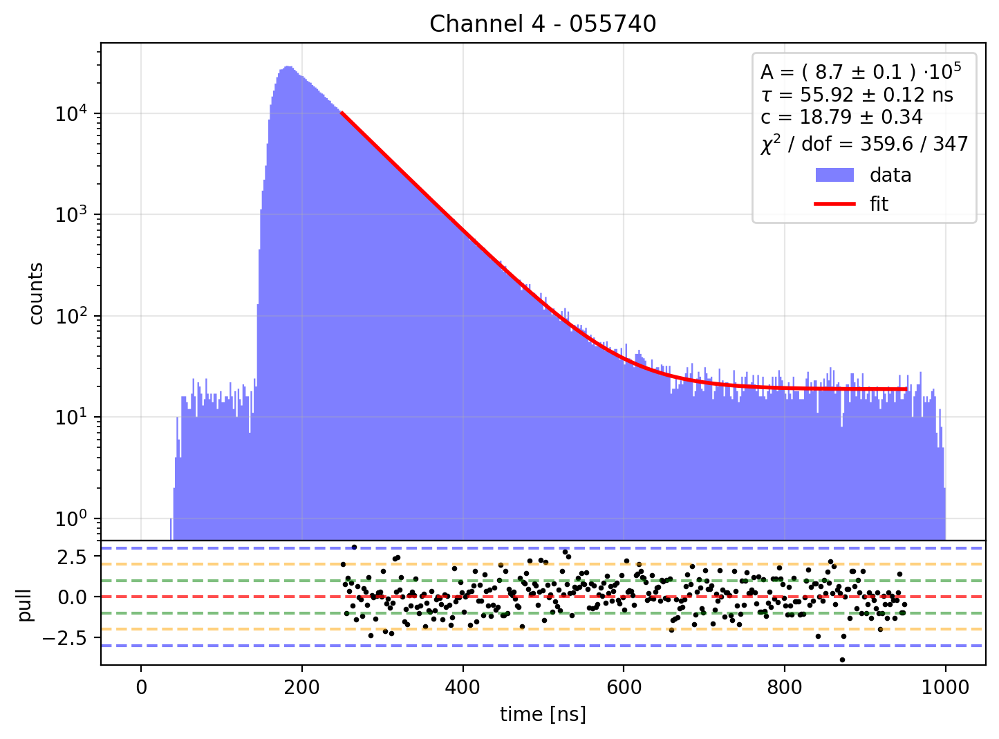

Fit results:
A = 927194.3218537698 +/- 10103.360741973212
tau = 56.42817948571494 +/- 0.11275047287350258 ns
c = 17.705171324578 +/- 0.3382230485531963
  = 107013.51073798414 +/- 2044.2861113654824 Hz
chi2 / dof = 356.75179586175074 / 347
p-value = 0.3475245642154461


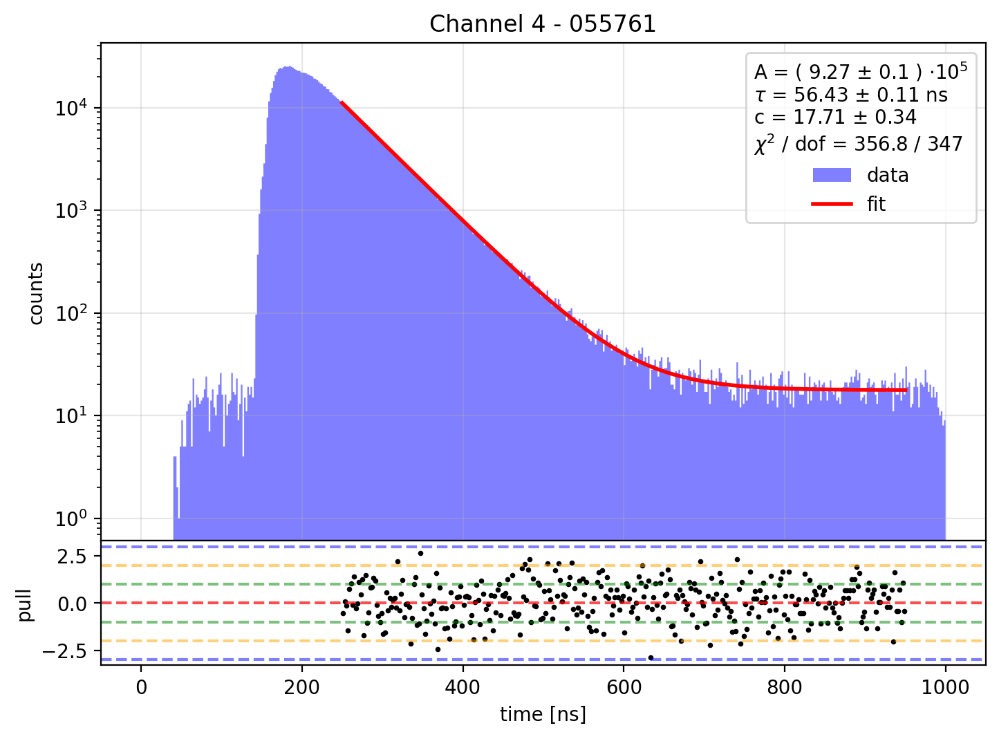

Fit results:
A = 1028411.6626035338 +/- 10746.072532974878
tau = 56.235036891942556 +/- 0.10733129860702877 ns
c = 16.406121796544447 +/- 0.3263364082323239
  = 98635.97544967502 +/- 1961.9816523316533 Hz
chi2 / dof = 442.897293650497 / 347
p-value = 0.000368935785778457


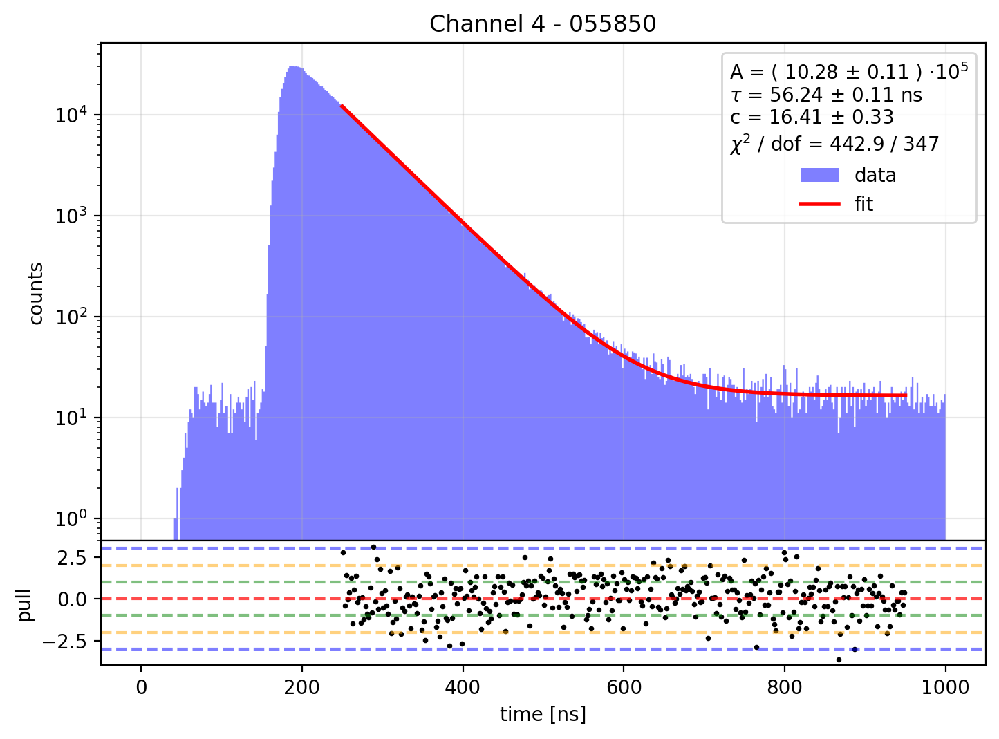

Fit results:
A = 852460.4544279616 +/- 9624.848532353593
tau = 56.471412543730644 +/- 0.11692990399060747 ns
c = 15.35979221751264 +/- 0.31589094290215947
  = 92942.06906313998 +/- 1911.4554035541107 Hz
chi2 / dof = 426.2480755814292 / 347
p-value = 0.002324166335654798


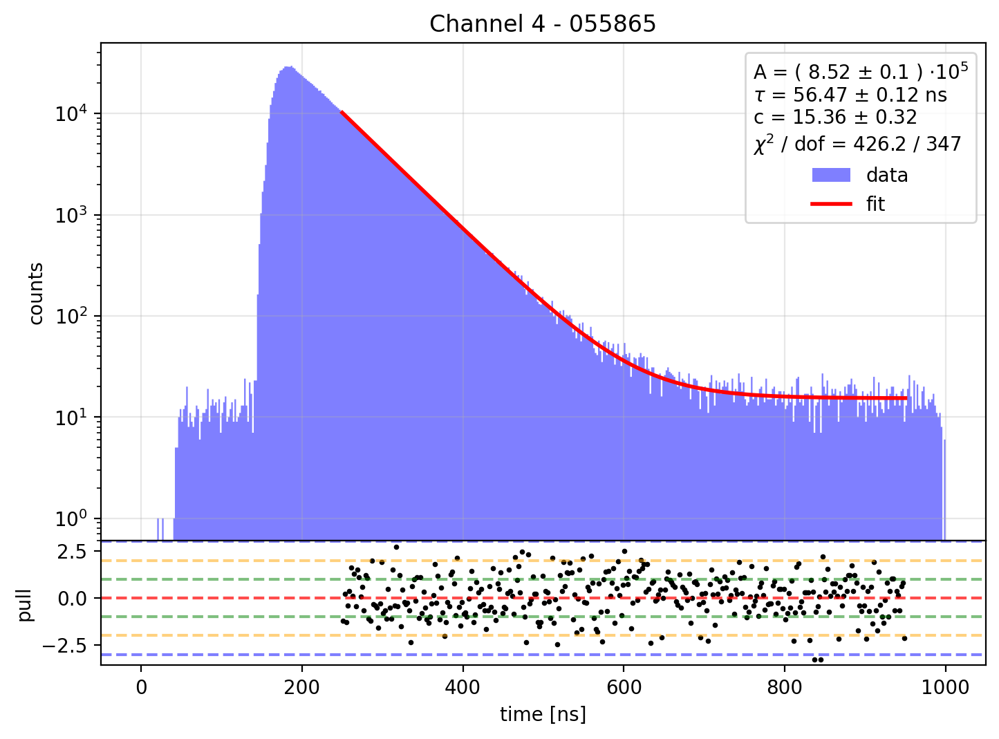

Fit results:
A = 890556.2292429593 +/- 9856.638937164673
tau = 56.47199483456639 +/- 0.11457189678805839 ns
c = 14.288657386903713 +/- 0.30697243965595167
  = 84962.5237067341 +/- 1825.304678764816 Hz
chi2 / dof = 367.85430454412716 / 347
p-value = 0.2114271038942135


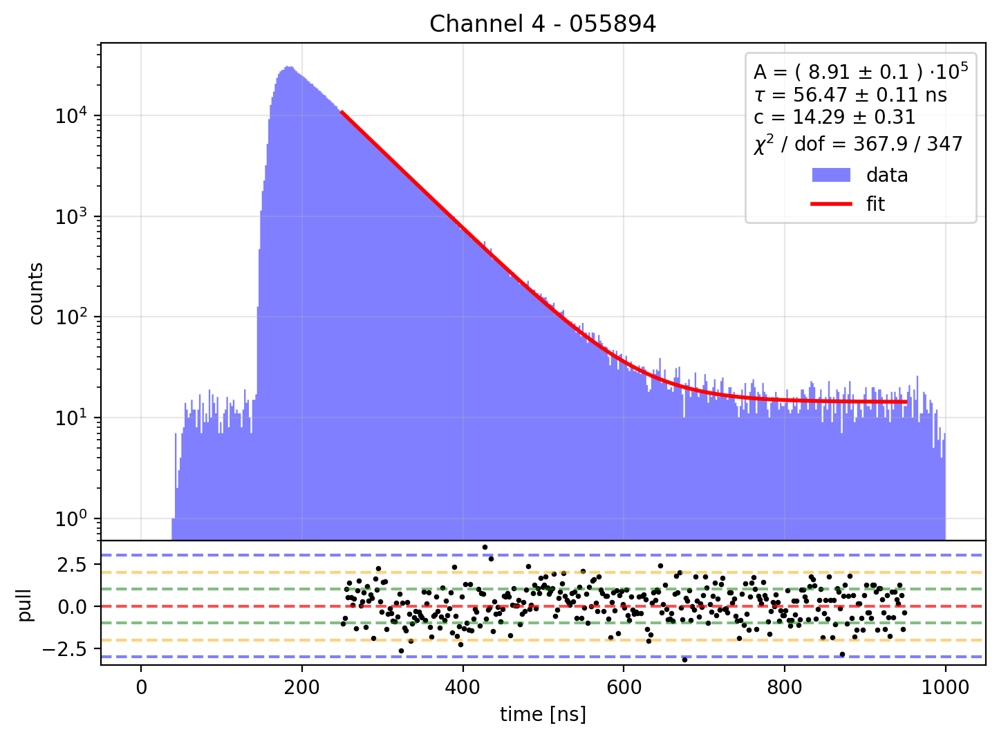

Fit results:
A = 869019.0352731819 +/- 9981.992896548625
tau = 56.081940477975614 +/- 0.11743172061371031 ns
c = 14.016612361242176 +/- 0.3013185763546815
  = 85399.4538551281 +/- 1835.853142964001 Hz
chi2 / dof = 390.23784958363984 / 347
p-value = 0.05449655971132794


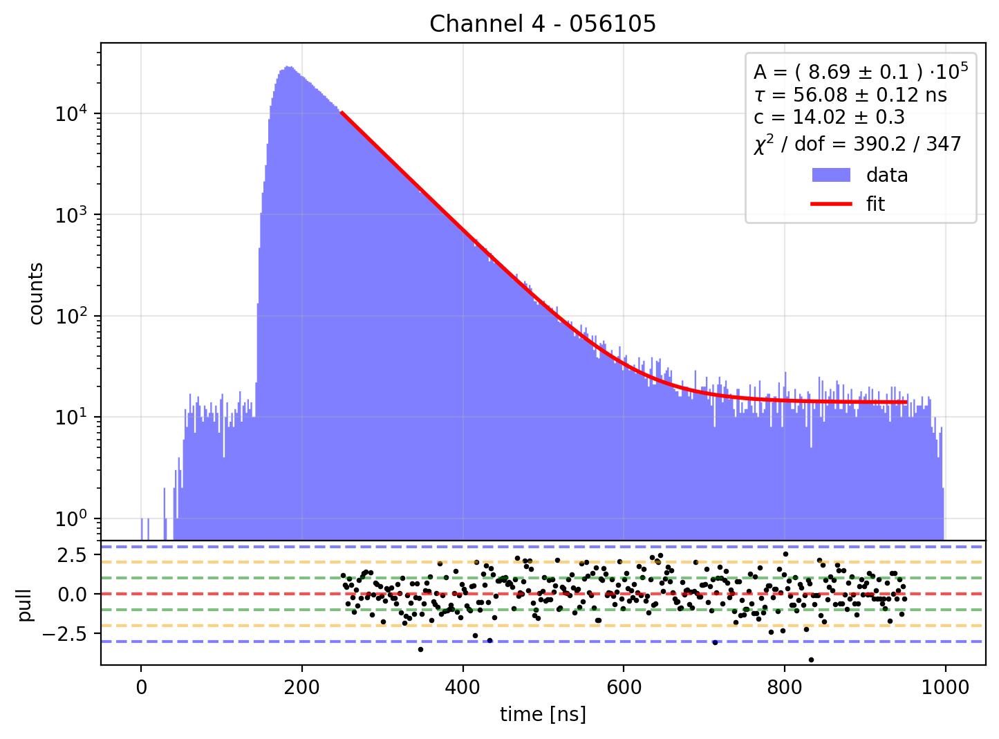

Fit results:
A = 902280.414089354 +/- 10536.791160106493
tau = 55.44982914606166 +/- 0.11693974703467475 ns
c = 13.608977604929759 +/- 0.29532594240452337
  = 83567.56281811335 +/- 1813.4844482930512 Hz
chi2 / dof = 365.1622404362494 / 347
p-value = 0.24104143879994522


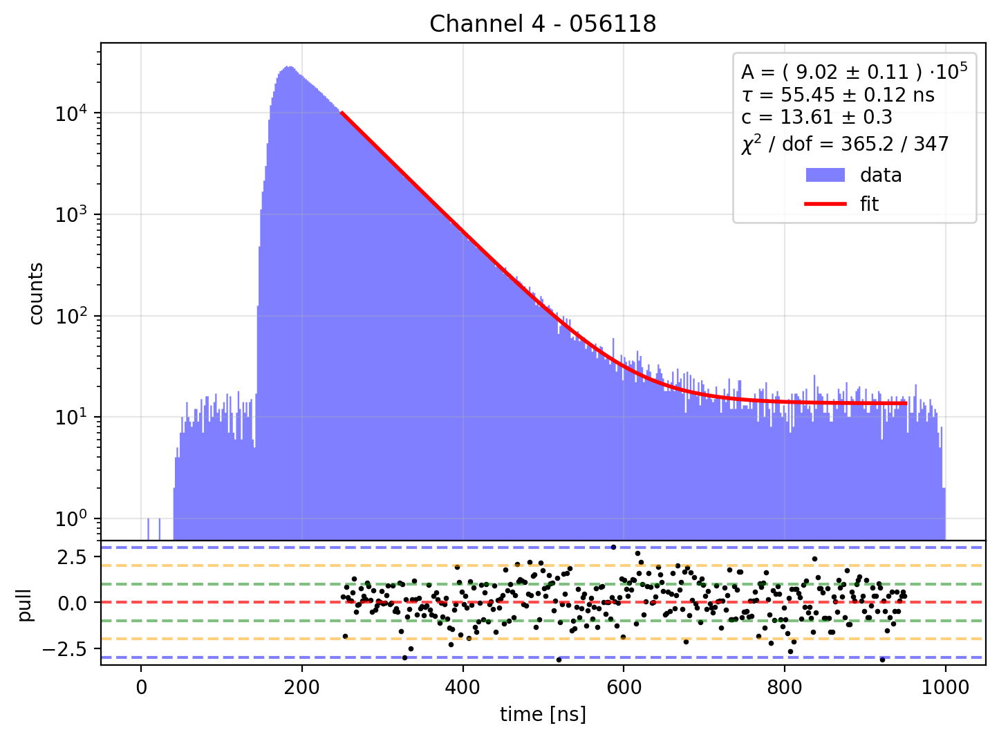

Fit results:
A = 922775.0347699461 +/- 10929.956475898744
tau = 55.104361790430794 +/- 0.11723123619213656 ns
c = 12.735106225708883 +/- 0.2842387323180695
  = 78288.94574045838 +/- 1747.354933472284 Hz
chi2 / dof = 401.1393932605038 / 347
p-value = 0.02373947043194069


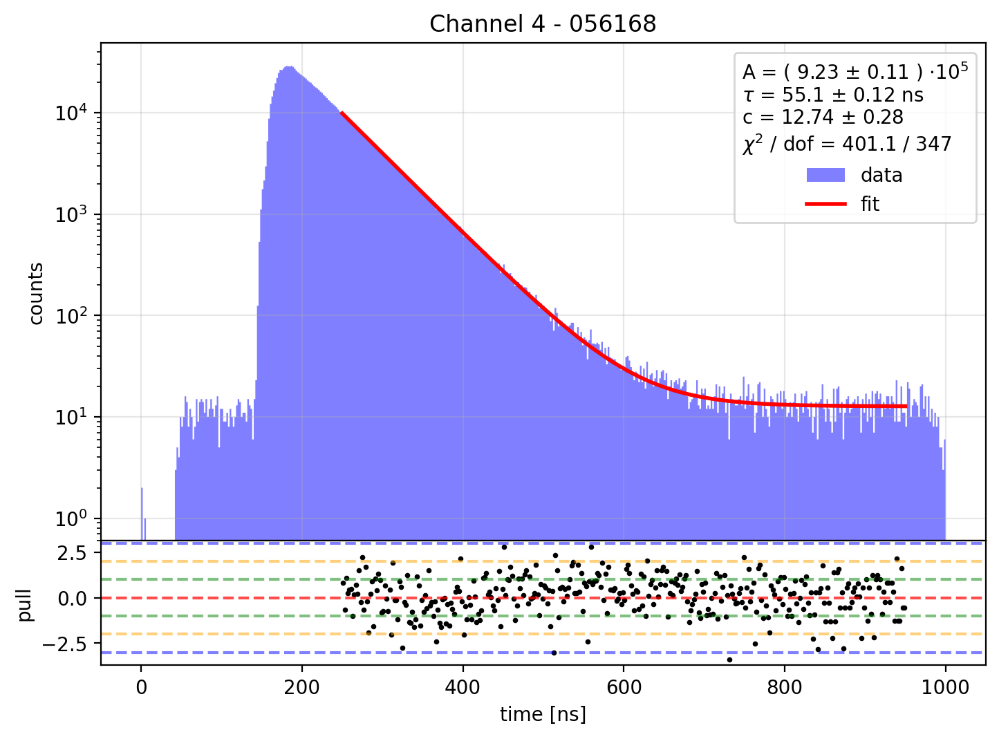

Fit results:
A = 949699.4616638154 +/- 11138.573094924463
tau = 55.000608289888376 +/- 0.11569847493209676 ns
c = 13.378711927348803 +/- 0.2908836221584812
  = 81271.25786577897 +/- 1767.0219669688684 Hz
chi2 / dof = 382.5050142812357 / 347
p-value = 0.09185013152446153


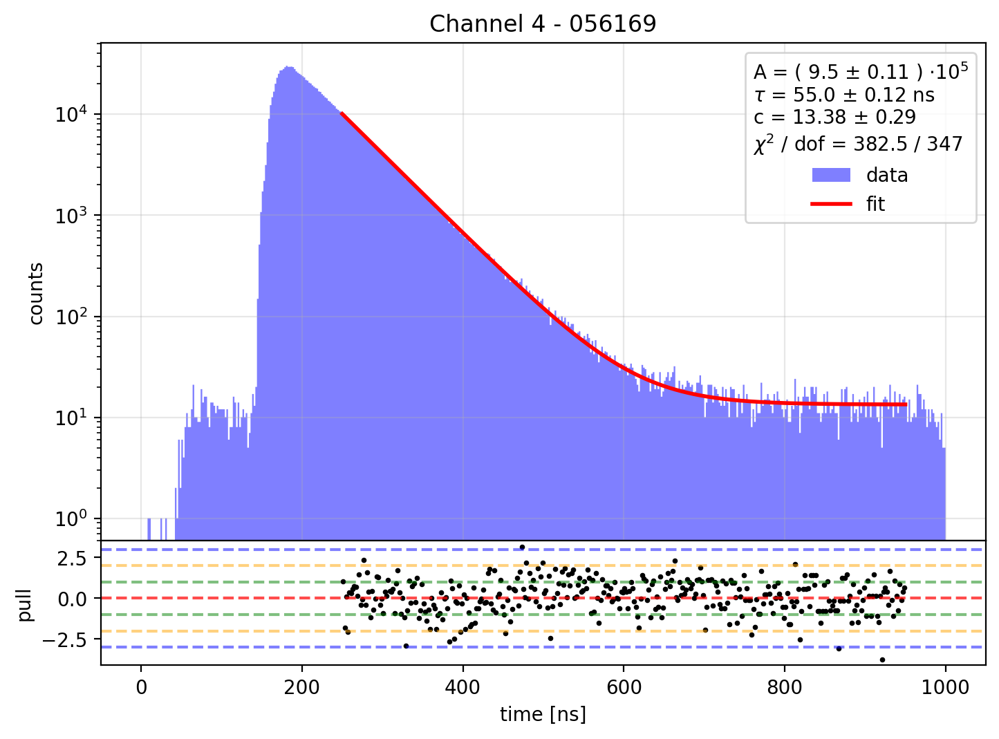

Fit results:
A = 928187.4261032855 +/- 10801.31348053515
tau = 55.21084796396363 +/- 0.11556210148529521 ns
c = 12.190796986637105 +/- 0.2818494304809036
  = 74181.2422363489 +/- 1715.0593927205127 Hz
chi2 / dof = 329.369743749145 / 347
p-value = 0.7439267666596991


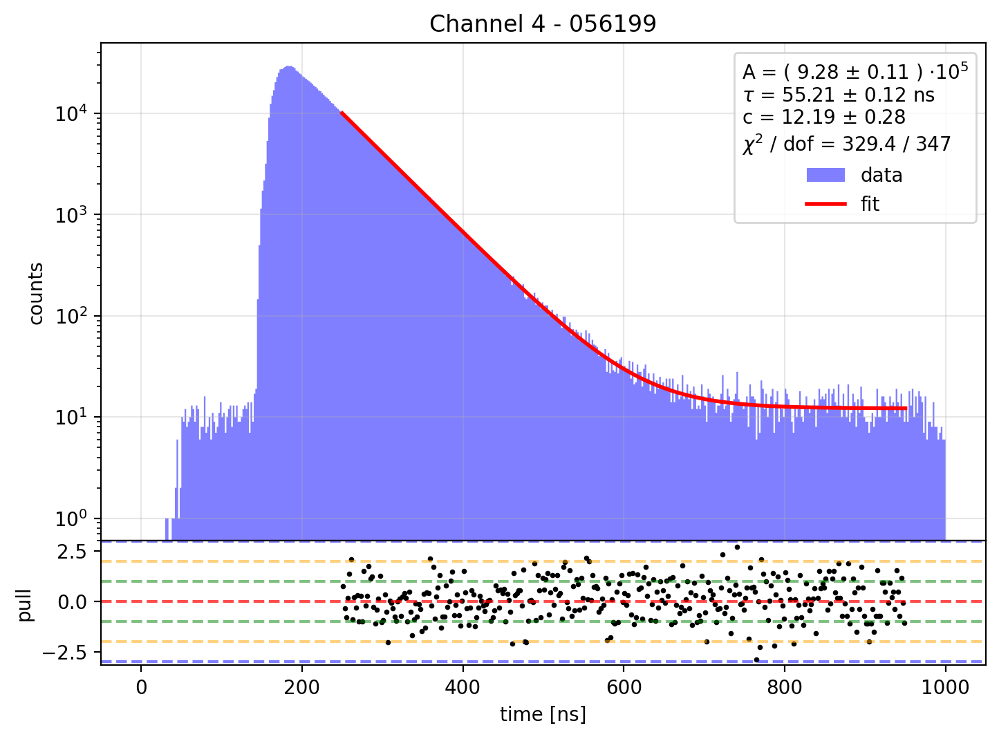

Fit results:
A = 1012331.9324317024 +/- 10944.58282299887
tau = 55.63926018564703 +/- 0.10880322081858618 ns
c = 11.91001474243767 +/- 0.282731040967235
  = 71737.56937296064 +/- 1702.9733467084786 Hz
chi2 / dof = 442.3892471500748 / 347
p-value = 0.0003915698787170241


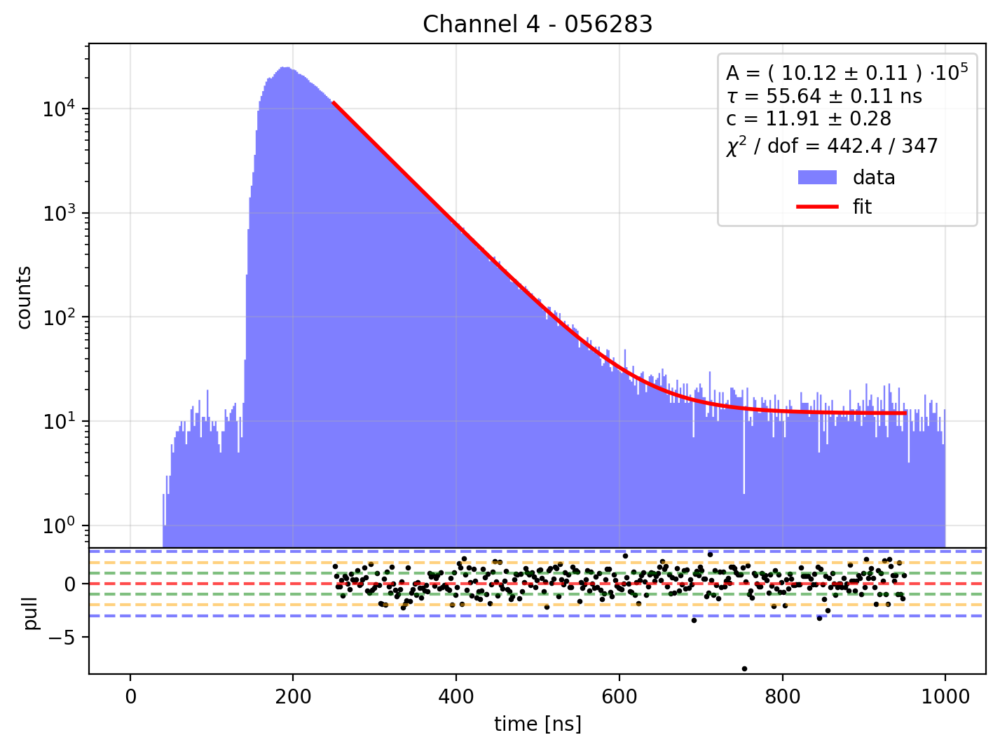

Fit results:
A = 882125.2791185088 +/- 10104.42568752542
tau = 55.90079616614785 +/- 0.11631971468977893 ns
c = 11.913598312154926 +/- 0.2804354720443998
  = 72589.0077755534 +/- 1708.6804613852928 Hz
chi2 / dof = 429.5458510741617 / 347
p-value = 0.001644136922760553


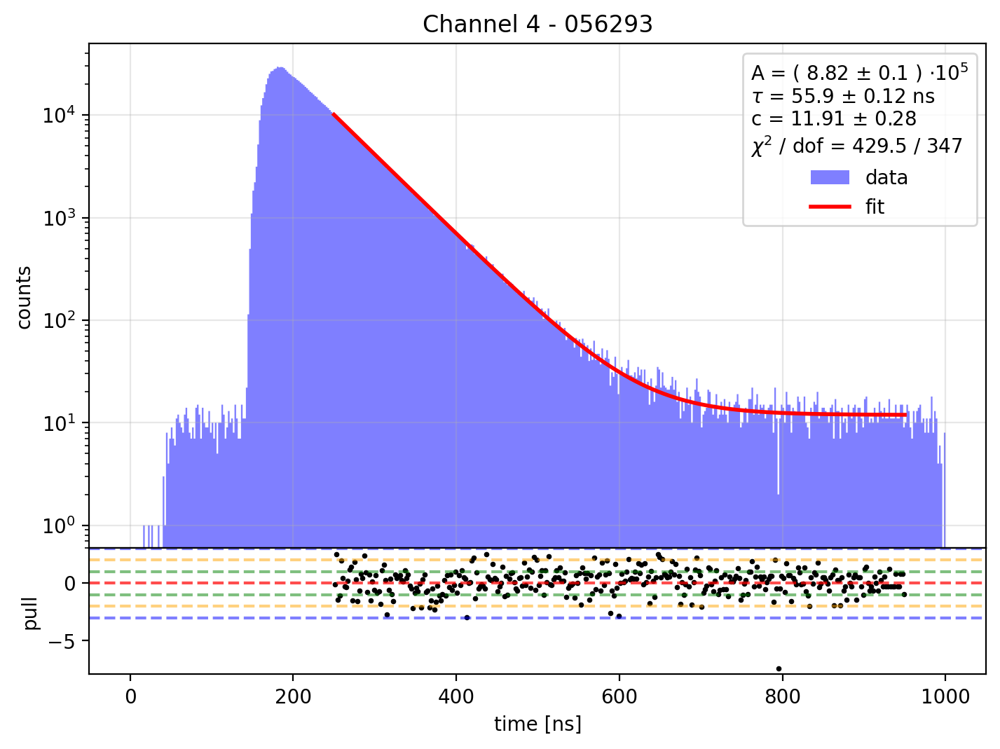

Fit results:
A = 886833.6703294574 +/- 9942.038994800592
tau = 56.14664038285147 +/- 0.11471941780070286 ns
c = 11.71571581324828 +/- 0.2796967862948936
  = 70407.7922405815 +/- 1680.890312953843 Hz
chi2 / dof = 340.56837482116305 / 347
p-value = 0.5871878374146344


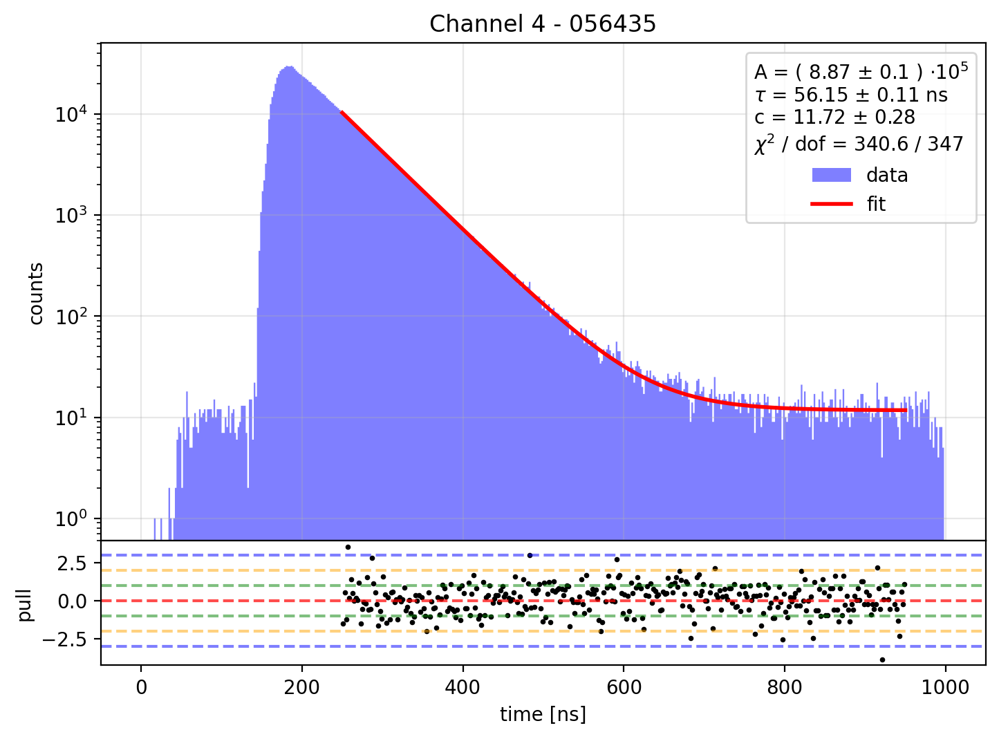

Fit results:
A = 930686.9326294849 +/- 10275.97842264047
tau = 56.07130750359901 +/- 0.1127203530424939 ns
c = 12.297830489187232 +/- 0.28551037552428316
  = 72508.22782912888 +/- 1683.3742646149499 Hz
chi2 / dof = 390.7682479327396 / 347
p-value = 0.05247145264195574


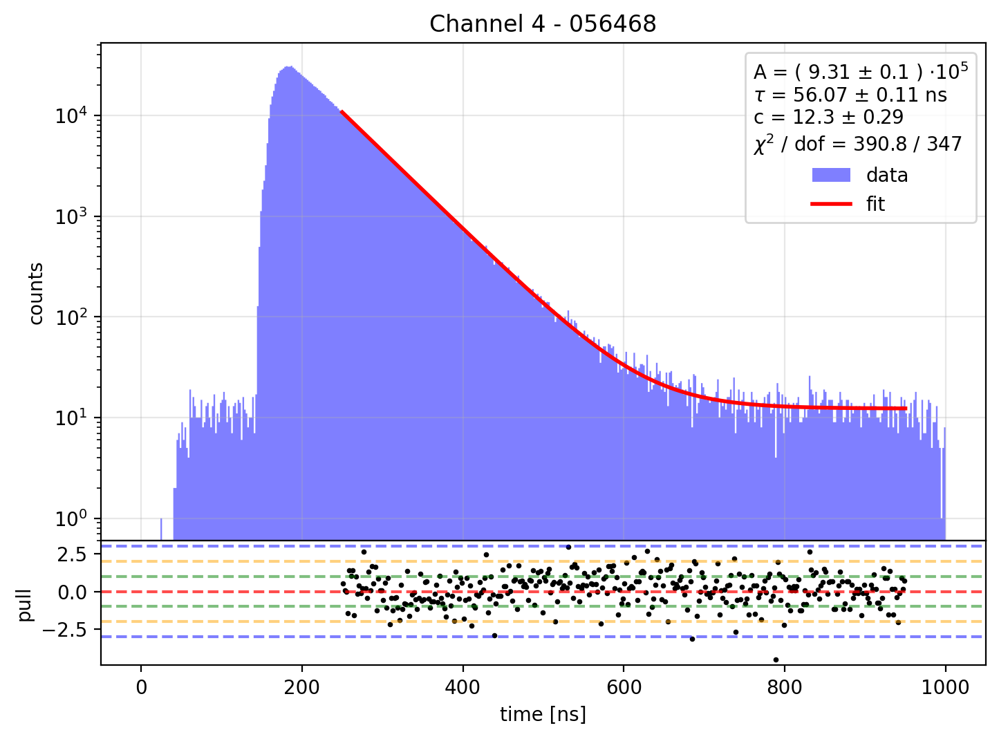

Fit results:
A = 914364.7498648715 +/- 10079.285343048283
tau = 56.1252845831323 +/- 0.11271987530006462 ns
c = 11.969771253941346 +/- 0.28341720076423815
  = 72008.15298229748 +/- 1704.9907402136714 Hz
chi2 / dof = 309.5383298915846 / 347
p-value = 0.9266295345732091


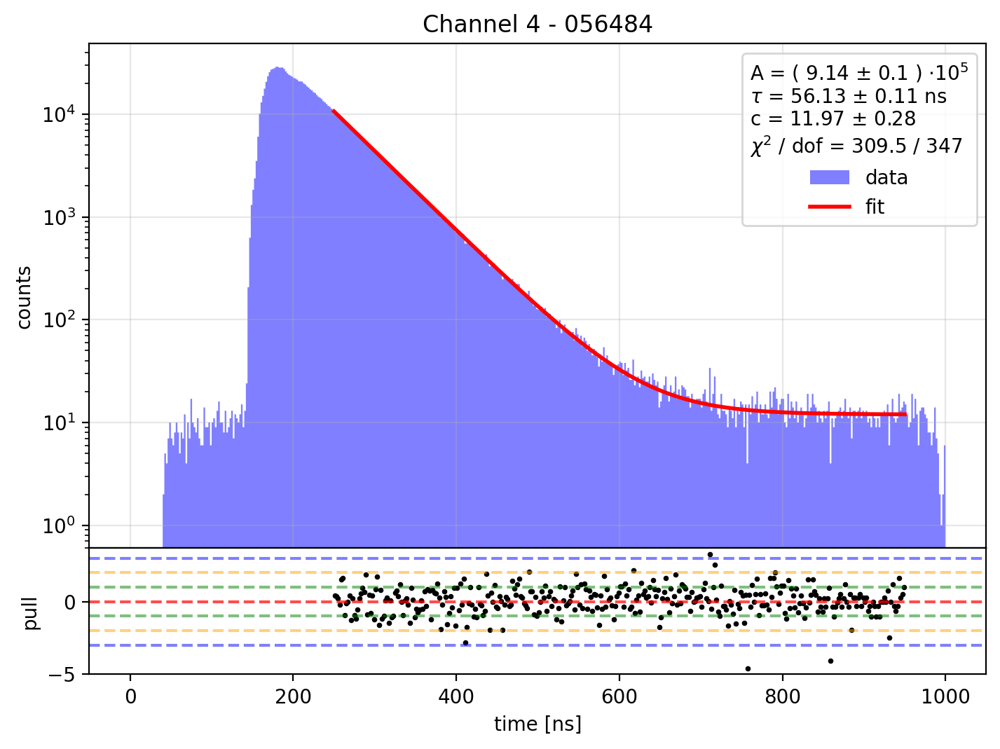

Fit results:
A = 893038.9639432096 +/- 10168.964971937907
tau = 55.83724755967031 +/- 0.1153714689883945 ns
c = 11.590090144820477 +/- 0.2774590146697813
  = 70296.65165411451 +/- 1682.8548750547768 Hz
chi2 / dof = 359.6359077602831 / 347
p-value = 0.3088245582412872


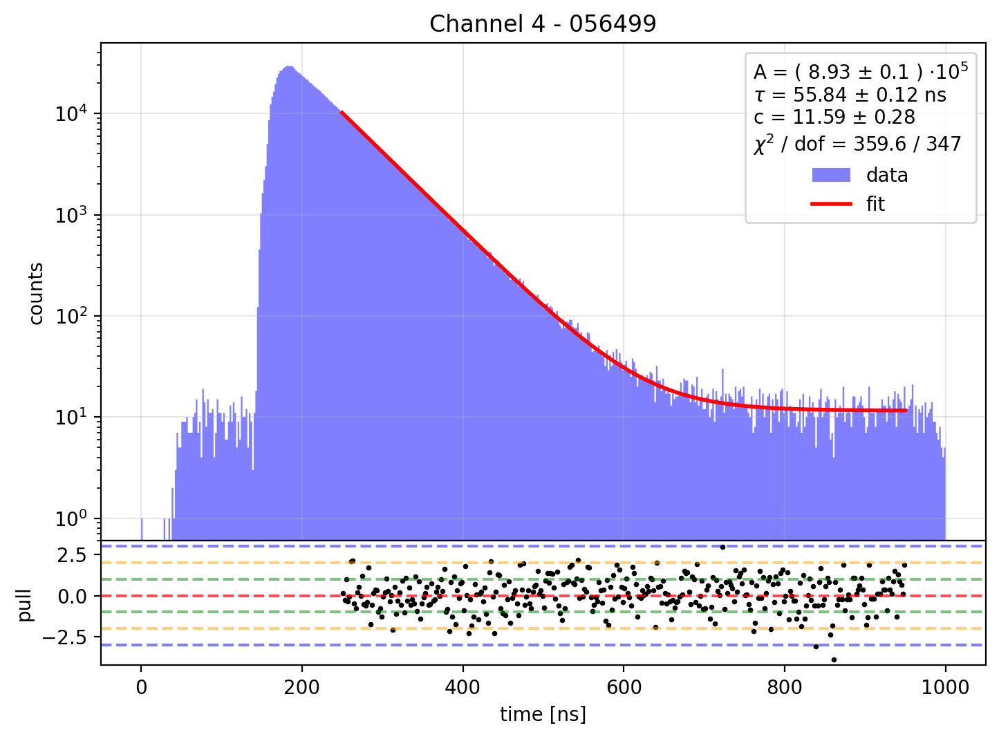

Fit results:
A = 885354.9625265723 +/- 10230.444143117566
tau = 55.744352378383475 +/- 0.11675459272576978 ns
c = 12.047759990270619 +/- 0.2807412616413245
  = 73834.72648659462 +/- 1720.523506737213 Hz
chi2 / dof = 334.1513409968264 / 347
p-value = 0.6802839501735602


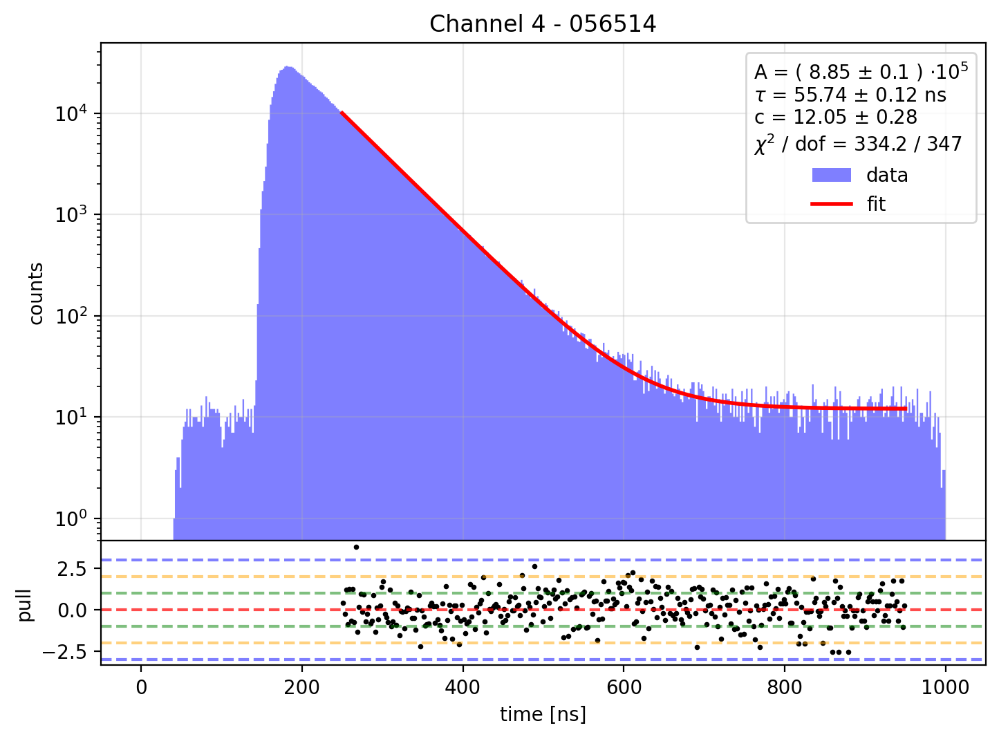

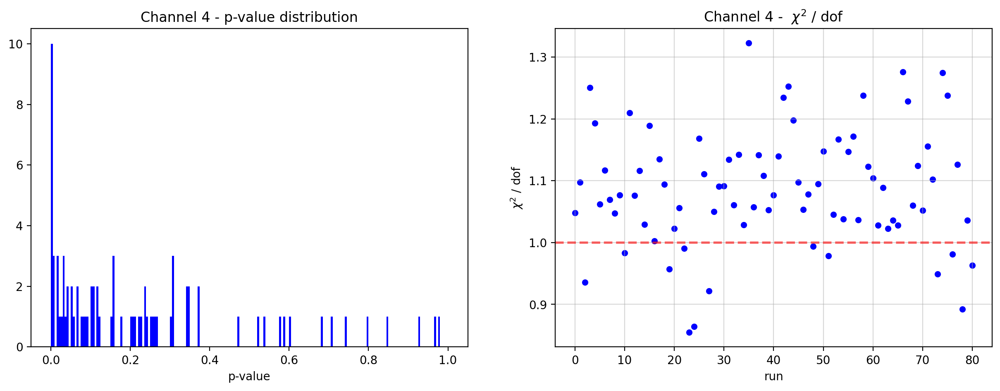

In [20]:

# channel 4

channel = 4
taus = []
taus_err = []
red_ch2 = []
p_values = []
noise_rates = []
delta_noise_rates = []

for i in range(len(run_list)):
    tau,tau_err,red_ch2_buff,p_value,noise_rate,delta_noise_rate = exp_fit(ref_mon[i], tmax=1000,nbins=500,t1=250,t2=950,p0=[1e5,58,10],title='Channel 4 - '+run_list[i],run_id=run_list[i])
    taus.append(tau)
    taus_err.append(tau_err)
    red_ch2.append(red_ch2_buff)
    p_values.append(p_value)
    noise_rates.append(noise_rate)
    delta_noise_rates.append(delta_noise_rate)
    
        

fig,ax = plt.subplots(nrows=1,ncols=2,figsize=(15,5),dpi=200)

ax[0].hist(p_values,range=(0,1),bins=200,color='blue')
ax[0].set_xlabel('p-value')
ax[0].set_title('Channel 4 - p-value distribution')

ax[1].scatter(np.arange(len(run_list)),red_ch2,s=20,c='blue',marker='o')
ax[1].axhline(1,linestyle='dashed',linewidth=2,c='red',alpha=0.6)
ax[1].set_title('Channel 4 -  $\chi^2$ / dof')
ax[1].set_xlabel('run')
ax[1].set_ylabel(r'$\chi^2$ / dof')
ax[1].grid(alpha=0.5)

plt.show()


In [21]:
dataframe["tau"] = taus
dataframe["err_tau"] = taus_err

In [22]:
dataframe.to_csv("results_ref_mon.csv")

In [23]:
dataframe

,Date,Run,tau,err_tau
0,2023-10-04 13:52:17.552,054318,57.345885,0.110956
1,2023-10-05 10:47:01.409,054370,57.063791,0.115941
2,2023-10-05 10:53:18.221,054371,57.120104,0.113284
3,2023-10-05 12:48:19.361,054374,57.004610,0.110500
4,2023-10-05 12:55:48.682,054375,57.286767,0.112724
...,...,...,...,...
76,2023-11-24 18:14:06.174,056435,56.146640,0.114719
77,2023-11-25 11:39:33.871,056468,56.071308,0.112720
78,2023-11-26 10:03:08.293,056484,56.125285,0.112720
79,2023-11-27 15:34:27.922,056499,55.837248,0.115371


[Timestamp('2023-10-04 13:52:17.552000'), Timestamp('2023-10-05 10:47:01.409000'), Timestamp('2023-10-05 10:53:18.221000'), Timestamp('2023-10-05 12:48:19.361000'), Timestamp('2023-10-05 12:55:48.682000'), Timestamp('2023-10-05 14:44:10.118000'), Timestamp('2023-10-05 14:50:18.147000'), Timestamp('2023-10-06 08:53:43.461000'), Timestamp('2023-10-06 13:51:33.850000'), Timestamp('2023-10-07 06:55:12.647000'), Timestamp('2023-10-07 15:31:44.898000'), Timestamp('2023-10-08 08:12:15.103000'), Timestamp('2023-10-08 15:29:06.087000'), Timestamp('2023-10-09 11:57:40.281000'), Timestamp('2023-10-09 15:59:51.556000'), Timestamp('2023-10-10 15:28:05.959000'), Timestamp('2023-10-11 07:41:32.933000'), Timestamp('2023-10-11 15:23:33.223000'), Timestamp('2023-10-12 08:29:32.491000'), Timestamp('2023-10-13 09:31:51.872000'), Timestamp('2023-10-13 17:30:35.631000'), Timestamp('2023-10-14 08:18:49.615000'), Timestamp('2023-10-14 16:53:39.678000'), Timestamp('2023-10-15 07:17:13.146000'), Timestamp('2023

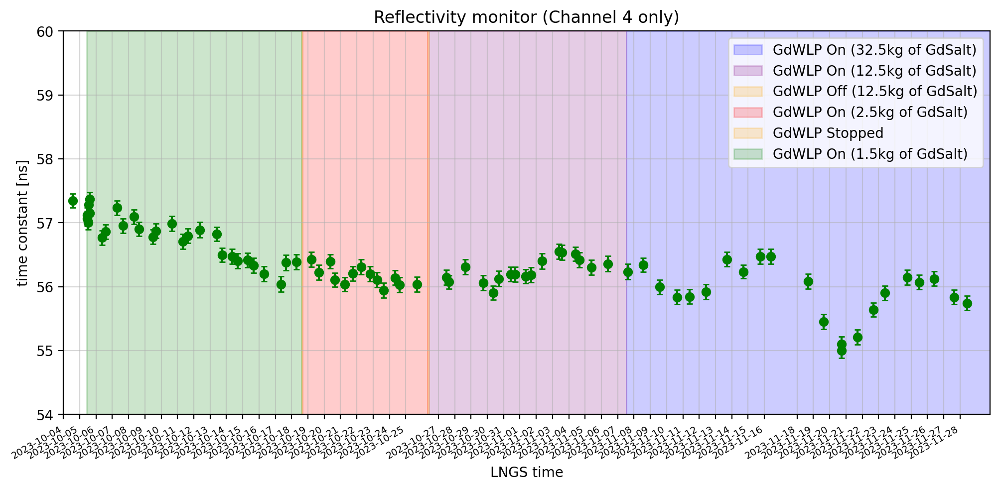

In [24]:
import datetime
from datetime import datetime
# plot the time constant evolution made from the weighted average of
# the taus of the ref_mon runs

plt.figure(figsize=(12,5),dpi=200)

plt.errorbar(date,taus,yerr=taus_err,fmt='o',color='green',capsize=2)

print(date) 
plt.title('Reflectivity monitor (Channel 4 only)')
plt.xlabel('LNGS time')
plt.ylabel('time constant [ns]')
plt.grid(alpha=0.5)
plt.gca().axvspan(datetime(2023,11,29,20,18),datetime(2023,11,7,12,49),color='blue',alpha=0.2,label='GdWLP On (32.5kg of GdSalt)',zorder=1)
plt.gca().axvspan(datetime(2023,11,7,12,48),datetime(2023,10,26,10,18),color='purple',alpha=0.2,label='GdWLP On (12.5kg of GdSalt)',zorder=1)
plt.gca().axvspan(datetime(2023,10,26,10,18),datetime(2023,10,26,8,10),color='orange',alpha=0.2,label='GdWLP Off (12.5kg of GdSalt)',zorder=1)
plt.gca().axvspan(datetime(2023,10,26,8,10),datetime(2023,10,18,16,10),color='red',alpha=0.2,label='GdWLP On (2.5kg of GdSalt)',zorder=1)
plt.gca().axvspan(datetime(2023,10,18,16,10),datetime(2023,10,18,14,34),color='orange',alpha=0.2,label='GdWLP Stopped',zorder=1)
plt.gca().axvspan(datetime(2023,10,18,14,34),datetime(2023,10,5,10,00),color='green',alpha=0.2,label='GdWLP On (1.5kg of GdSalt)',zorder=1)
plt.gca().margins(x=0)
# Supponiamo che timestamp_str sia la tua stringa di timestamp
from datetime import datetime

# Convert to just the date part and make them unique
unique_dates = list(set([ts.date() for ts in date]))
# Sort the unique dates
unique_dates.sort()
date_str= [str(i) for i in unique_dates]
timestamp_obj = [datetime.strptime(timestamp_str, '%Y-%m-%d') for timestamp_str in date_str]

# Estrai l'anno, il mese e la data come stringhe
year_month_date_str = [i.strftime('%Y-%m-%d') for i in timestamp_obj]
plt.ylim(54,60)
plt.legend(loc="best")
plt.xticks(unique_dates,year_month_date_str,rotation = 30,ha="right",fontsize=7)

plt.savefig("./figures/ref_monitor_gd_ops.png")
plt.xlim()
plt.show()


# Diffuser Ball vs Ref mon

In [ ]:
55136

# Check of Raw Records : 

In [28]:
run_list = ["054197","054114","053992","053923","054318"]

In [124]:
run_id = run_list[0]
rr = st.get_array(run_list[0],"raw_records_nv",_chunk_number=0)
hitlets = st.get_array(run_list[0],"hitlets_nv")

Loading raw_records_nv: |          | 0.00 % [00:00<?]

Loading hitlets_nv: |          | 0.00 % [00:00<?]

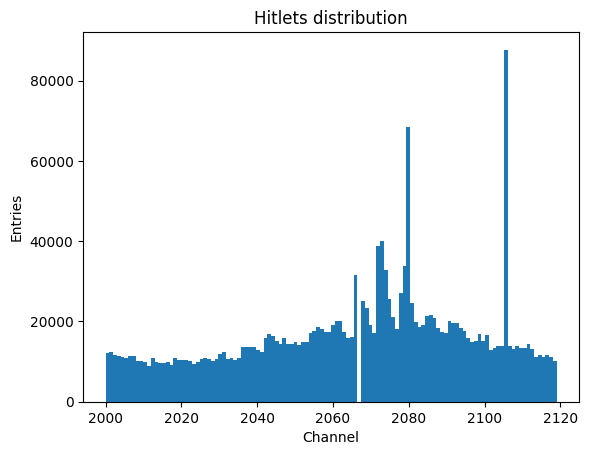

106


In [125]:
a,b,_= plt.hist(hitlets["channel"],bins=120)
plt.title("Hitlets distribution")
plt.xlabel("Channel")
plt.ylabel("Entries")
plt.show()
print(np.argmax(a))

In [121]:
def conta_occorrenze_valori(array):
    conteggio_valori = np.zeros(120)

    for valore in array:
        if valore >= 2000 and valore <= 2120:
            if valore in conteggio_valori:
                conteggio_valori[valore-2000] += 1
            else:
                conteggio_valori[valore-2000] = 1

    return conteggio_valori

# Esempio di utilizzo
risultato = conta_occorrenze_valori(hitlets["channel"])


In [122]:
from matplotlib.colors import LogNorm
def reshape_hist_for_imshow(data):
    # placement for plt.imshow(..., origin='lower')
    pmt_list = [2000, 2006, 2012, 2018, 2024, 2030, 2036, 2042, 2048, 2054,
                2060, 2066, 2072, 2078, 2084, 2090, 2096, 2102, 2108, 2114,
                2001, 2007, 2013, 2019, 2025, 2031, 2037, 2043, 2049, 2055,
                2061, 2067, 2073, 2079, 2085, 2091, 2097, 2103, 2109, 2115,
                2002, 2008, 2014, 2020, 2026, 2032, 2038, 2044, 2050, 2056,
                2062, 2068, 2074, 2080, 2086, 2092, 2098, 2104, 2110, 2116,
                2003, 2009, 2015, 2021, 2027, 2033, 2039, 2045, 2051, 2057,
                2063, 2069, 2075, 2081, 2087, 2093, 2099, 2105, 2111, 2117,
                2004, 2010, 2016, 2022, 2028, 2034, 2040, 2046, 2052, 2058,
                2064, 2070, 2076, 2082, 2088, 2094, 2100, 2106, 2112, 2118,
                2005, 2011, 2017, 2023, 2029, 2035, 2041, 2047, 2053, 2059,
                2065, 2071, 2077, 2083, 2089, 2095, 2101, 2107, 2113, 2119]
    pmt_list =np.array(pmt_list) - 2000
    data = data[pmt_list]
    data = np.reshape(data, (6,20))
    return data

im_opt = dict(origin='lower')
iml_opt = dict(origin='lower',norm=LogNorm())
ch_opt = dict(bins=120, range=(2000-0.5, 2120-0.5), histtype='step')
#cbar = plt.colorbar(orientation='horizontal', pad=0.2) # colorbar

In [123]:
risultato

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1.])

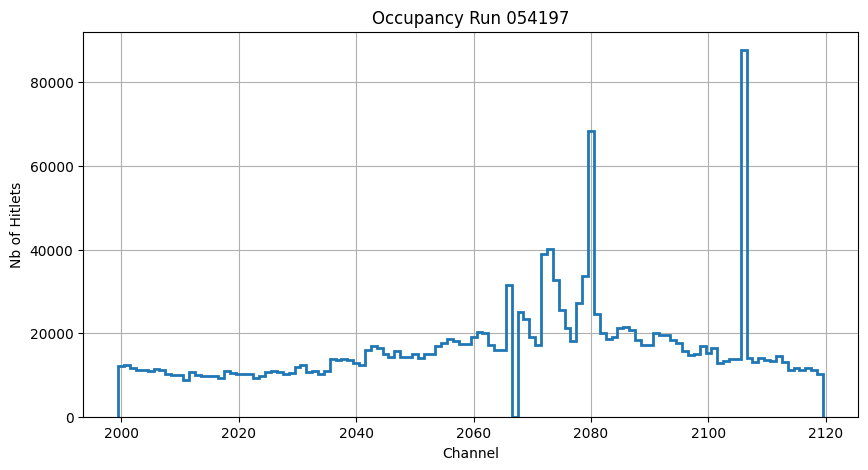

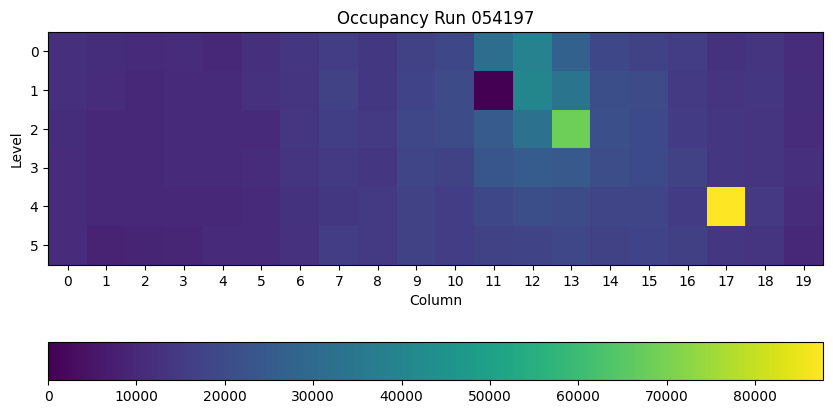

In [126]:
plt.figure(figsize=(10,5))
hist = plt.hist(x=np.arange(2000,2120),weights=a, **ch_opt,linewidth=2)

plt.title("Occupancy Run {}".format(run_id))
plt.xlabel("Channel")
plt.ylabel("Nb of Hitlets")
plt.grid(True)
plt.figure(figsize=(10,5))
plt.imshow(reshape_hist_for_imshow(hist[0]))
x = np.arange(0,20) # the grid to which your data corresponds
nx = x.shape[0]
no_labels = 20 # how many labels to see on axis x
step_x = int(nx / (no_labels - 1)) # step between consecutive labels
x_positions = np.arange(0,nx,step_x) # pixel count at label position
x_labels = x[::step_x] # labels you want to see
plt.xticks(x_positions, x_labels)
plt.xlabel("Column")
plt.ylabel("Level")
plt.title("Occupancy Run {}".format(run_id))
cbar = plt.colorbar(orientation='horizontal', pad=0.2)


In [13]:
old_rr = st.get_array("056515","raw_records_nv",seconds_range=(0,2),selection_str="channel==2000")
new_rr = st.get_array("056574","raw_records_nv",seconds_range=(0,2),selection_str="channel==2000")

Loading raw_records_nv: |          | 0.00 % [00:00<?]

/opt/XENONnT/anaconda/envs/XENONnT_development/lib/python3.9/site-packages/strax/utils.py:697: UserWarning: The option "selection_str" is depricated and will be removed in a future release. Please use "selection" instead.
  warn('The option "selection_str" is depricated and will be removed in a future release. '


Loading raw_records_nv: |          | 0.00 % [00:00<?]

/opt/XENONnT/anaconda/envs/XENONnT_development/lib/python3.9/site-packages/strax/utils.py:697: UserWarning: The option "selection_str" is depricated and will be removed in a future release. Please use "selection" instead.
  warn('The option "selection_str" is depricated and will be removed in a future release. '


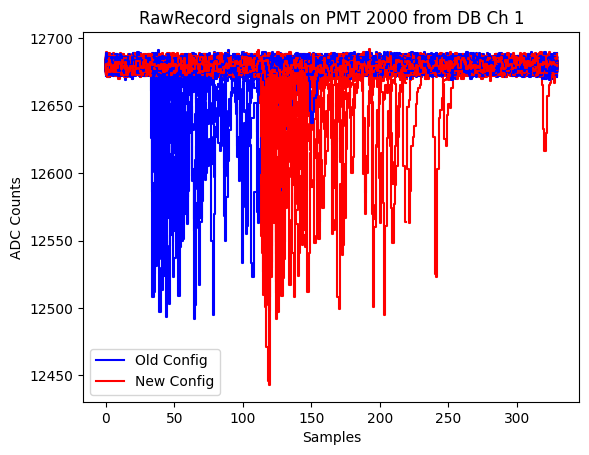

In [16]:
mask_0_old = old_rr["record_i"]==0
mask_1_old = old_rr["record_i"]==1
mask_2_old = old_rr["record_i"]==2
mask_0_new = new_rr["record_i"]==0
mask_1_new = new_rr["record_i"]==1
mask_2_new = new_rr["record_i"]==2
plt.figure()
plt.step(np.arange(0,110),old_rr[mask_0_old]["data"][0],color="blue",label="Old Config")
plt.step(np.arange(0,110),new_rr[mask_0_new]["data"][0],color="red",label="New Config")
for r in range(0,200):
    plt.step(np.arange(0,110),old_rr[mask_0_old]["data"][r],color="blue")
    plt.step(np.arange(110,220),old_rr[mask_1_old]["data"][r],color="blue")
    plt.step(np.arange(220,330),old_rr[mask_2_old]["data"][r],color="blue")
    plt.step(np.arange(0,110),new_rr[mask_0_new]["data"][r],color="red")
    plt.step(np.arange(110,220),new_rr[mask_1_new]["data"][r],color="red")
    plt.step(np.arange(220,330),new_rr[mask_2_new]["data"][r],color="red")
plt.xlabel("Samples")
plt.ylabel("ADC Counts")
plt.title("RawRecord signals on PMT 2000 from DB Ch 1")
plt.legend()
plt.show()